# Load Data From CSV file

In [53]:
import gym
import gym_anytrading
import pandas as pd
import numpy as np
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3 import A2C
from gym import spaces
from datetime import datetime
from IPython import display
from matplotlib import pyplot as plt
from stable_baselines3 import PPO
df=pd.read_csv('/Users/danies/Desktop/projects/Stock/bitstampUSD_1-min_data_2012-01-01_to_2021-03-31.csv')
df


,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
0,1325317920,4.39,4.39,4.39,4.39,0.455581,2.000000,4.390000
1,1325317980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1325318040,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1325318100,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1325318160,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
4857372,1617148560,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339
4857373,1617148620,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508
4857374,1617148680,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496
4857375,1617148740,58742.18,58770.38,58742.18,58760.59,0.720415,42332.958633,58761.866202


# Data processing

In [54]:
#Drop the null values
df=df.dropna()
#Rename Volume column 
df=df.rename(columns = {'Volume_(BTC)':'Volume'})
df

,Timestamp,Open,High,Low,Close,Volume,Volume_(Currency),Weighted_Price
0,1325317920,4.39,4.39,4.39,4.39,0.455581,2.000000,4.390000
478,1325346600,4.39,4.39,4.39,4.39,48.000000,210.720000,4.390000
547,1325350740,4.50,4.57,4.50,4.57,37.862297,171.380338,4.526411
548,1325350800,4.58,4.58,4.58,4.58,9.000000,41.220000,4.580000
1224,1325391360,4.58,4.58,4.58,4.58,1.502000,6.879160,4.580000
...,...,...,...,...,...,...,...,...
4857372,1617148560,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339
4857373,1617148620,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508
4857374,1617148680,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496
4857375,1617148740,58742.18,58770.38,58742.18,58760.59,0.720415,42332.958633,58761.866202


# Create Environment

In [55]:
train_env=lambda: gym.make('stocks-v0',df=df,frame_bound=(20,int(len(df)*0.8)),window_size=20)
env=DummyVecEnv([train_env])


# Train Model Using Entire Dataset and Stocks-v0 Enviroment


https://github.com/AminHP/gym-anytrading
https://www.youtube.com/watch?v=D9sU1hLT0QY&t=1989s

In [56]:
from stable_baselines3 import PPO
model=PPO('MlpPolicy',env,verbose=1)
model.learn(total_timesteps=1000)

Using cpu device
-------------------------------------
| time/                 |           |
|    fps                | 1729      |
|    iterations         | 1         |
|    time_elapsed       | 1         |
|    total_timesteps    | 2048      |
| train/                |           |
|    entropy_loss       | -0.186    |
|    explained_variance | -7.21e+04 |
|    learning_rate      | 0.0007    |
|    n_updates          | 2000      |
|    policy_loss        | -0.00338  |
|    value_loss         | 0.00631   |
-------------------------------------


# Evaluate Reward

In [57]:
test_env=gym.make('stocks-v0',df=df,frame_bound=(len(df)-10000,len(df)),window_size=20)
obs=test_env.reset()
while True:
    obs=obs[np.newaxis,...]
    action,_states=model.predict(obs)
    obs,rewards, done, info=test_env.step(action)
    if done:
        print("info",info)
        break

info {'total_reward': 1198.849999999984, 'total_profit': 3.027461545676451e-16, 'position': 0}


# Visulize Trading History

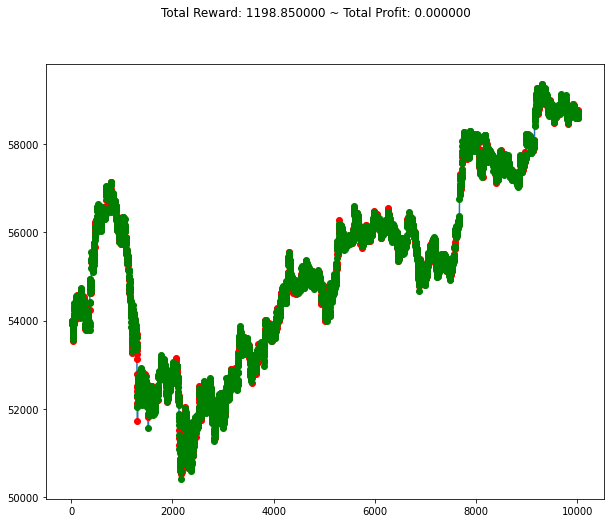

In [58]:
plt.figure(figsize=(10,8))
plt.cla()
test_env.render_all()
plt.show()

# Adding New Indicators
https://www.youtube.com/watch?v=q-Uw9gC3D4o&t=471s


In [59]:
from stockstats import StockDataFrame
from gym_anytrading.envs import StocksEnv
from finta import TA

df['RSI']=TA.RSI(df)
df['OBV']=TA.OBV(df)
df['SSMA']=TA.SSMA(df)

df=df.dropna()
df.columns= df.columns.str.strip().str.lower() 
stock = StockDataFrame.retype(df)
stock.get('macd') 

stock



,timestamp,open,high,low,close,volume,volume_(currency),weighted_price,rsi,obv,ssma,macd,macds,macdh
547,1325350740,4.50,4.57,4.50,4.57,37.862297,171.380338,4.526411,100.000000,37.862297,4.457189,0.000000,0.000000,0.000000
548,1325350800,4.58,4.58,4.58,4.58,9.000000,41.220000,4.580000,100.000000,46.862297,4.493509,0.000224,0.000125,0.000100
1896,1325431680,4.84,4.84,4.84,4.84,10.000000,48.400000,4.840000,100.000000,56.862297,4.586342,0.008348,0.003495,0.004853
2333,1325457900,5.00,5.00,5.00,5.00,10.100000,50.500000,5.000000,100.000000,66.962297,4.668192,0.017616,0.008278,0.009337
4553,1325591100,5.32,5.32,5.32,5.32,2.419173,12.870000,5.320000,100.000000,69.381470,4.829148,0.035014,0.016232,0.018782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4857372,1617148560,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339,51.857139,-537590.424692,58678.534962,8.582967,1.350172,7.232794
4857373,1617148620,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508,51.826141,-537597.719540,58679.343299,7.908077,2.661753,5.246324
4857374,1617148680,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496,57.324721,-537596.013857,58684.287377,10.322930,4.193989,6.128941
4857375,1617148740,58742.18,58770.38,58742.18,58760.59,0.720415,42332.958633,58761.866202,61.855629,-537595.293442,58692.765446,15.028892,6.360969,8.667923


# Capitalize Column Name

In [60]:
stock.columns= stock.columns.str.strip().str.capitalize()
df.columns= df.columns.str.strip().str.capitalize() 

# Customize Environment in StocksEnv Library


## Price Only: PPO

In [61]:
def add_signals(env):
    start = env.frame_bound[0] - env.window_size
    end = env.frame_bound[1]
    prices = env.df.loc[:, 'Low'].to_numpy()[start:end]
    signal_features = env.df.loc[:, ['Low']].to_numpy()[start:end]
    return prices, signal_features
class MyCustomPriceOnly(StocksEnv):
    _process_data = add_signals
from stable_baselines3 import PPO
env_priceonly = MyCustomPriceOnly(df=stock, window_size=20, frame_bound=(20,int(len(df)*0.8)))
env_maker = lambda: env_priceonly
env = DummyVecEnv([env_maker])
model_priceonly1 = PPO("MlpPolicy", env, verbose=1)#, tensorboard_log="/Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_priceonly_PPO")
model_priceonly1.learn(total_timesteps=10000)
#model_priceonly.save("/Users/danies/Desktop/projects/RLBitcoin/model_priceonly_PPO")
#model_priceonly=PPO.load("/Users/danies/Desktop/projects/RLBitcoin/model_priceonly_PPO.zip")

Using cpu device
-----------------------------------------
| time/                   |             |
|    fps                  | 1699        |
|    iterations           | 1           |
|    time_elapsed         | 1           |
|    total_timesteps      | 2048        |
| train/                  |             |
|    approx_kl            | 0.008141205 |
|    clip_fraction        | 0.0234      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.683      |
|    explained_variance   | -0.0541     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0374      |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00122    |
|    value_loss           | 0.0846      |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 1236        |
|    iterations           | 2           |
|    time_elapsed         | 3           |
|    total_timest

# Generate 30 Random days for validation

In [62]:
import random

days_num=[]
for i in range(30):
    num=random.randint(int(len(stock)*0.8),len(stock)-1440) #
    days_num.append(num)    

# Test  "Price Only_PPO" Model with Generated Number

https://stable-baselines.readthedocs.io/en/master/guide/examples.html

info {'total_reward': 357.79999999998654, 'total_profit': 0.006850752686574936, 'position': 1}


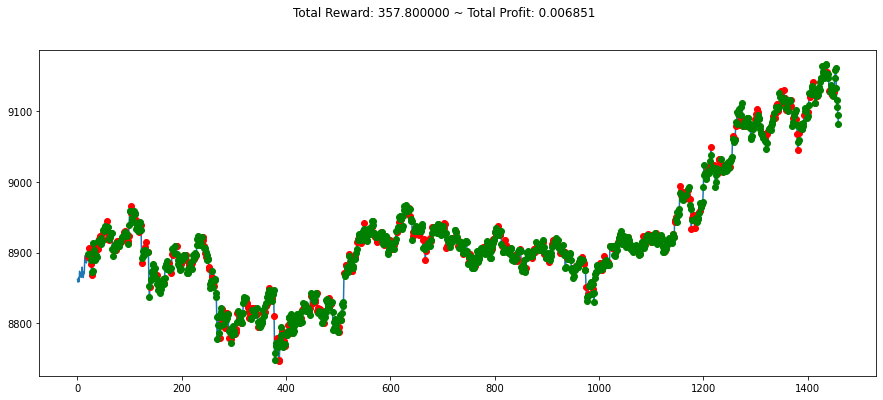

info {'total_reward': -162.82000000001062, 'total_profit': 0.00702143757236677, 'position': 1}


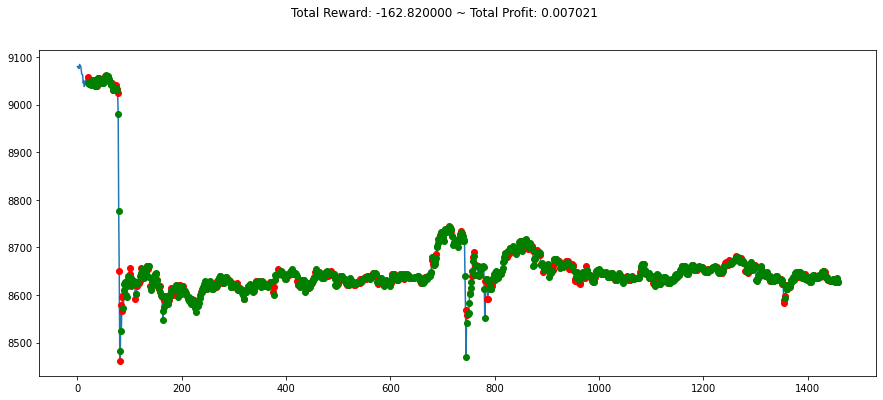

info {'total_reward': -102.61999999999898, 'total_profit': 0.007953002223173392, 'position': 0}


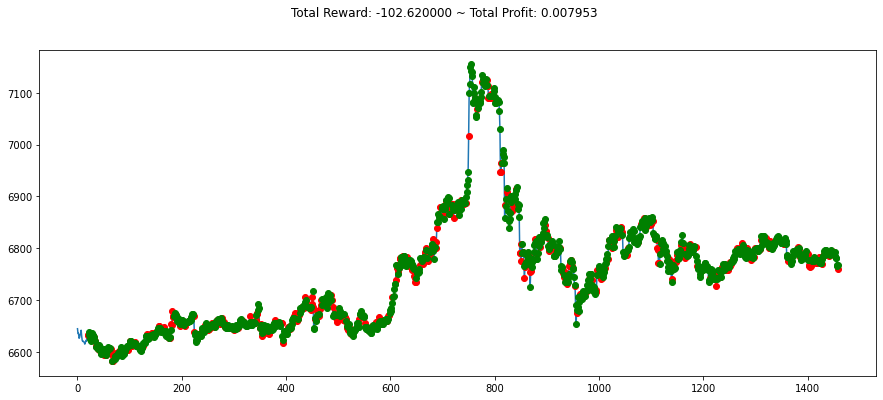

info {'total_reward': 194.30999999997584, 'total_profit': 0.00602163495010409, 'position': 1}


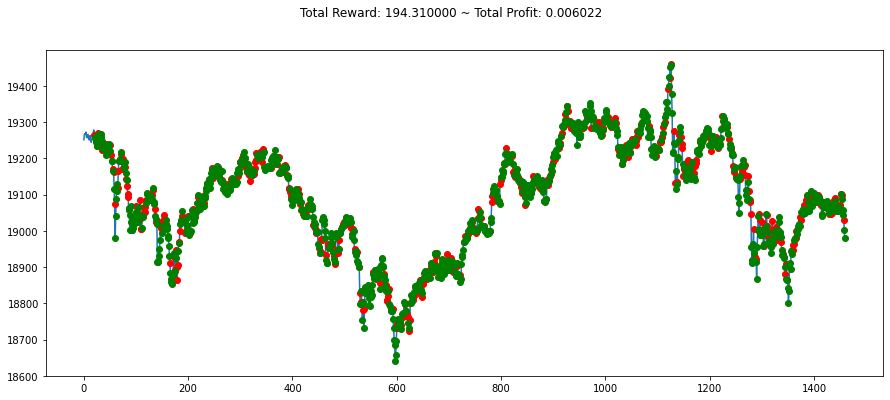

info {'total_reward': -67.92000000000735, 'total_profit': 0.00689038495154943, 'position': 1}


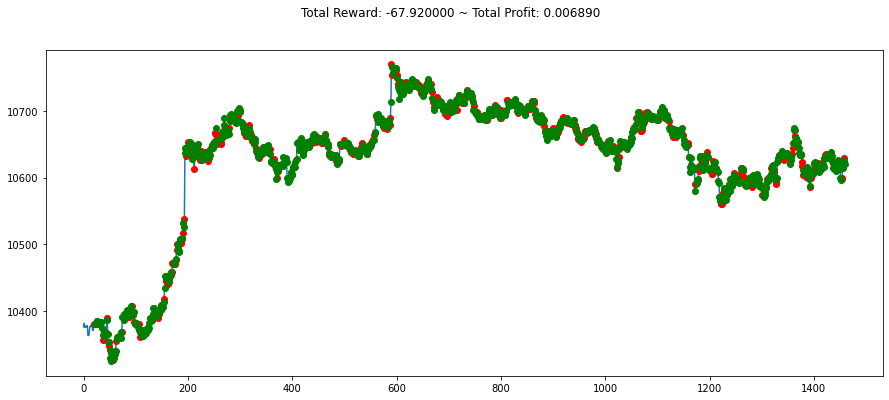

info {'total_reward': 184.94000000000415, 'total_profit': 0.005881214625949175, 'position': 0}


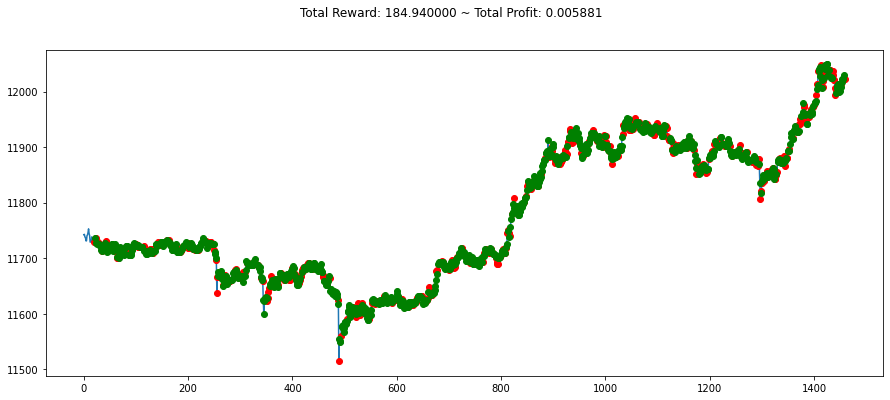

info {'total_reward': -14.620000000017171, 'total_profit': 0.007813097316536977, 'position': 1}


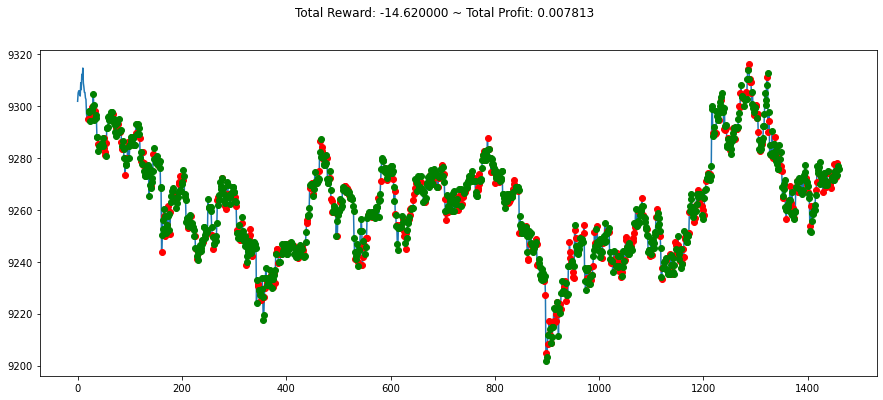

info {'total_reward': -934.3499999999694, 'total_profit': 0.005264675041215353, 'position': 0}


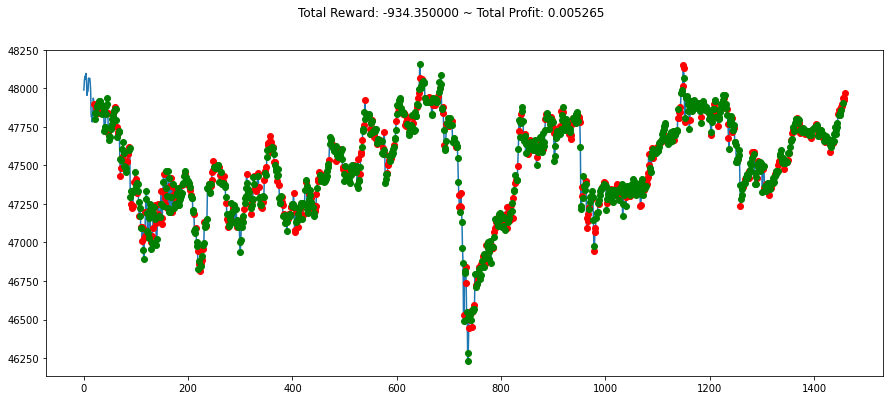

info {'total_reward': -191.51999999991676, 'total_profit': 0.0056743160507935625, 'position': 0}


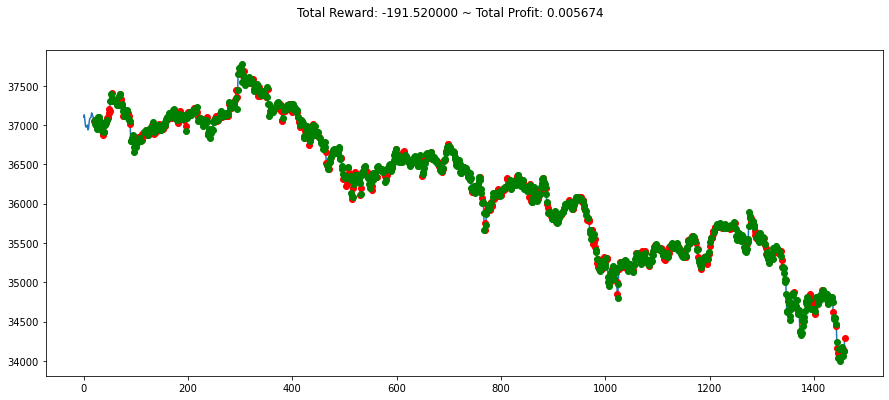

info {'total_reward': 133.88000000000284, 'total_profit': 0.005363569994264163, 'position': 0}


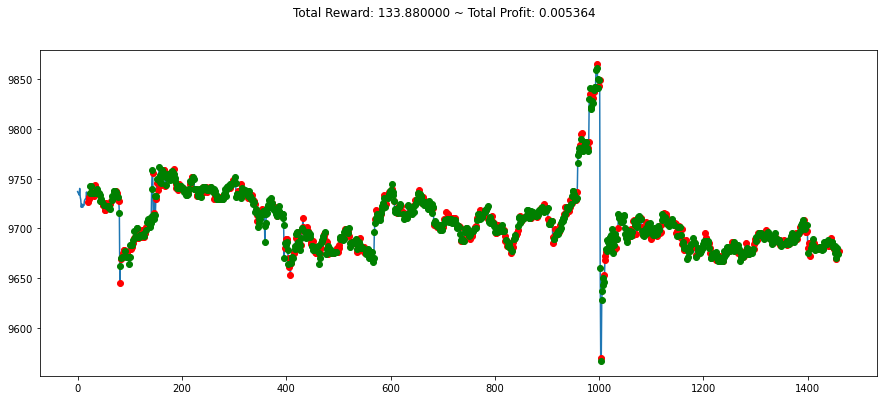

info {'total_reward': 351.88000000000557, 'total_profit': 0.009440804363135179, 'position': 0}


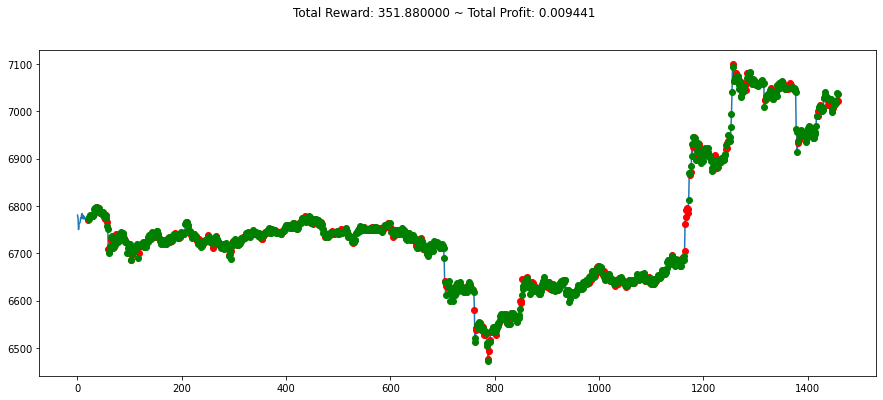

info {'total_reward': 799.3599999999642, 'total_profit': 0.007628599005971866, 'position': 1}


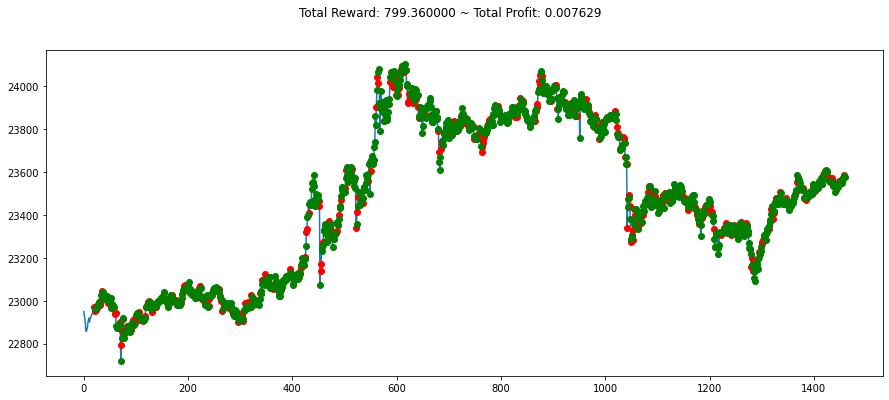

info {'total_reward': -91.49999999999818, 'total_profit': 0.005412932649147219, 'position': 1}


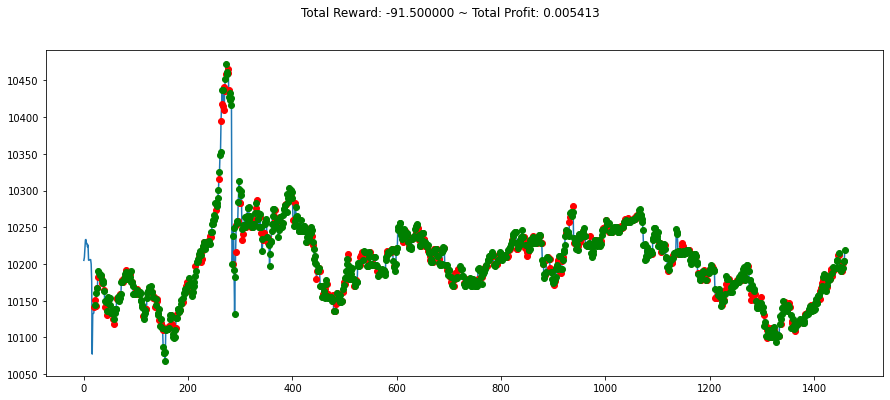

info {'total_reward': -37.81999999999789, 'total_profit': 0.006915606275860334, 'position': 1}


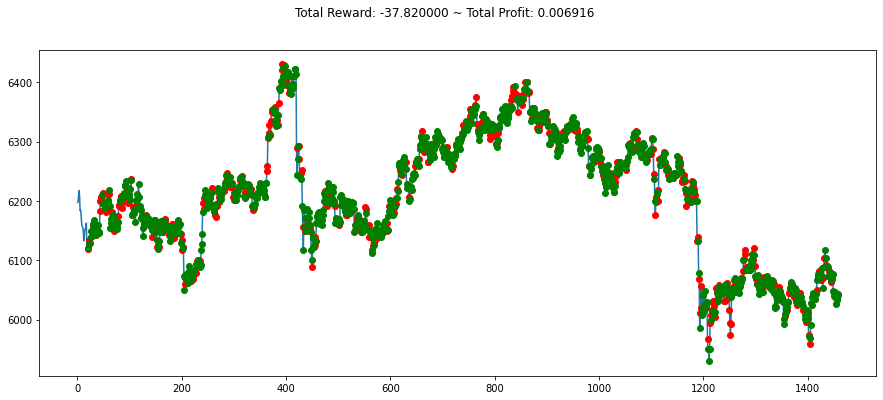

info {'total_reward': -379.1900000000096, 'total_profit': 0.007968051567125775, 'position': 1}


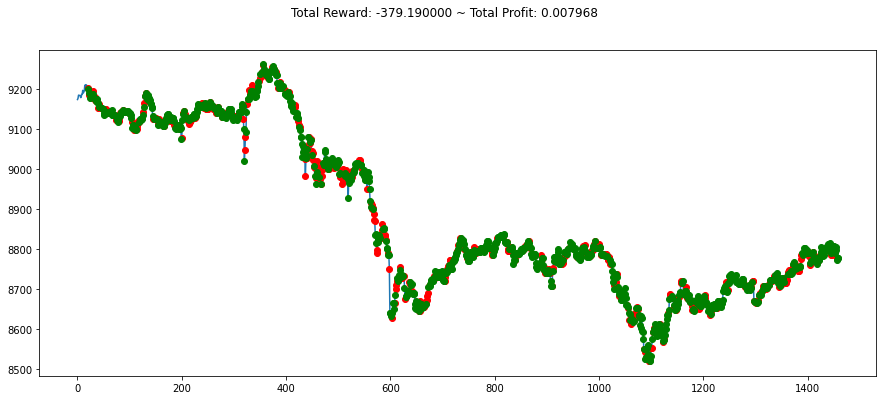

info {'total_reward': -246.41000000000258, 'total_profit': 0.00576070827813799, 'position': 1}


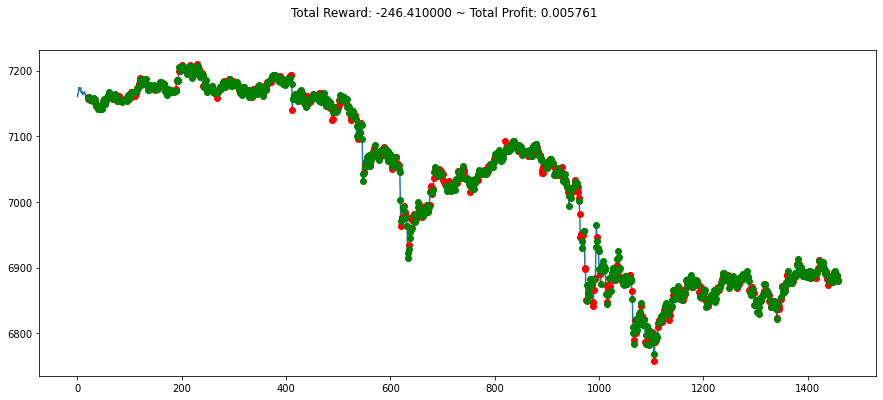

info {'total_reward': -623.3800000000037, 'total_profit': 0.00578537225590732, 'position': 0}


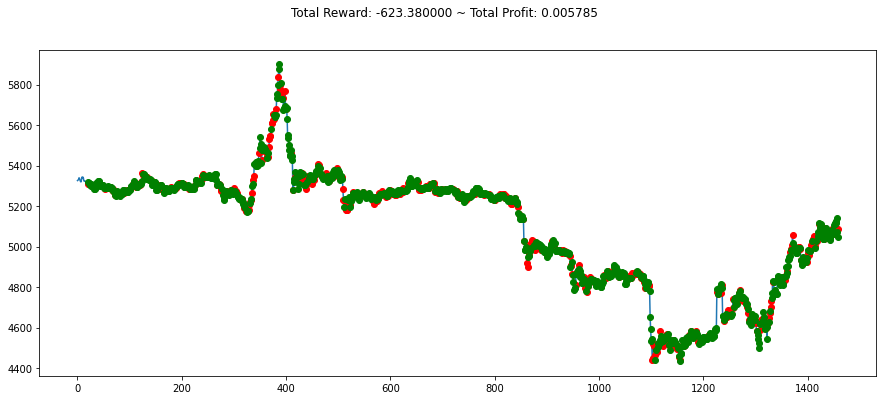

info {'total_reward': -121.17000000000371, 'total_profit': 0.007302600625698702, 'position': 0}


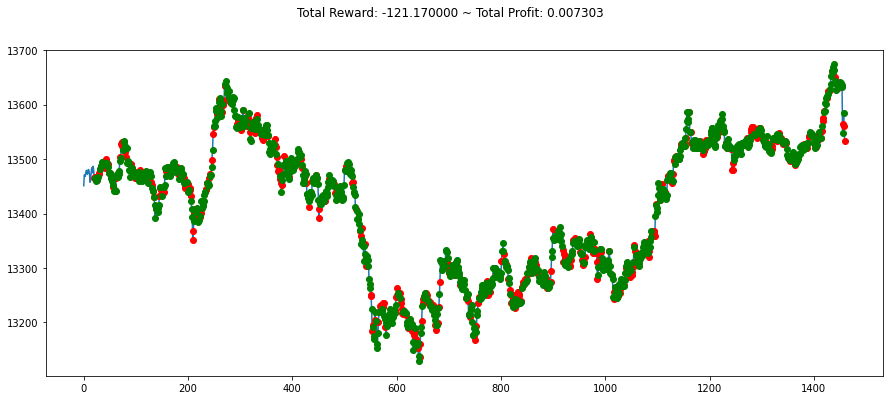

info {'total_reward': 239.18000000004395, 'total_profit': 0.006094233037421625, 'position': 1}


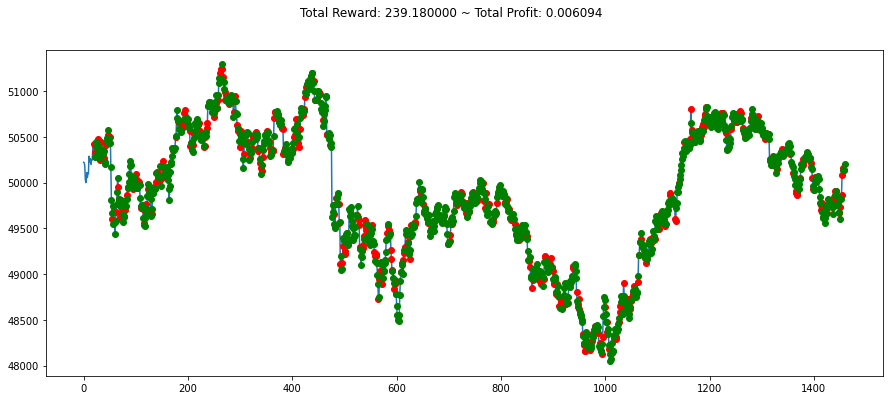

info {'total_reward': 109.43000000000029, 'total_profit': 0.004598641761832866, 'position': 1}


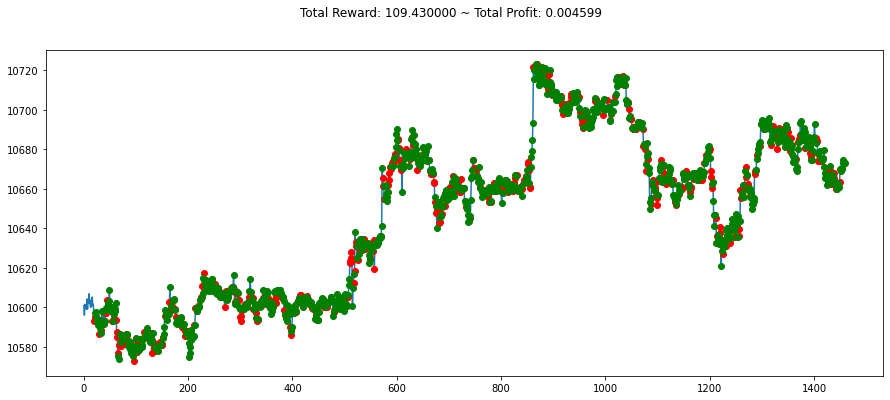

info {'total_reward': 49.129999999990105, 'total_profit': 0.007990527720371798, 'position': 1}


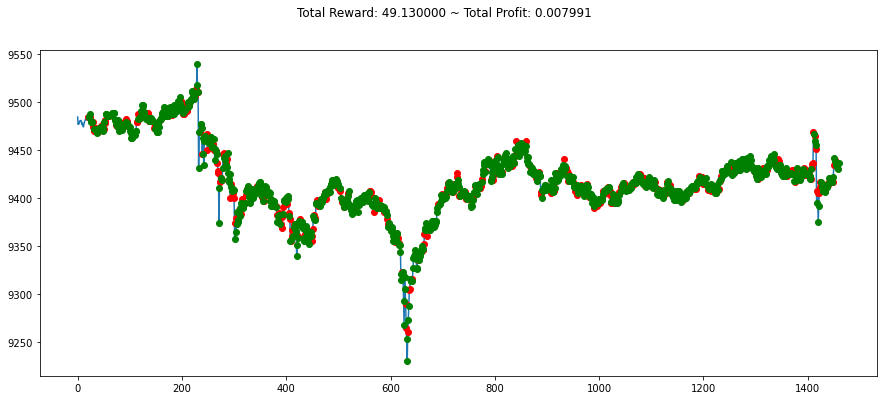

info {'total_reward': 251.85000000000673, 'total_profit': 0.008921400313775894, 'position': 0}


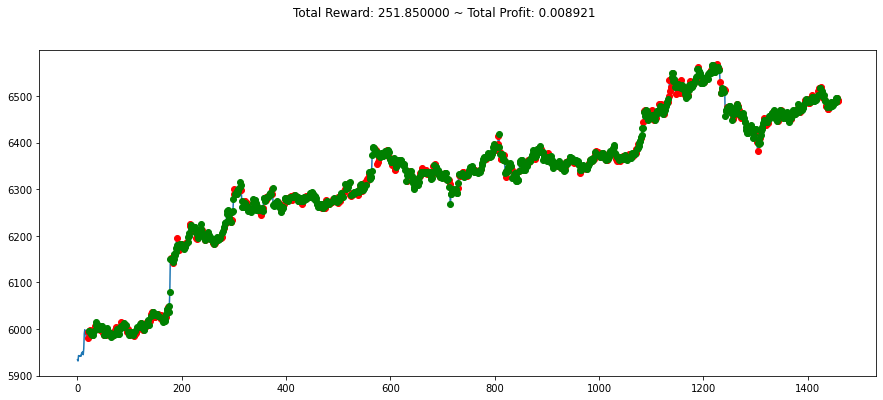

info {'total_reward': -88.42000000002736, 'total_profit': 0.007464827246497208, 'position': 0}


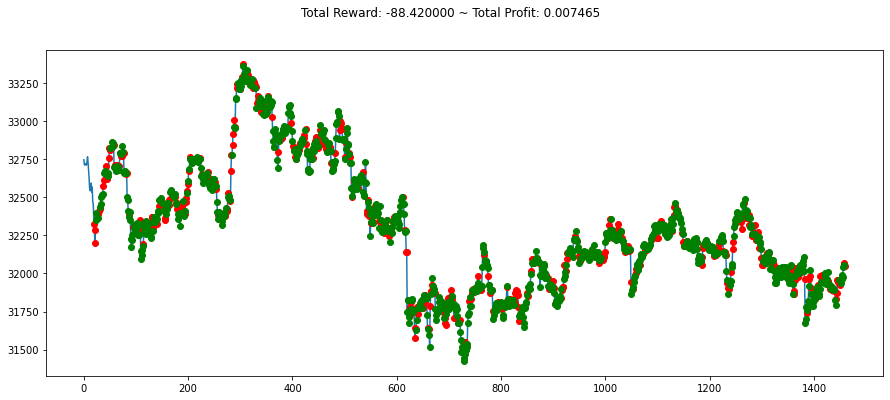

info {'total_reward': 364.63000000001375, 'total_profit': 0.0072803318162201385, 'position': 1}


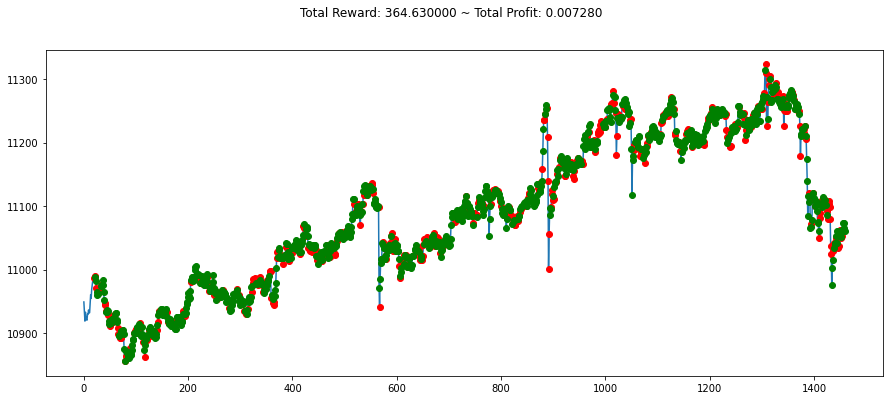

info {'total_reward': -591.4199999999837, 'total_profit': 0.009115914542600549, 'position': 0}


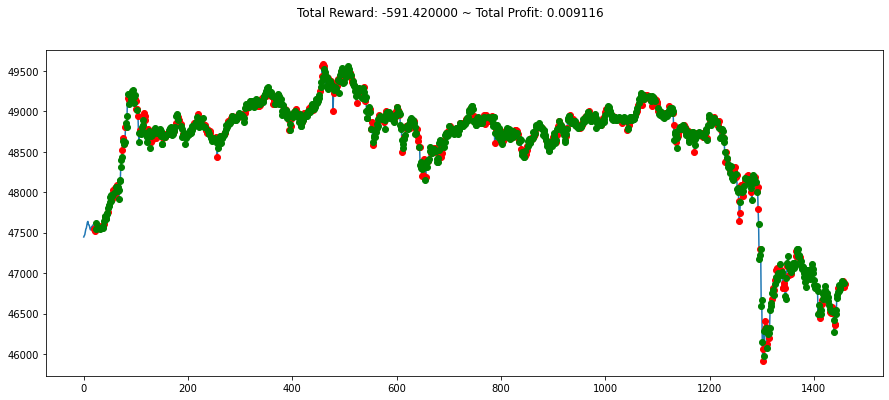

info {'total_reward': -131.04999999995925, 'total_profit': 0.006704142922988965, 'position': 1}


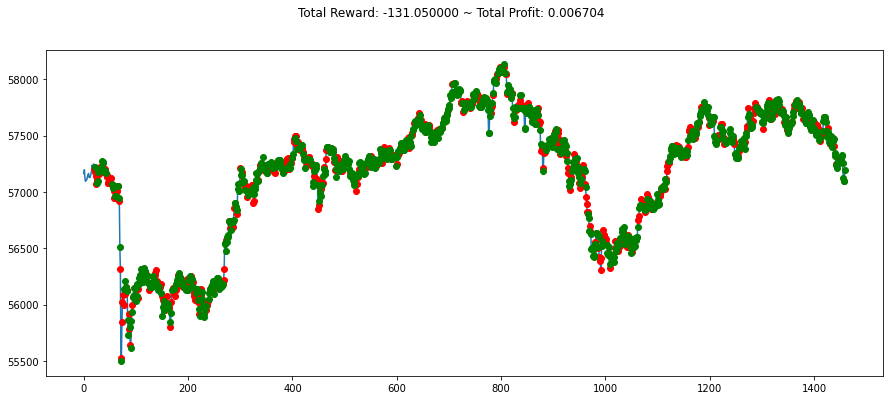

info {'total_reward': 2881.13000000007, 'total_profit': 0.0053309965112379575, 'position': 0}


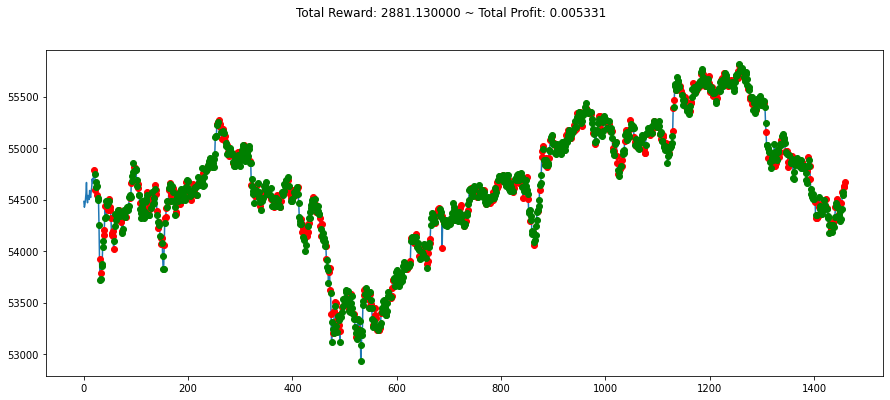

info {'total_reward': 2974.979999999996, 'total_profit': 0.006669786619284094, 'position': 1}


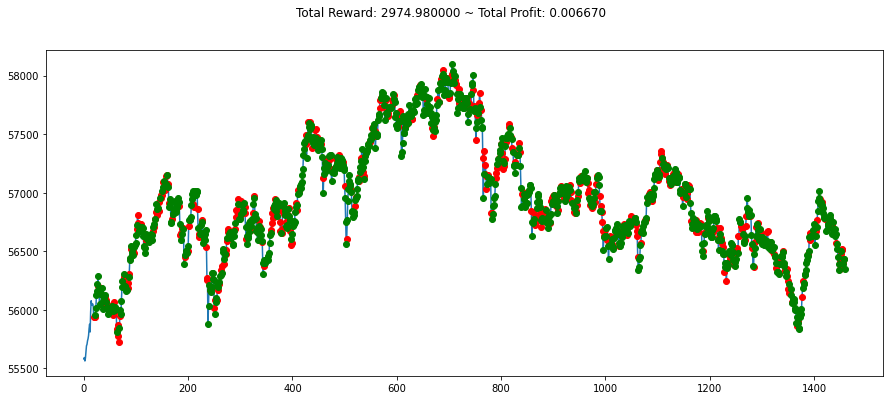

info {'total_reward': 106.77000000000226, 'total_profit': 0.006796875936626762, 'position': 1}


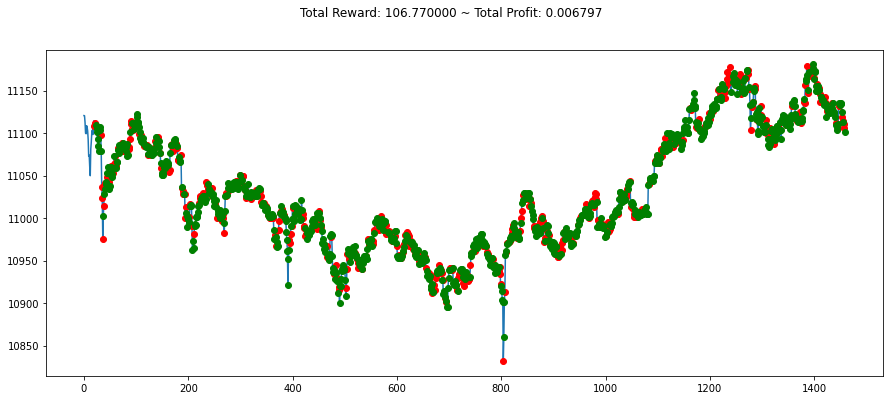

info {'total_reward': 93.58999999998741, 'total_profit': 0.006112268768488603, 'position': 1}


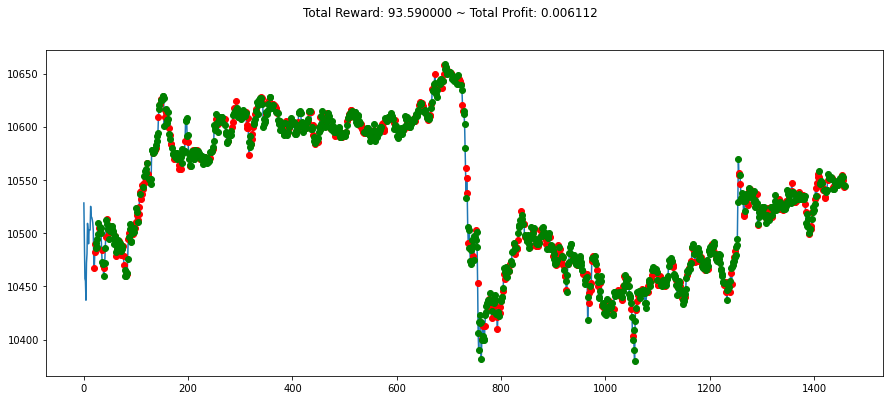

Price_Only_PPO Model 30-random-days Average Profit: 0.0068009569210286235 %


In [63]:
import os
#model_noprice.save("/Users/danies/Desktop/projects/RLBitcoin")
from statistics import mean

import random
score_model_priceonly_PPO=[]
for i in days_num:
    env_priceonly = MyCustomPriceOnly(df=stock, window_size=20, frame_bound=(i,i+1440))
    obs= env_priceonly.reset()
    while True:
        obs=obs[np.newaxis,...]
        action,_states=model_priceonly1.predict(obs)
        obs,rewards, done, info= env_priceonly.step(action)
        if done:
            print("info",info)
            score_model_priceonly_PPO.append(info['total_profit'])
            break
    plt.figure(figsize=(15,6))
    plt.cla()
    env_priceonly.render_all()
    plt.show()

print("Price_Only_PPO Model 30-random-days Average Profit: "+str(mean(score_model_priceonly_PPO))+" %")

## Price Only: A2C

In [66]:
def new_signals(env):
    start = env.frame_bound[0] - env.window_size
    end = env.frame_bound[1]
    prices = env.df.loc[:, 'Low'].to_numpy()[start:end]
    signal_features = env.df.loc[:, ['Low']].to_numpy()[start:end]
    return prices, signal_features
class MyCustomPriceOnly_A2C(StocksEnv):
    _process_data = new_signals
env_priceonly_A2C = MyCustomPriceOnly_A2C(df=stock, window_size=20, frame_bound=(20,int(len(df)*0.8)))
env_maker = lambda: env_priceonly_A2C
env = DummyVecEnv([env_maker])
model_priceonly_A2C = A2C("MlpPolicy", env , verbose=1, tensorboard_log="/Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_priceonly_A2C")
model_priceonly_A2C.learn(total_timesteps=10000)
#model_priceonly_A2C.save("/Users/danies/Desktop/projects/RLBitcoin/model/model_priceonly_A2C")
#model_priceonly_A2C=A2C.load("/Users/danies/Desktop/projects/RLBitcoin/model/model_priceonly_A2C.zip")


Using cpu device
Logging to /Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_priceonly_A2C/A2C_8
-------------------------------------
| time/                 |           |
|    fps                | 922       |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 500       |
| train/                |           |
|    entropy_loss       | -0.0754   |
|    explained_variance | -1.65     |
|    learning_rate      | 0.0007    |
|    n_updates          | 99        |
|    policy_loss        | -2.12e-05 |
|    value_loss         | 5.98e-06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 911       |
|    iterations         | 200       |
|    time_elapsed       | 1         |
|    total_timesteps    | 1000      |
| train/                |           |
|    entropy_loss       | -0.055    |
|    explained_variance | -1.16e+06 |
|    learning_rate 

-------------------------------------
| time/                 |           |
|    fps                | 835       |
|    iterations         | 1700      |
|    time_elapsed       | 10        |
|    total_timesteps    | 8500      |
| train/                |           |
|    entropy_loss       | -0.57     |
|    explained_variance | -0.000241 |
|    learning_rate      | 0.0007    |
|    n_updates          | 1699      |
|    policy_loss        | 0.0812    |
|    value_loss         | 0.0234    |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 833      |
|    iterations         | 1800     |
|    time_elapsed       | 10       |
|    total_timesteps    | 9000     |
| train/                |          |
|    entropy_loss       | -0.618   |
|    explained_variance | 0.000199 |
|    learning_rate      | 0.0007   |
|    n_updates          | 1799     |
|    policy_loss        | -0.0122  |
|    value_loss         

# Test  "Price Only_A2C" Model with Generated Number

info {'total_reward': 5.889999999997599, 'total_profit': 0.7982864113286757, 'position': 0}


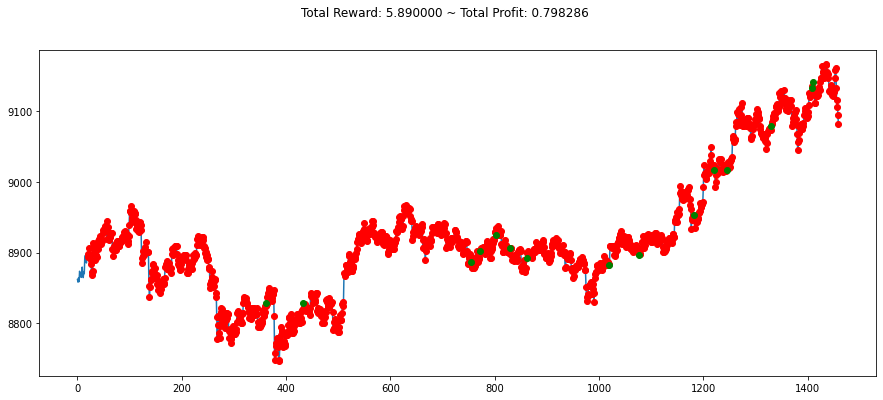

info {'total_reward': -3.959999999999127, 'total_profit': 0.8728257594845622, 'position': 0}


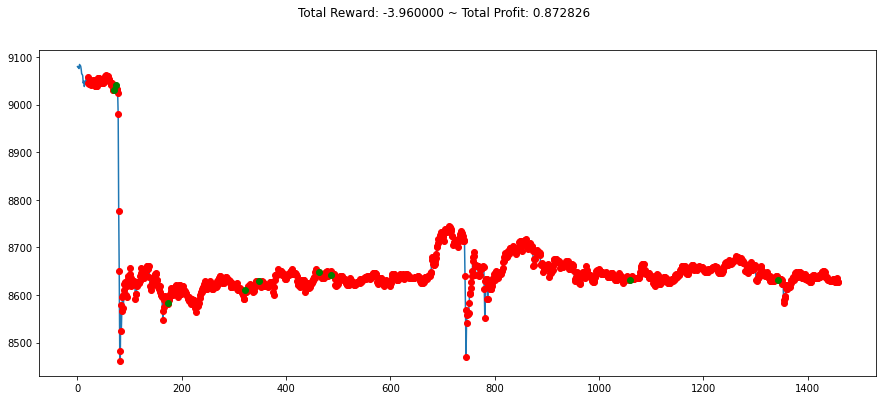

info {'total_reward': -10.080000000000837, 'total_profit': 0.8209644119775992, 'position': 0}


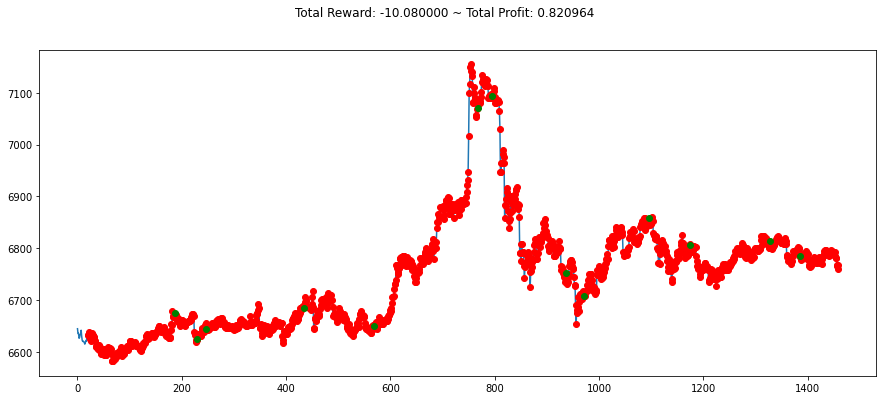

info {'total_reward': -70.79999999999927, 'total_profit': 0.8569601761312414, 'position': 0}


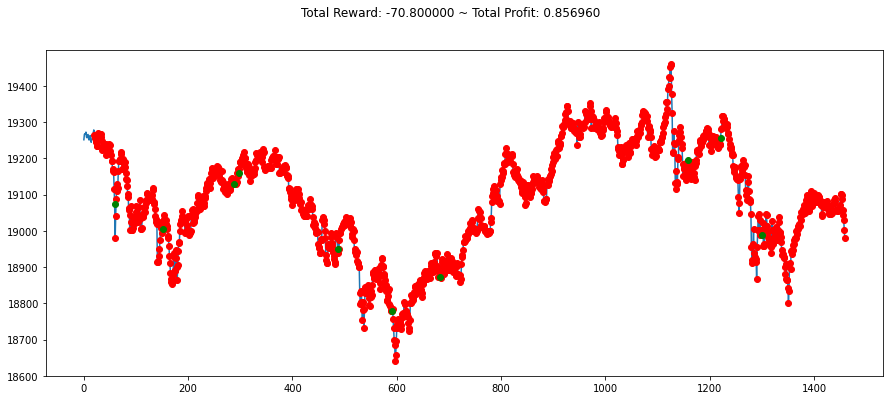

info {'total_reward': -33.88999999999942, 'total_profit': 0.8704408531467859, 'position': 0}


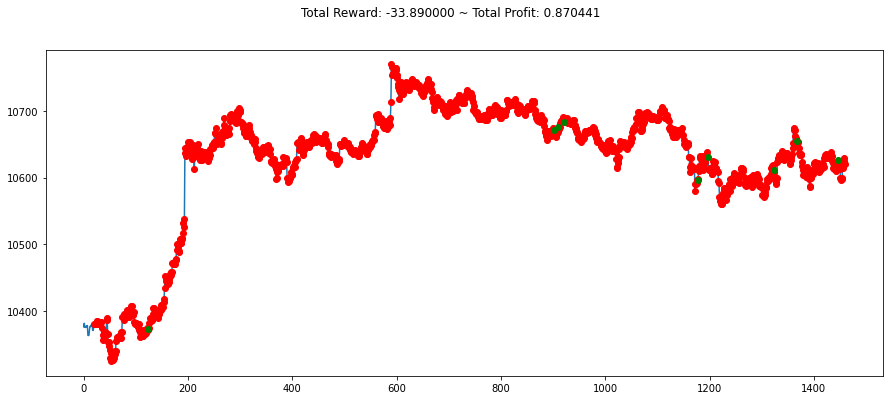

info {'total_reward': 2.7399999999997817, 'total_profit': 0.9137954808964461, 'position': 0}


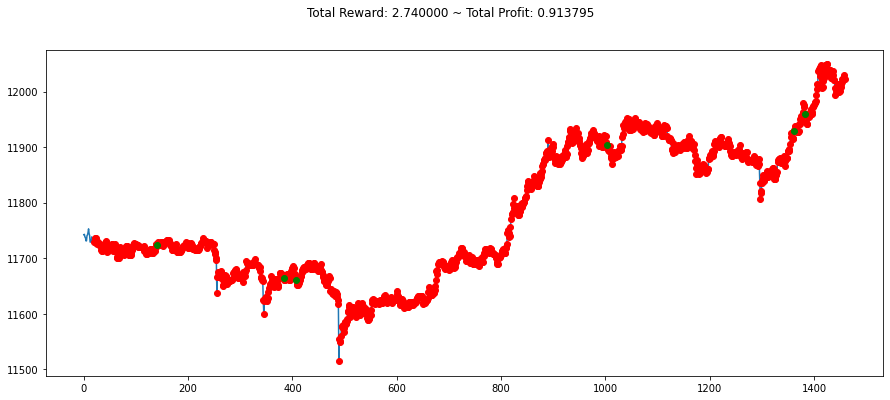

info {'total_reward': 4.540000000000873, 'total_profit': 0.7744717434168443, 'position': 0}


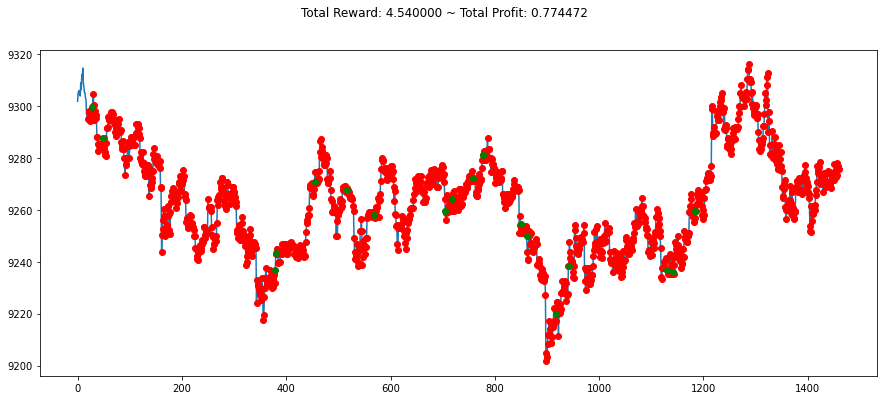

info {'total_reward': 276.0000000000218, 'total_profit': 0.8024250357308229, 'position': 0}


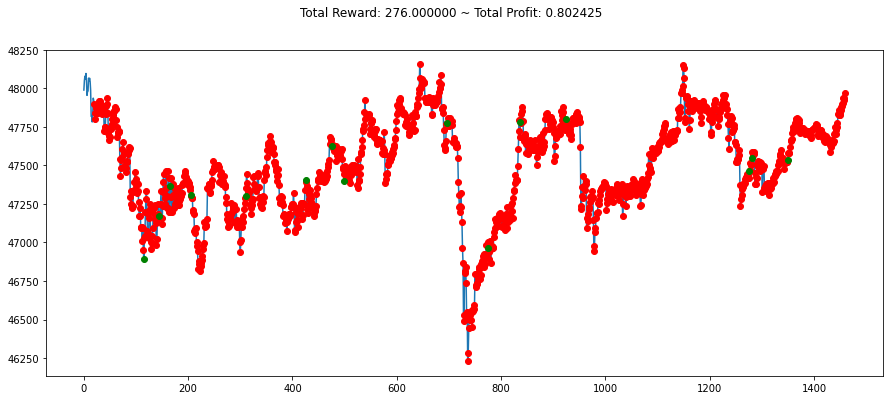

info {'total_reward': 28.44999999999709, 'total_profit': 0.8739575178661606, 'position': 0}


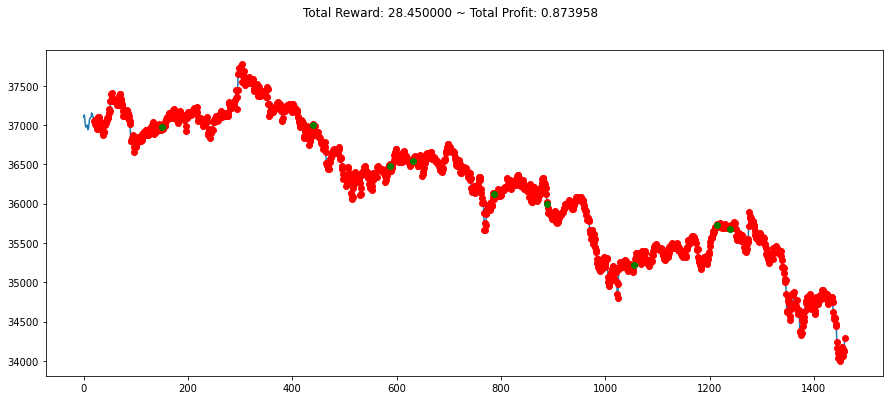

info {'total_reward': 11.12999999999738, 'total_profit': 0.835601999243792, 'position': 0}


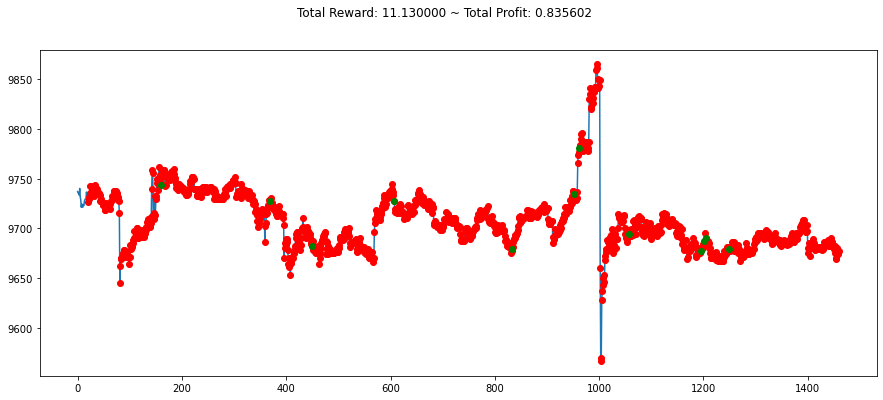

info {'total_reward': -1.0800000000008367, 'total_profit': 0.8863132086226005, 'position': 0}


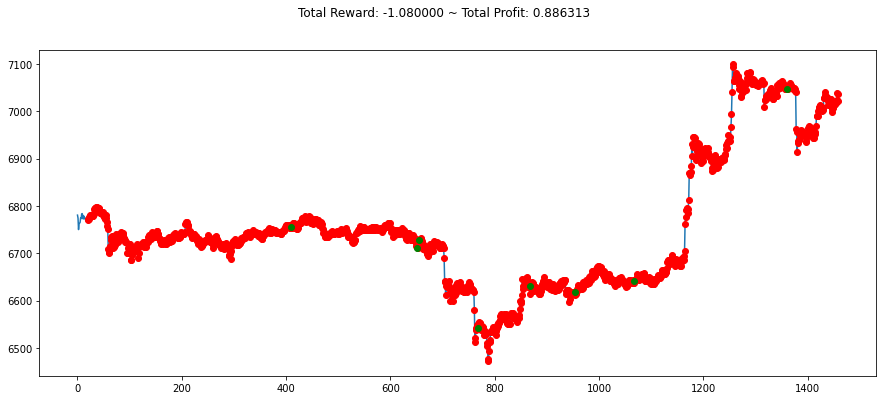

info {'total_reward': -39.440000000005966, 'total_profit': 0.8333179620504634, 'position': 0}


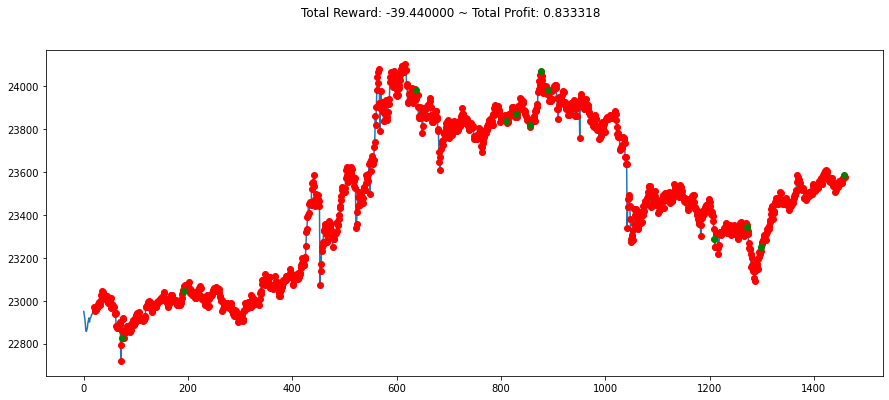

info {'total_reward': 4.270000000000437, 'total_profit': 0.8225045642956519, 'position': 0}


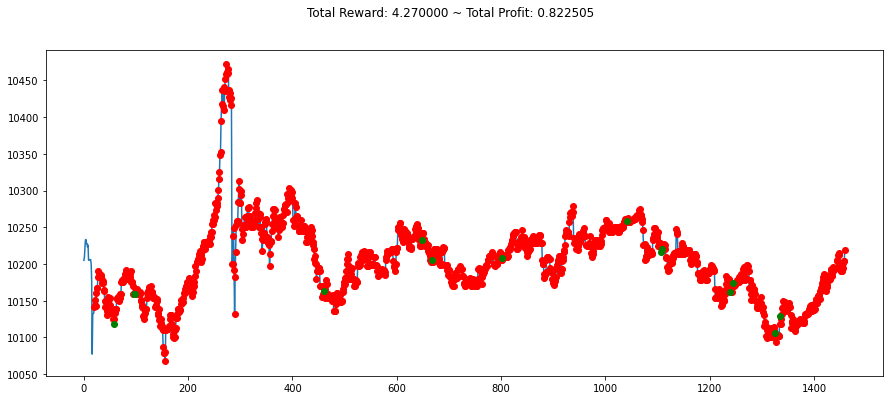

info {'total_reward': -36.57999999999902, 'total_profit': 0.8813913881944014, 'position': 0}


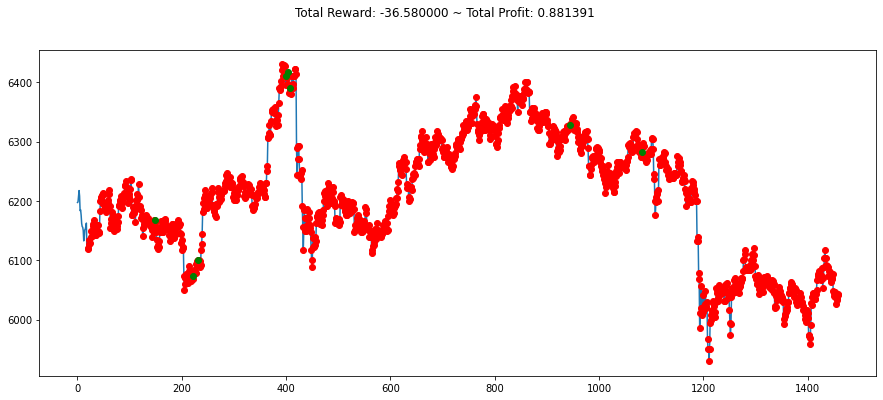

info {'total_reward': -55.40999999999622, 'total_profit': 0.7692380987517629, 'position': 0}


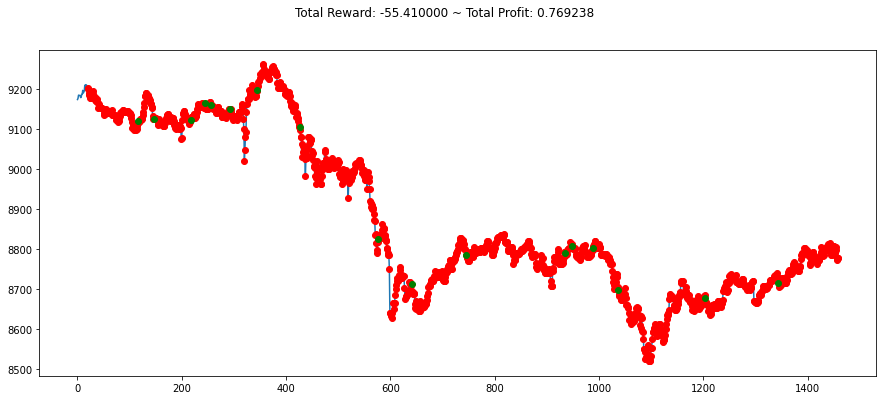

info {'total_reward': 3.2600000000002183, 'total_profit': 0.9419784214395077, 'position': 0}


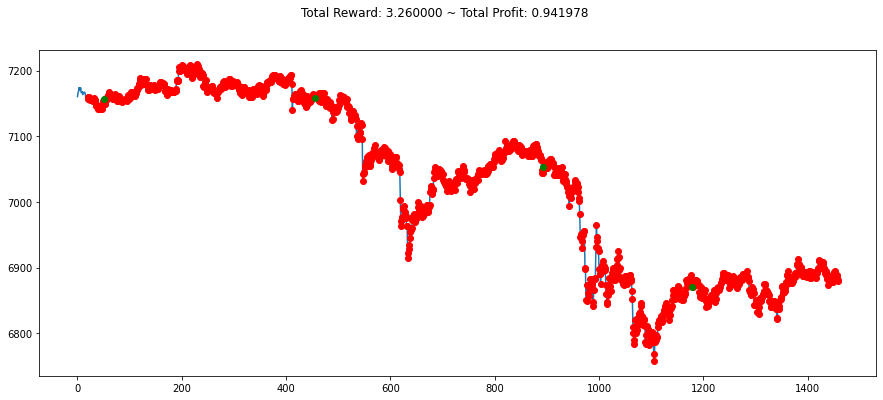

info {'total_reward': 70.27999999999975, 'total_profit': 0.8591991618651289, 'position': 0}


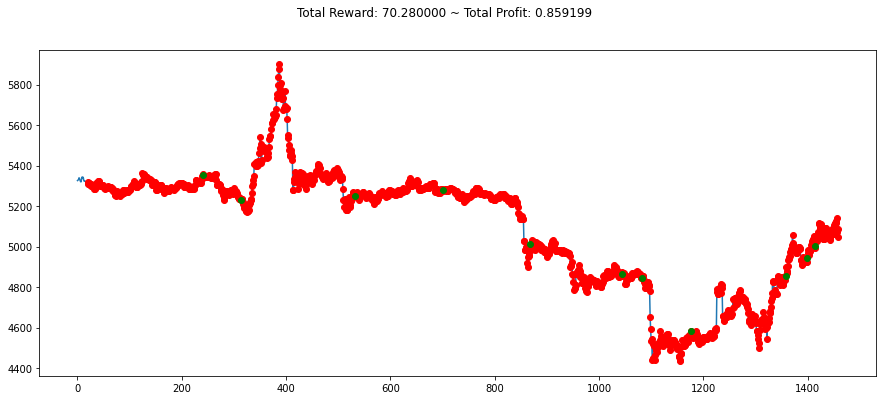

info {'total_reward': 7.569999999999709, 'total_profit': 0.9004209856356441, 'position': 0}


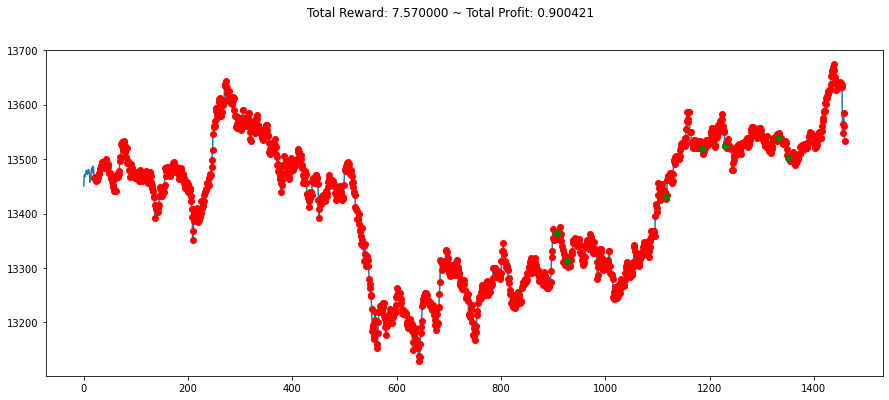

info {'total_reward': 86.89999999999418, 'total_profit': 0.888009682880422, 'position': 0}


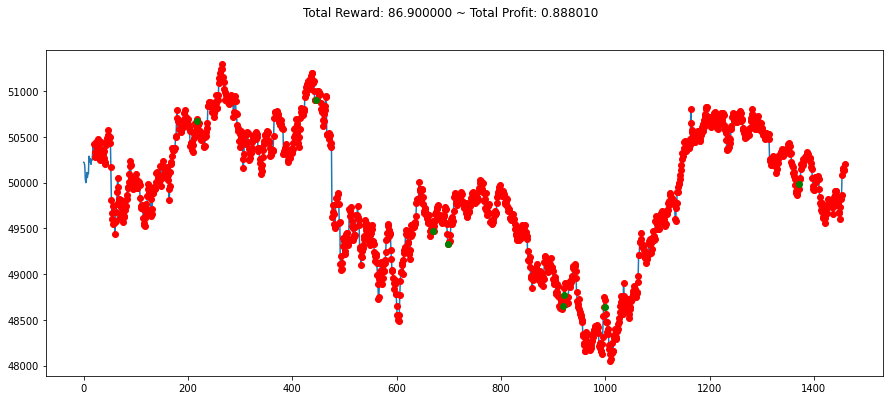

info {'total_reward': 2.8400000000037835, 'total_profit': 0.7979798597312663, 'position': 0}


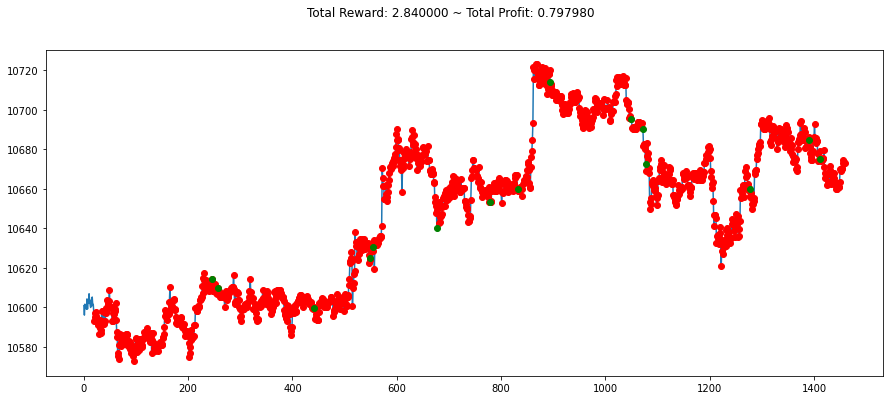

info {'total_reward': -6.88999999999578, 'total_profit': 0.8340267397340334, 'position': 0}


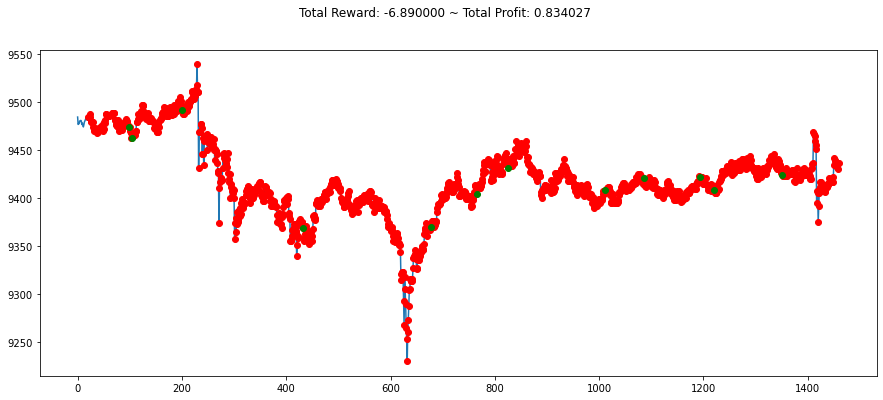

info {'total_reward': 1.1700000000009823, 'total_profit': 0.9137965183659478, 'position': 0}


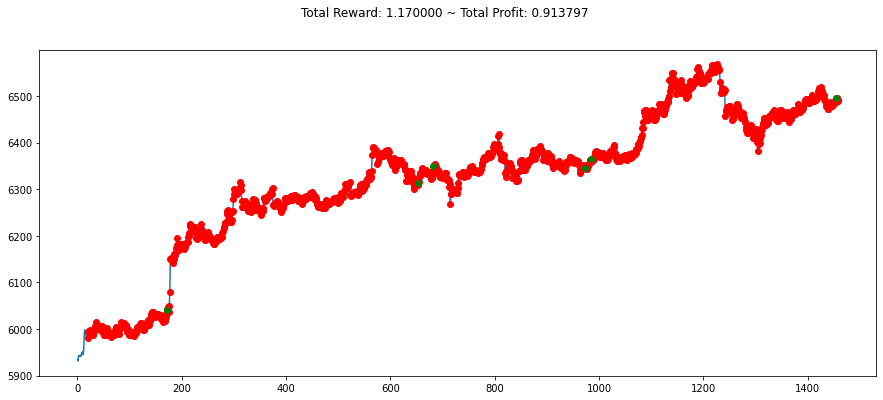

info {'total_reward': 102.12000000000626, 'total_profit': 0.8247598948295605, 'position': 0}


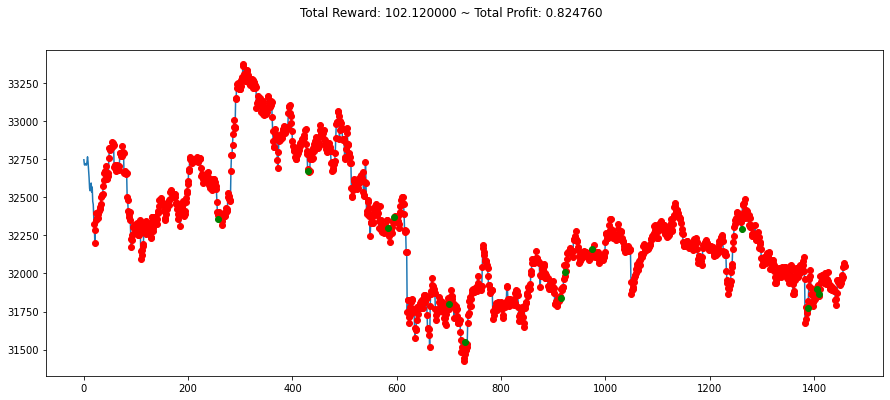

info {'total_reward': 31.910000000001673, 'total_profit': 0.8370466034894842, 'position': 0}


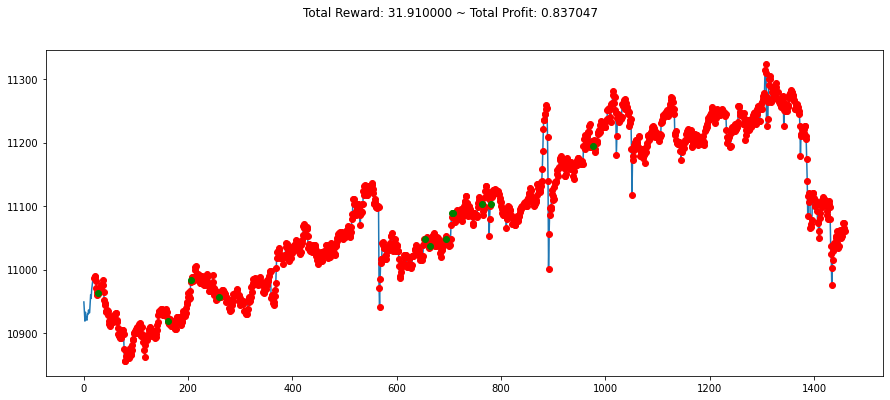

info {'total_reward': 78.97000000000844, 'total_profit': 0.8747011783180393, 'position': 0}


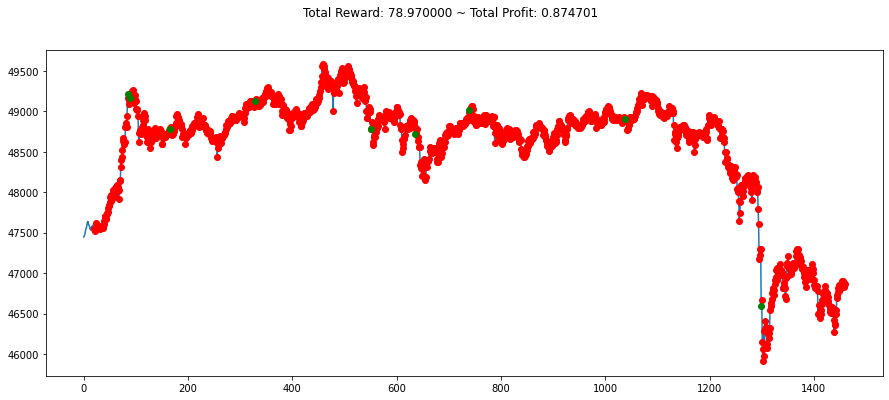

info {'total_reward': 278.59000000001106, 'total_profit': 0.8514532523353029, 'position': 0}


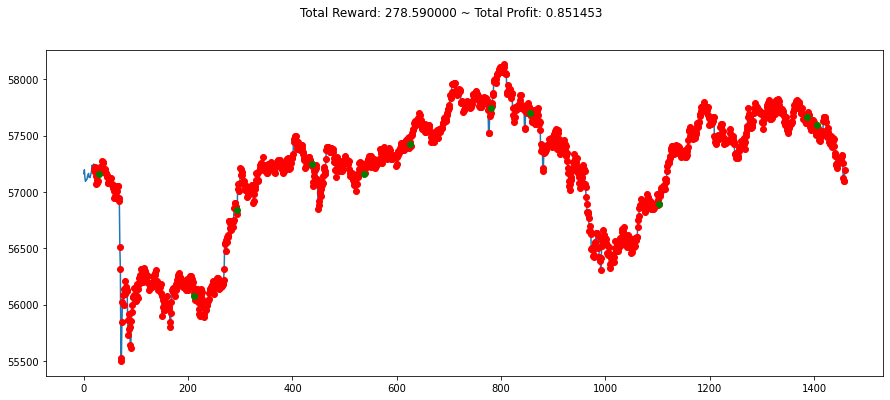

info {'total_reward': -14.94999999999709, 'total_profit': 0.8730137033146796, 'position': 0}


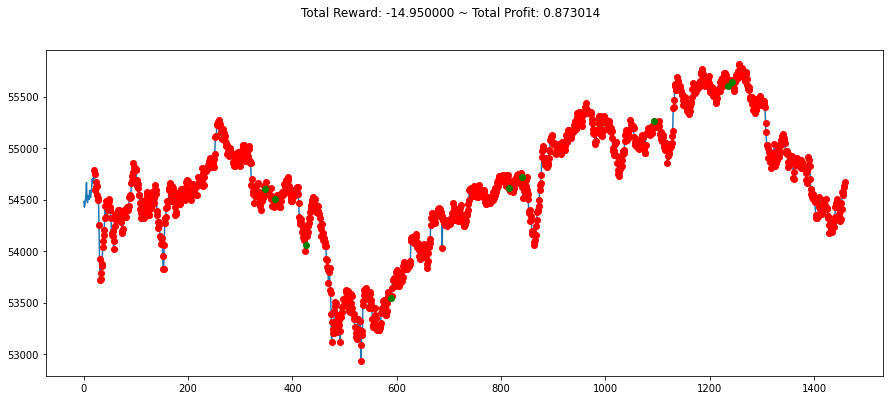

info {'total_reward': -189.7399999999834, 'total_profit': 0.8194620094327529, 'position': 0}


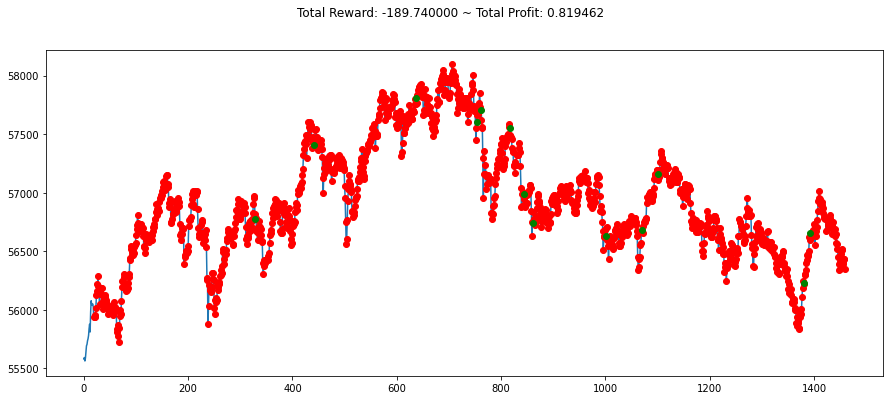

info {'total_reward': 14.959999999997308, 'total_profit': 0.887681486027651, 'position': 0}


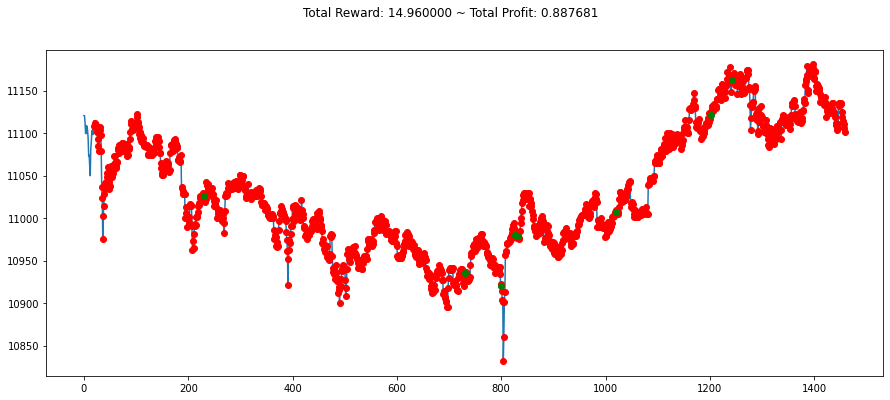

info {'total_reward': -23.789999999997235, 'total_profit': 0.8582150446982322, 'position': 0}


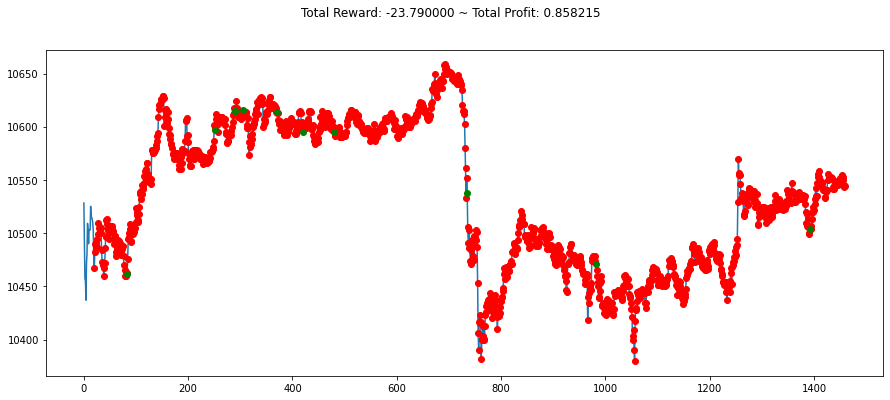

Priceonly_A2C Model 30-random-days Average Profit: 0.8524746384411821 %


In [67]:
import os

from statistics import mean
import random
score_model_priceonly_A2C=[]
for i in days_num:
    env_priceonly_A2C = CustomEnv(df=stock, window_size=20, frame_bound=(i,i+1440))
    obs=env_priceonly_A2C.reset()
    while True:
        obs=obs[np.newaxis,...]
        action,_states=model_priceonly_A2C.predict(obs)
        obs,rewards, done, info=env_priceonly_A2C.step(action)
        if done:
            print("info",info)
            score_model_priceonly_A2C.append(info['total_profit'])
            break
    plt.figure(figsize=(15,6))
    plt.cla()
    env_priceonly_A2C.render_all()
    plt.show()

print("Priceonly_A2C Model 30-random-days Average Profit: "+str(mean(score_model_priceonly_A2C))+" %")

##  Volume,Volume_(currency), Rsi, Macd: PPO

In [68]:
def new_signals(env):
    start = env.frame_bound[0] - env.window_size
    end = env.frame_bound[1]
    prices = env.df.loc[:, 'Low'].to_numpy()[start:end]
    signal_features = env.df.loc[:, ['Volume','Volume_(currency)', 'Rsi','Macd']].to_numpy()[start:end]
    return prices, signal_features
class CustomEnv(StocksEnv):
    _process_data = new_signals
    
env_noprice_PPO = CustomEnv(df=stock, window_size=20, frame_bound=(20,int(len(df)*0.8)))
env_maker = lambda: env_noprice_PPO
env = DummyVecEnv([env_maker])
model_noprice_PPO = PPO("MlpPolicy", env , verbose=1, tensorboard_log="/Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_noprice_PPO")
model_noprice_PPO.learn(total_timesteps=10000)
#model_noprice.save("/Users/danies/Desktop/projects/RLBitcoin/model_noprice_PPO")
#model_noprice_PPO = PPO.load("/Users/danies/Desktop/projects/RLBitcoin/model/model_noprice_PPO.zip")

Using cpu device
Logging to /Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_noprice_PPO/PPO_5
-----------------------------
| time/              |      |
|    fps             | 1868 |
|    iterations      | 1    |
|    time_elapsed    | 1    |
|    total_timesteps | 2048 |
-----------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 1128       |
|    iterations           | 2          |
|    time_elapsed         | 3          |
|    total_timesteps      | 4096       |
| train/                  |            |
|    approx_kl            | 0.00602971 |
|    clip_fraction        | 0.0674     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.686     |
|    explained_variance   | -7.12      |
|    learning_rate        | 0.0003     |
|    loss                 | -0.0265    |
|    n_updates            | 10         |
|    policy_gradient_loss | -0.0154    |
|    value_loss           | 0

info {'total_reward': 328.57999999998174, 'total_profit': 0.005090035262993841, 'position': 0}


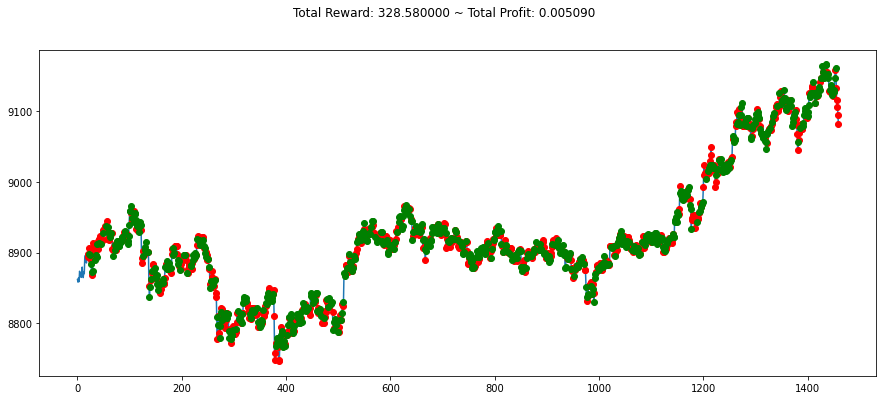

info {'total_reward': -411.4499999999971, 'total_profit': 0.004752442198211884, 'position': 1}


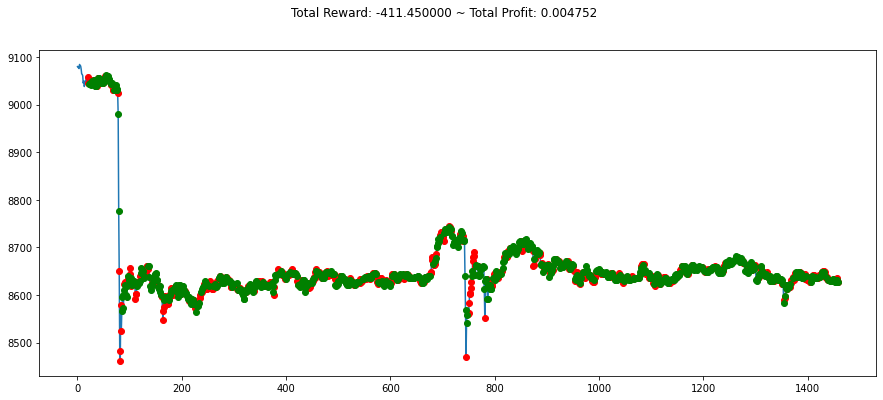

info {'total_reward': 264.3699999999935, 'total_profit': 0.004869802854723868, 'position': 1}


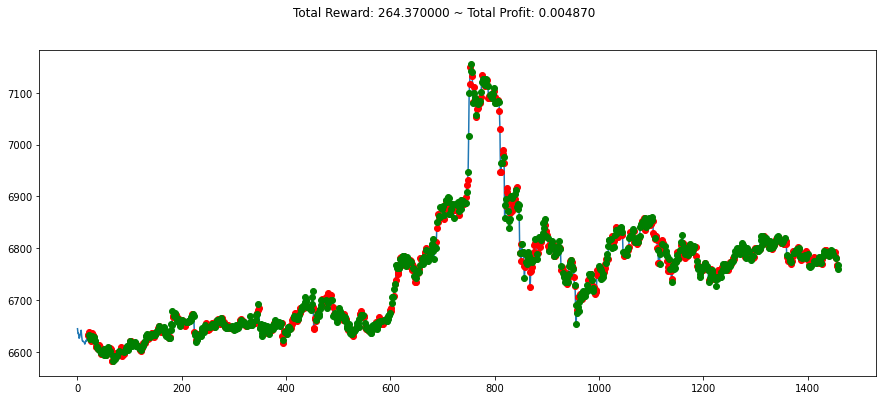

info {'total_reward': 75.47999999999593, 'total_profit': 0.004433097687688678, 'position': 0}


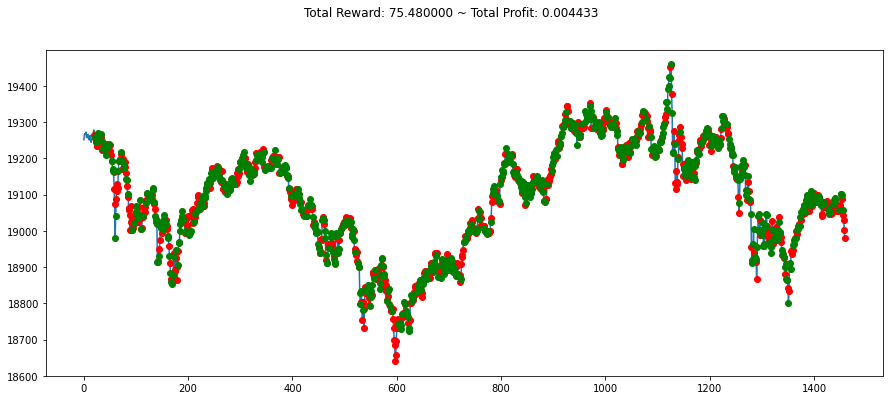

info {'total_reward': -7.390000000001237, 'total_profit': 0.004346694544810005, 'position': 0}


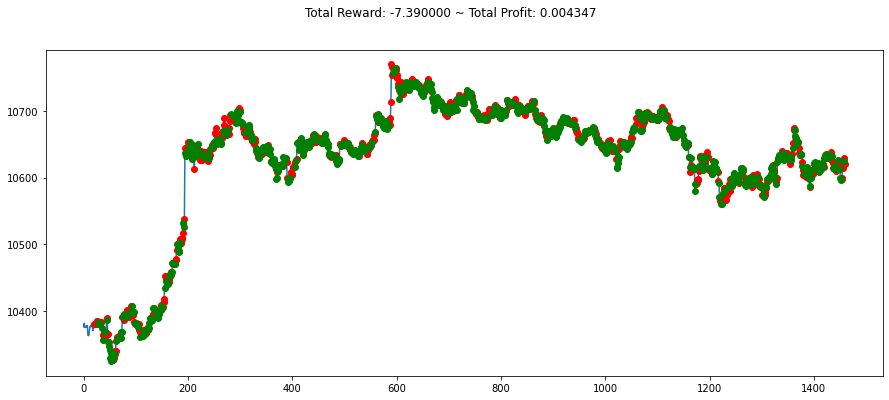

info {'total_reward': 103.04000000000087, 'total_profit': 0.005417496079372779, 'position': 0}


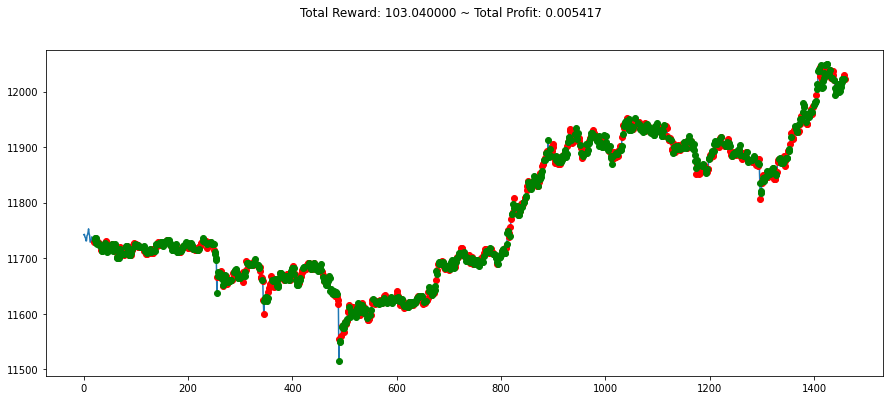

info {'total_reward': -4.180000000007567, 'total_profit': 0.003912502341774231, 'position': 0}


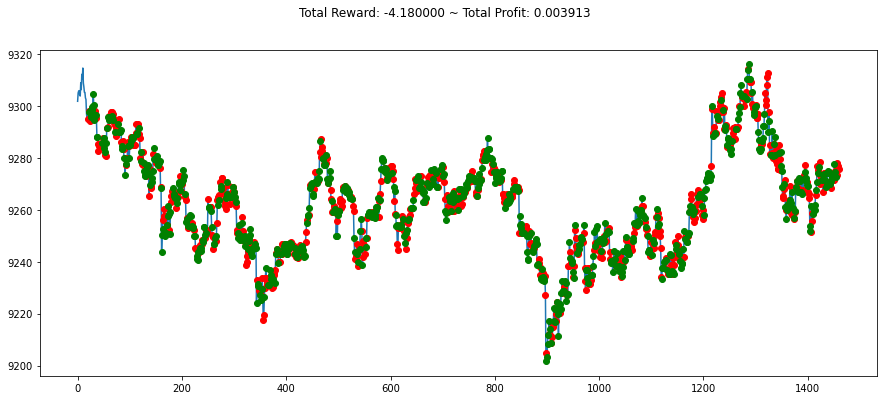

info {'total_reward': -122.63999999998487, 'total_profit': 0.003904648485557158, 'position': 0}


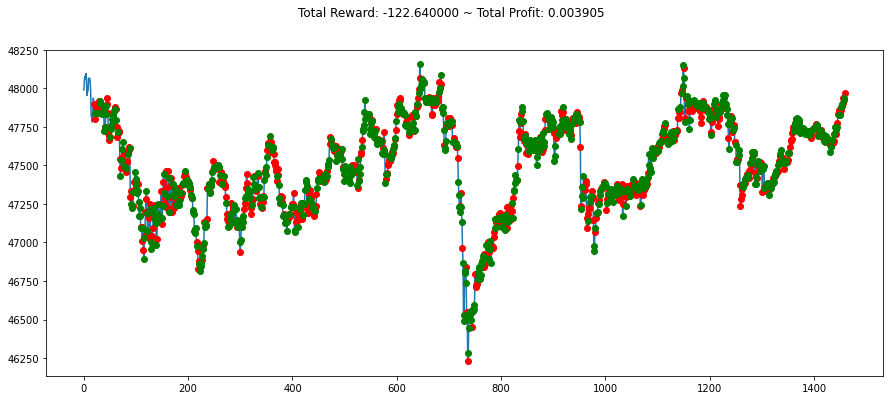

info {'total_reward': -1680.2099999999773, 'total_profit': 0.004025683119421464, 'position': 1}


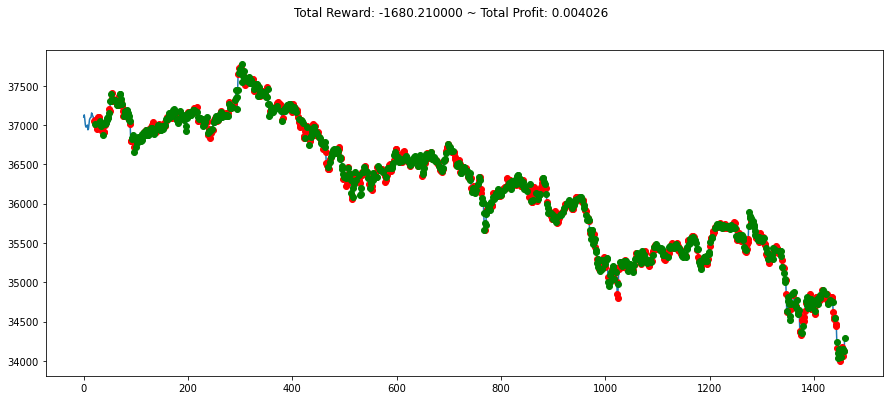

info {'total_reward': -36.07000000000153, 'total_profit': 0.004814992512523593, 'position': 0}


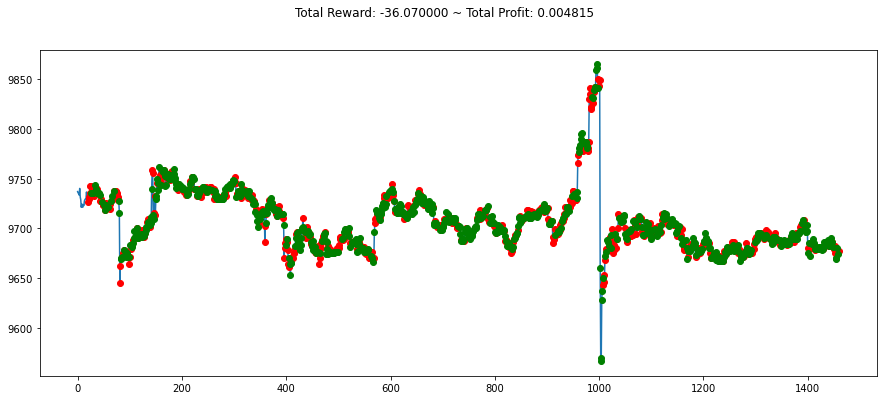

info {'total_reward': 113.22999999999683, 'total_profit': 0.004041924414019059, 'position': 0}


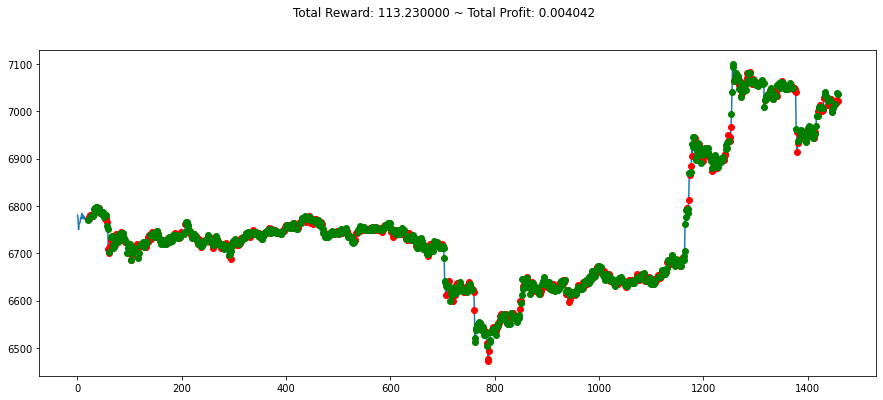

info {'total_reward': 1103.8600000000479, 'total_profit': 0.0044904591081299265, 'position': 0}


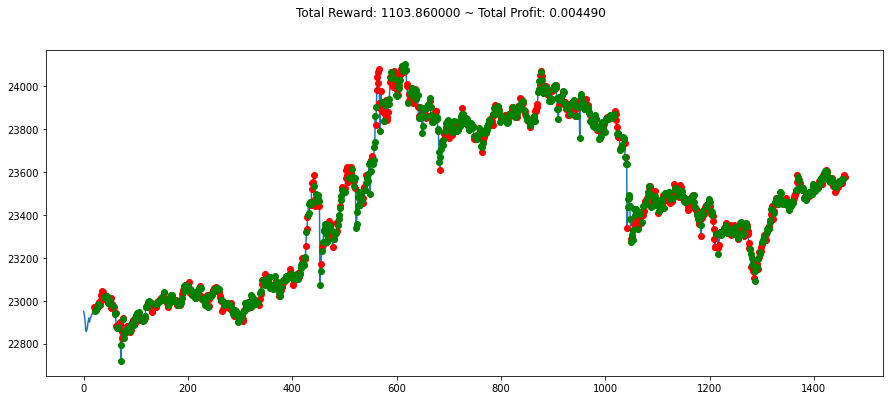

info {'total_reward': 287.21000000001186, 'total_profit': 0.004472884795509126, 'position': 0}


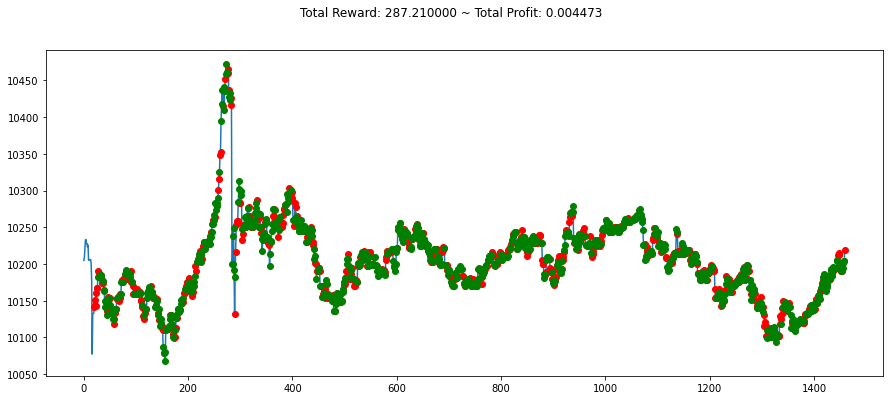

info {'total_reward': 101.34000000000015, 'total_profit': 0.004557849031827325, 'position': 0}


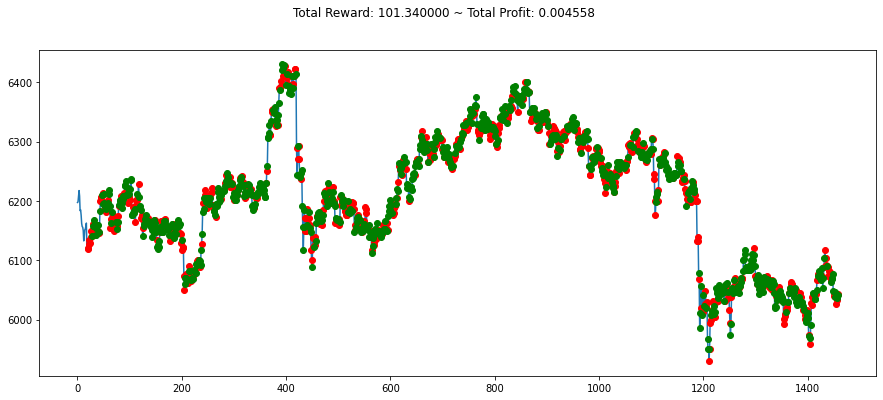

info {'total_reward': -351.30000000000655, 'total_profit': 0.00500895744314421, 'position': 1}


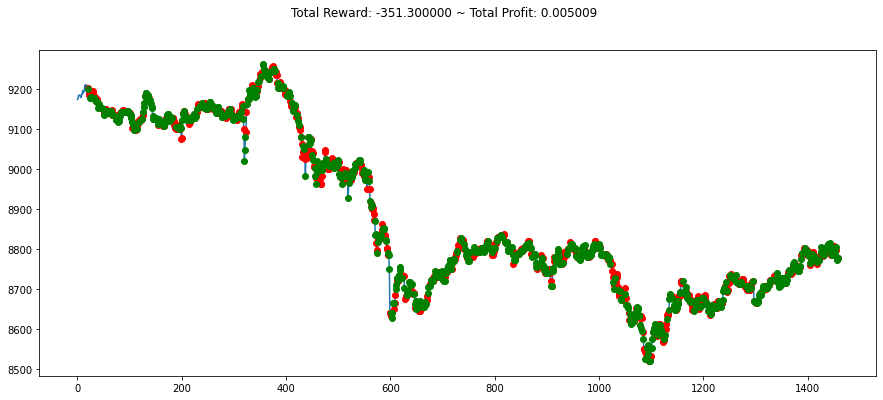

info {'total_reward': -172.40999999999622, 'total_profit': 0.004307684794286147, 'position': 0}


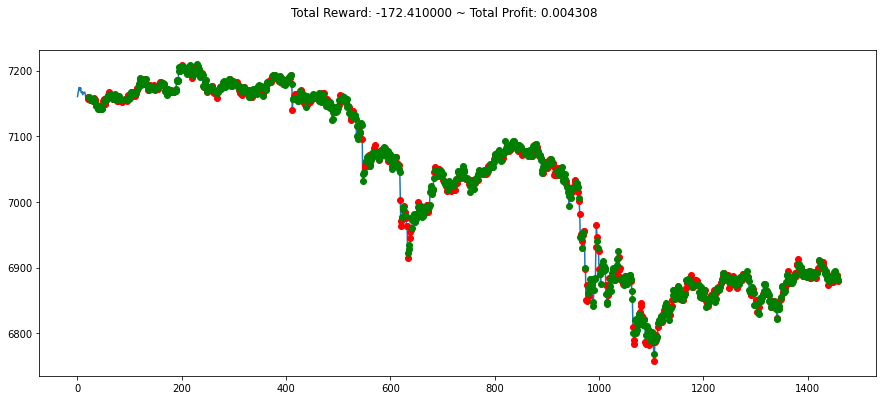

info {'total_reward': -63.960000000003674, 'total_profit': 0.003802818836868484, 'position': 1}


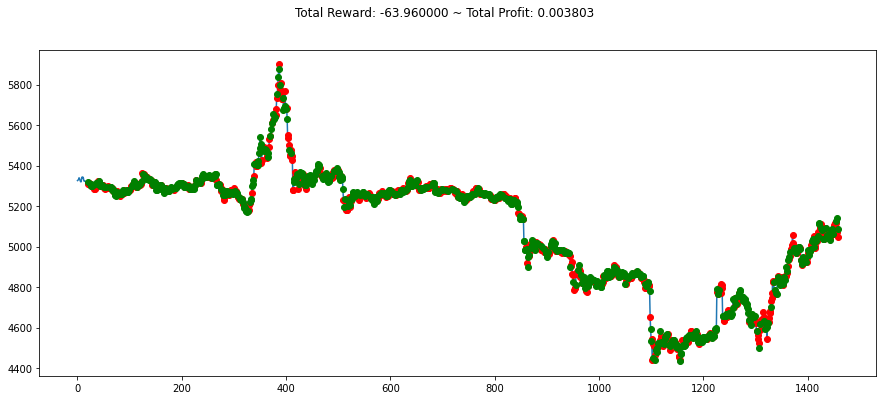

info {'total_reward': 61.89999999999418, 'total_profit': 0.00457181391284272, 'position': 0}


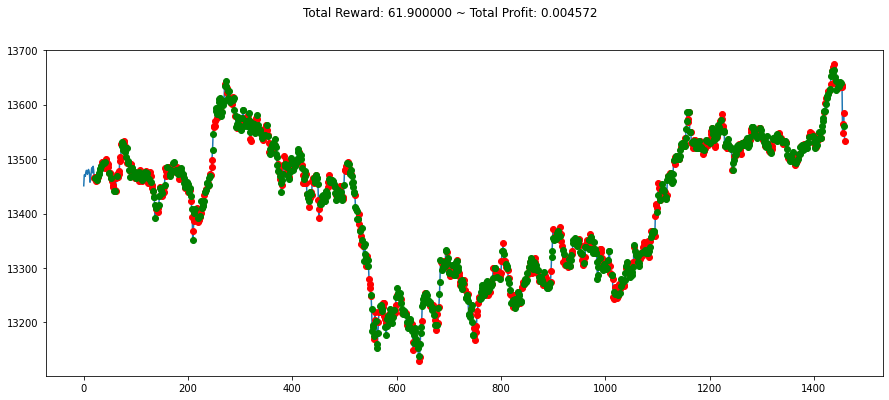

info {'total_reward': 643.4099999999089, 'total_profit': 0.004148230573507993, 'position': 1}


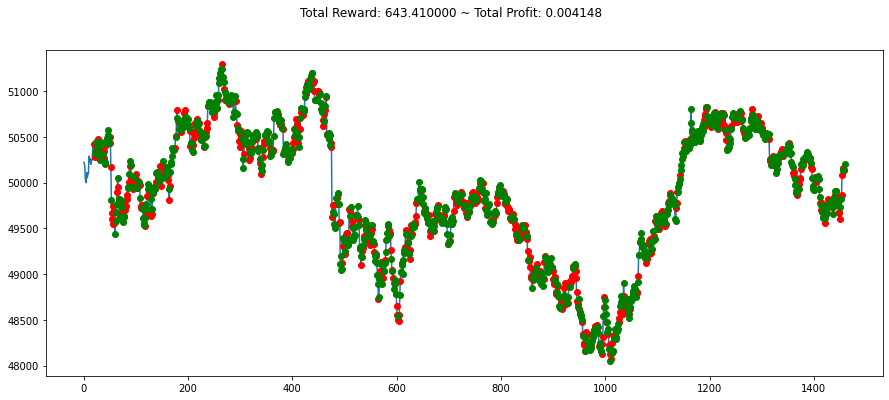

info {'total_reward': 6.879999999995562, 'total_profit': 0.004418212741870508, 'position': 0}


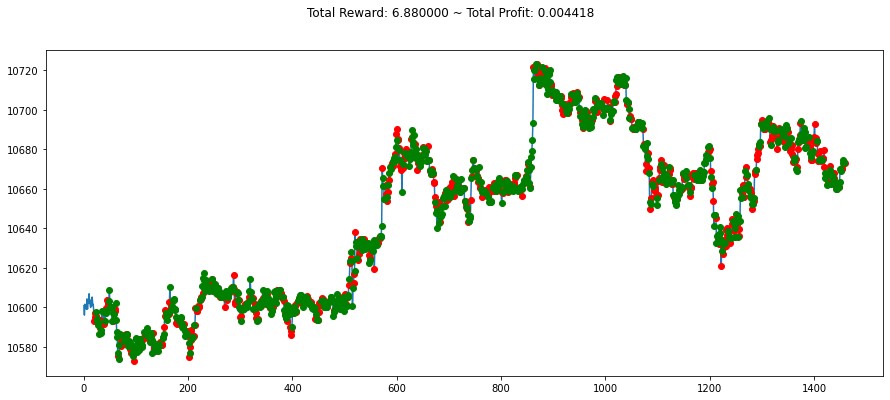

info {'total_reward': -7.449999999998909, 'total_profit': 0.004217365693125401, 'position': 0}


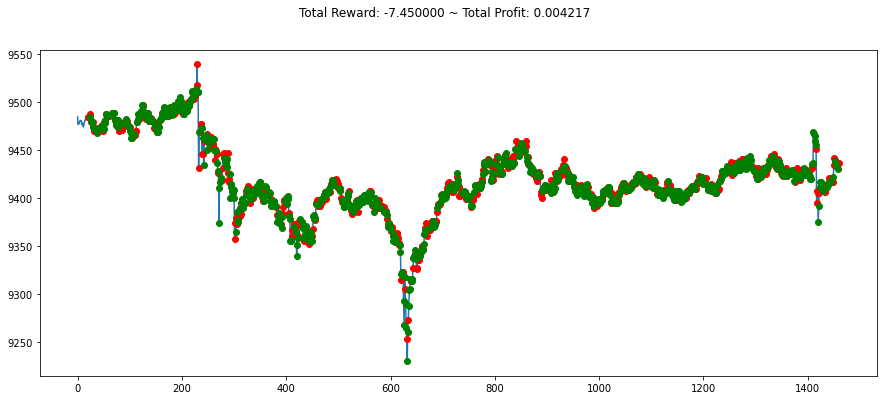

info {'total_reward': 220.2100000000073, 'total_profit': 0.0043038501764880105, 'position': 0}


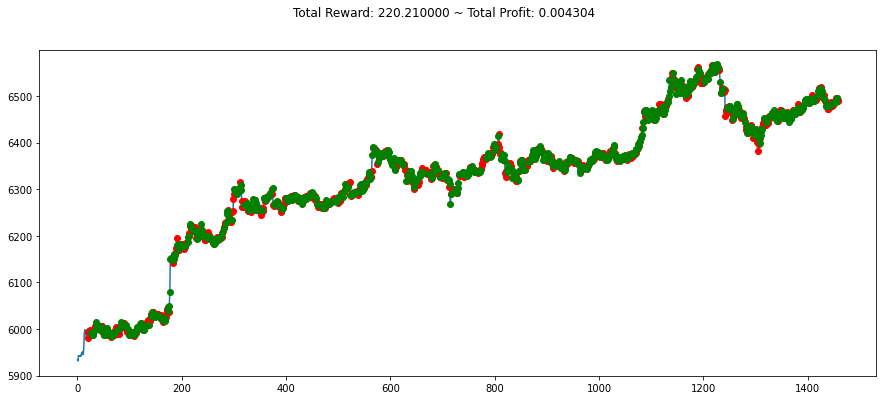

info {'total_reward': 836.3100000000013, 'total_profit': 0.0038382920413446895, 'position': 0}


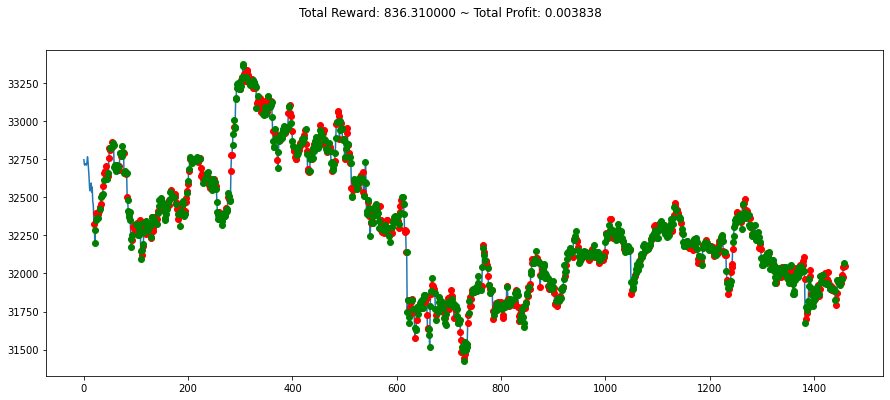

info {'total_reward': 199.54999999999382, 'total_profit': 0.004361802353753178, 'position': 1}


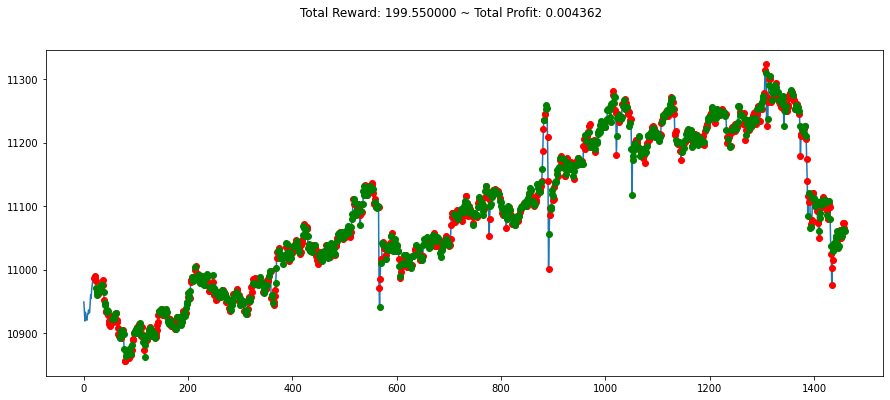

info {'total_reward': -2548.8699999999517, 'total_profit': 0.0033406437700903018, 'position': 0}


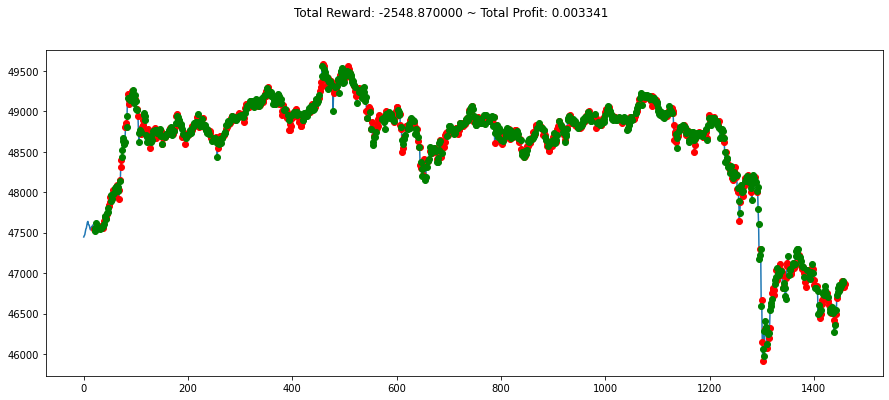

info {'total_reward': 335.7100000000137, 'total_profit': 0.004789139707555771, 'position': 0}


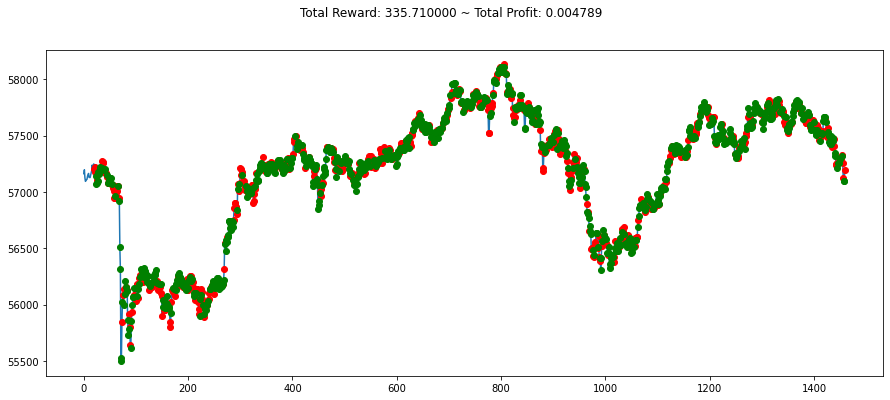

info {'total_reward': -431.02999999993335, 'total_profit': 0.003389638656935795, 'position': 0}


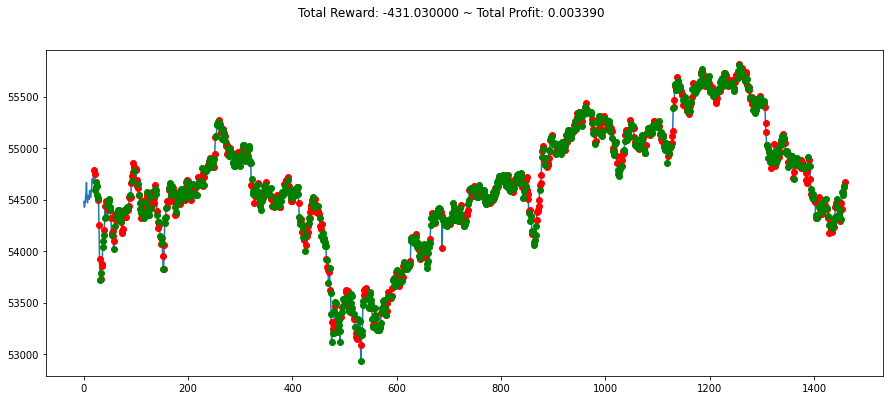

info {'total_reward': -239.120000000039, 'total_profit': 0.0049620269904935, 'position': 0}


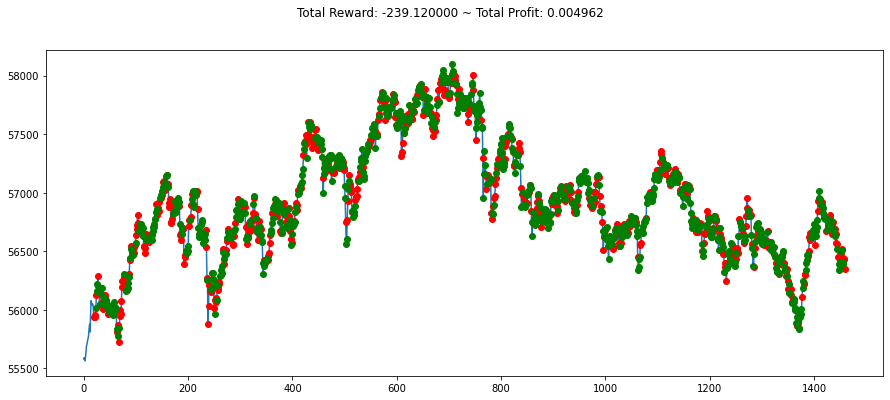

info {'total_reward': 82.03999999999905, 'total_profit': 0.004865614576097948, 'position': 1}


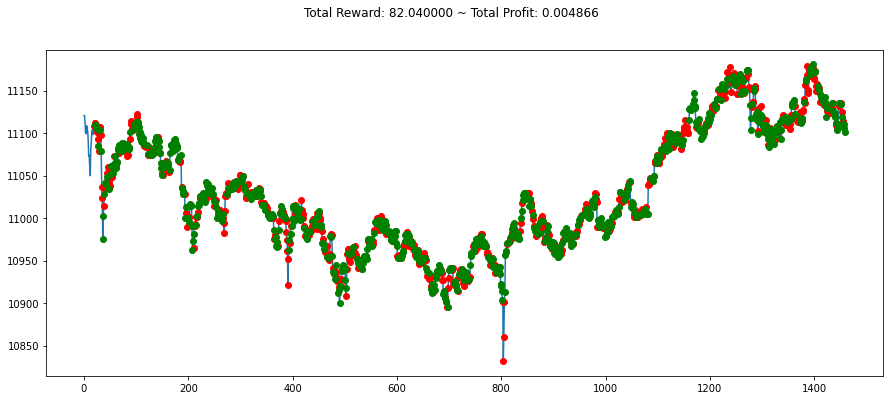

info {'total_reward': 77.88999999997577, 'total_profit': 0.005018107602269719, 'position': 0}


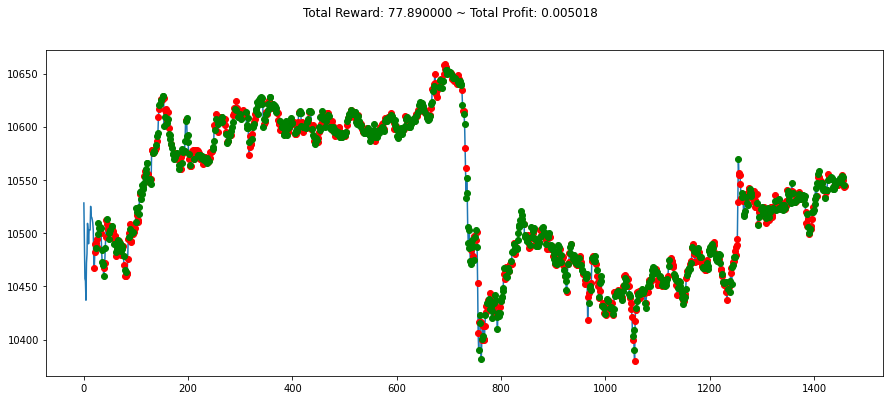

Volume,Volume_(currency), Rsi, Macd: PPO Model 30-random-days Average Profit: 0.004415823743574577 %


In [69]:
import os
import random
score_model_noprice_PPO=[]
for i in days_num:
    env_noprice_PPO = CustomEnv(df=stock, window_size=20, frame_bound=(i,i+1440))
    obs=env_noprice_PPO.reset()
    while True:
        obs=obs[np.newaxis,...]
        action,_states=model_noprice_PPO.predict(obs)
        obs,rewards, done, info=env_noprice_PPO.step(action)
        if done:
            print("info",info)
            score_model_noprice_PPO.append(info['total_profit'])
            break
    plt.figure(figsize=(15,6))
    plt.cla()
    env_noprice_PPO.render_all()
    plt.show()

print("Volume,Volume_(currency), Rsi, Macd: PPO Model 30-random-days Average Profit: "+str(mean(score_model_noprice_PPO))+" %")

## Volume,Volume_(currency), Rsi, Macd: A2C

In [70]:
def new_signals(env):
    start = env.frame_bound[0] - env.window_size
    end = env.frame_bound[1]
    prices = env.df.loc[:, 'Low'].to_numpy()[start:end]
    signal_features = env.df.loc[:, ['Volume','Volume_(currency)', 'Rsi','Macd']].to_numpy()[start:end]
    return prices, signal_features
class CustomEnv_A2C(StocksEnv):
    _process_data = new_signals
import random
from stable_baselines3 import PPO
env_noprice_A2C =  CustomEnv_A2C(df=stock, window_size=20, frame_bound=(20,int(len(df)*0.8)))
env_maker = lambda: env_noprice_A2C
env = DummyVecEnv([env_maker])
model_noprice_A2C = A2C("MlpPolicy", env , verbose=1, tensorboard_log="/Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_noprice_A2C")
model_noprice_A2C.learn(total_timesteps=10000)
#model_noprice_A2C.save("/Users/danies/Desktop/projects/RLBitcoin/model_noprice_A2C")
#model_noprice_A2C = A2C.load("/Users/danies/Desktop/projects/RLBitcoin/model/model_noprice_A2Ccopy.zip")

Using cpu device
Logging to /Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_noprice_A2C/A2C_7
------------------------------------
| time/                 |          |
|    fps                | 923      |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -0.684   |
|    explained_variance | -41.4    |
|    learning_rate      | 0.0007   |
|    n_updates          | 99       |
|    policy_loss        | -0.316   |
|    value_loss         | 0.34     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 932       |
|    iterations         | 200       |
|    time_elapsed       | 1         |
|    total_timesteps    | 1000      |
| train/                |           |
|    entropy_loss       | -0.665    |
|    explained_variance | -6.45e+03 |
|    learning_rate      | 0.0007   

------------------------------------
| time/                 |          |
|    fps                | 937      |
|    iterations         | 1700     |
|    time_elapsed       | 9        |
|    total_timesteps    | 8500     |
| train/                |          |
|    entropy_loss       | -0.592   |
|    explained_variance | -0.297   |
|    learning_rate      | 0.0007   |
|    n_updates          | 1699     |
|    policy_loss        | -0.0306  |
|    value_loss         | 0.0102   |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 934      |
|    iterations         | 1800     |
|    time_elapsed       | 9        |
|    total_timesteps    | 9000     |
| train/                |          |
|    entropy_loss       | -0.588   |
|    explained_variance | -9.6     |
|    learning_rate      | 0.0007   |
|    n_updates          | 1799     |
|    policy_loss        | 0.0291   |
|    value_loss         | 0.00927  |
-

info {'total_reward': -27.919999999998254, 'total_profit': 0.010231142493553126, 'position': 1}


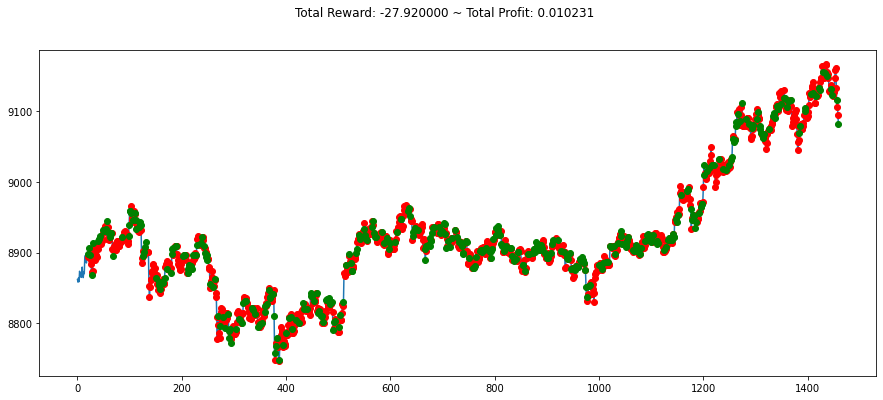

info {'total_reward': -154.42999999998392, 'total_profit': 0.009645789953332123, 'position': 0}


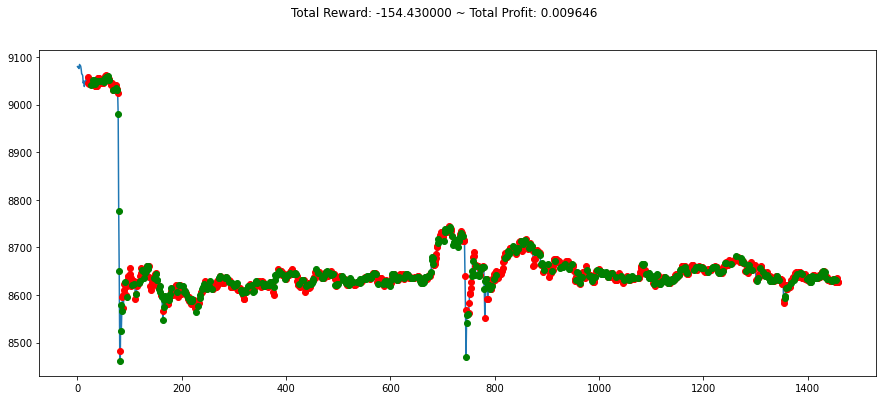

info {'total_reward': 173.4800000000023, 'total_profit': 0.013798201171349712, 'position': 0}


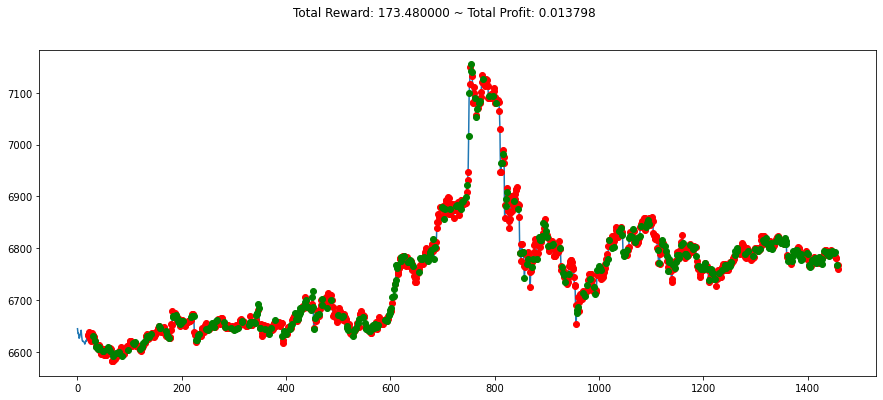

info {'total_reward': 131.23000000001048, 'total_profit': 0.013151859055475265, 'position': 0}


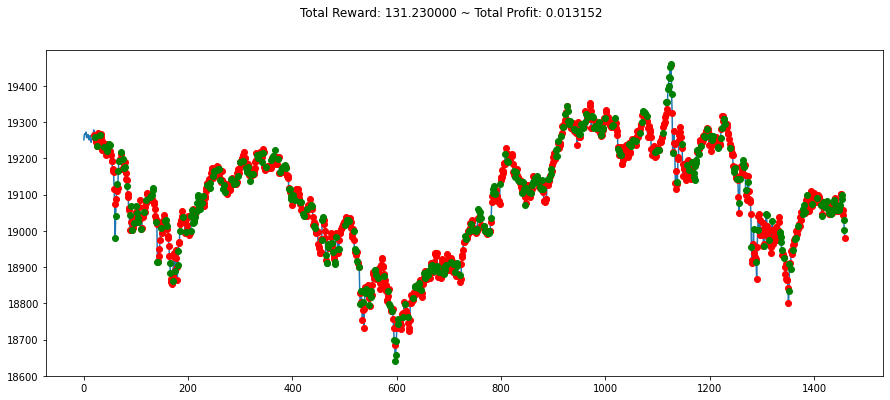

info {'total_reward': 58.55999999999949, 'total_profit': 0.012553271030127393, 'position': 0}


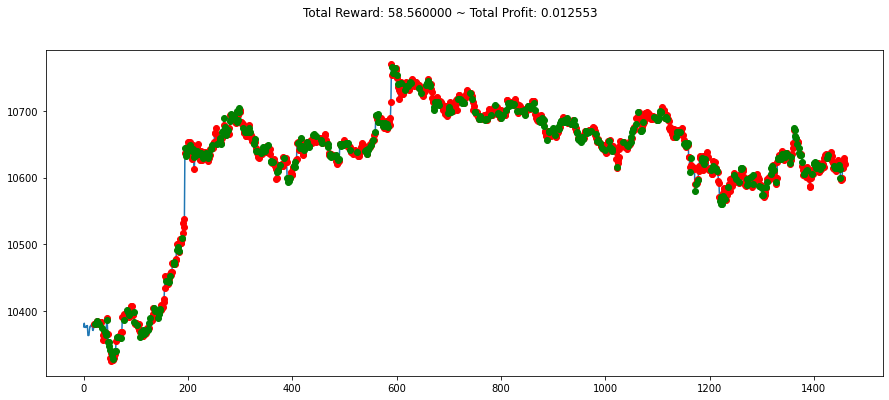

info {'total_reward': 0.679999999998472, 'total_profit': 0.010419150904786605, 'position': 0}


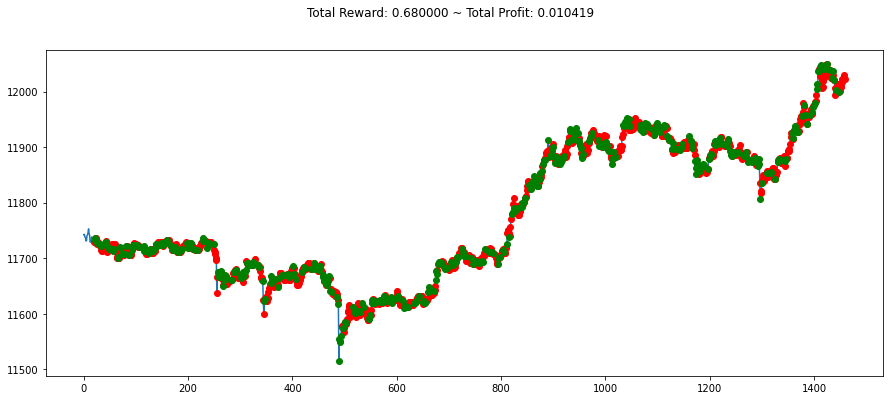

info {'total_reward': 61.32999999999265, 'total_profit': 0.011140534483298898, 'position': 1}


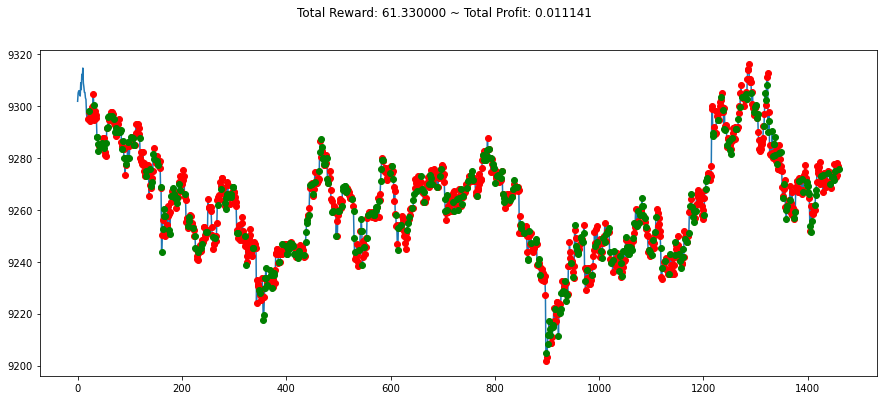

info {'total_reward': -98.93000000002212, 'total_profit': 0.018156143311533125, 'position': 0}


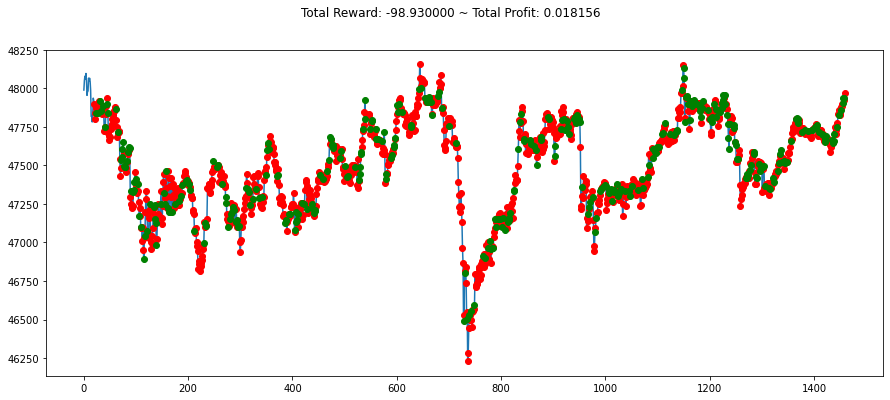

info {'total_reward': 580.2300000000105, 'total_profit': 0.016610570426634788, 'position': 1}


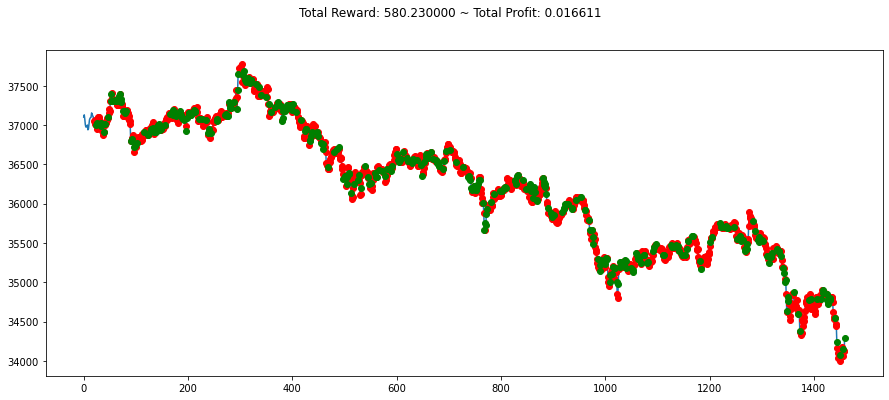

info {'total_reward': -237.22000000001026, 'total_profit': 0.010638962712110574, 'position': 0}


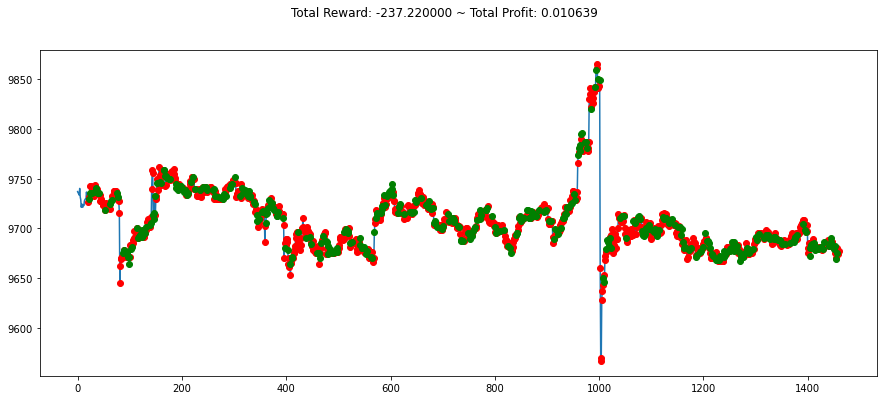

info {'total_reward': 90.78999999999633, 'total_profit': 0.010557346632600505, 'position': 0}


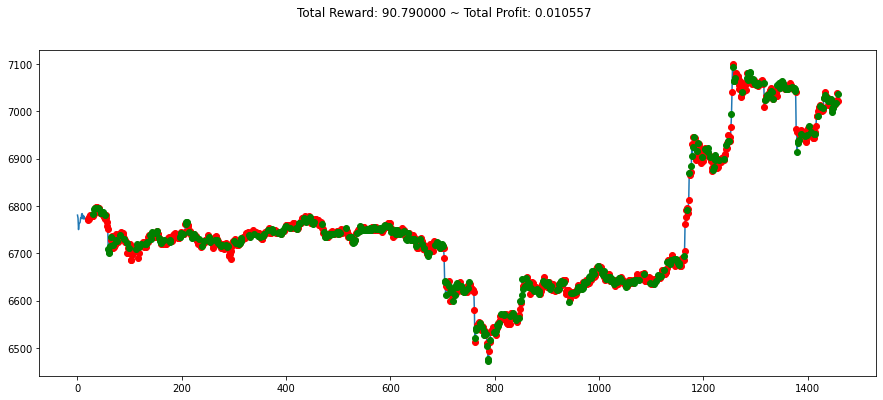

info {'total_reward': 1300.9300000000148, 'total_profit': 0.015576061616720108, 'position': 0}


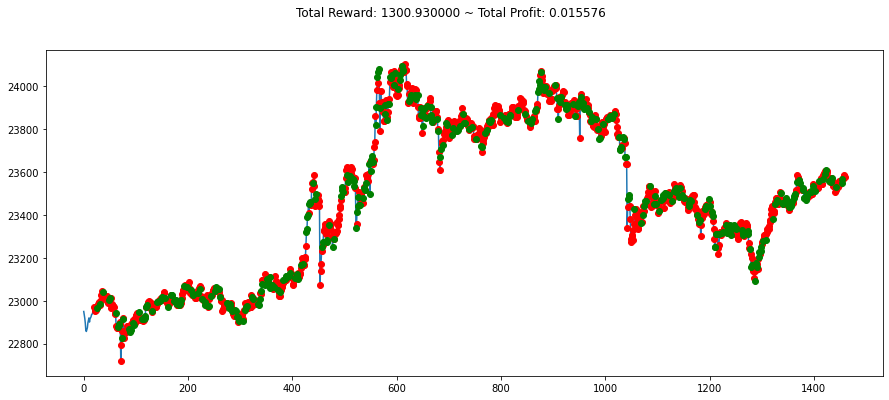

info {'total_reward': -73.85999999998239, 'total_profit': 0.009886644156143942, 'position': 1}


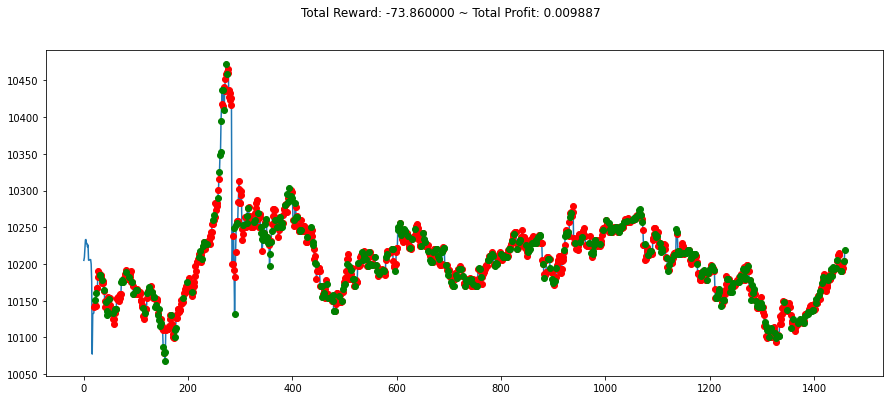

info {'total_reward': -431.53999999999996, 'total_profit': 0.010626681659176566, 'position': 1}


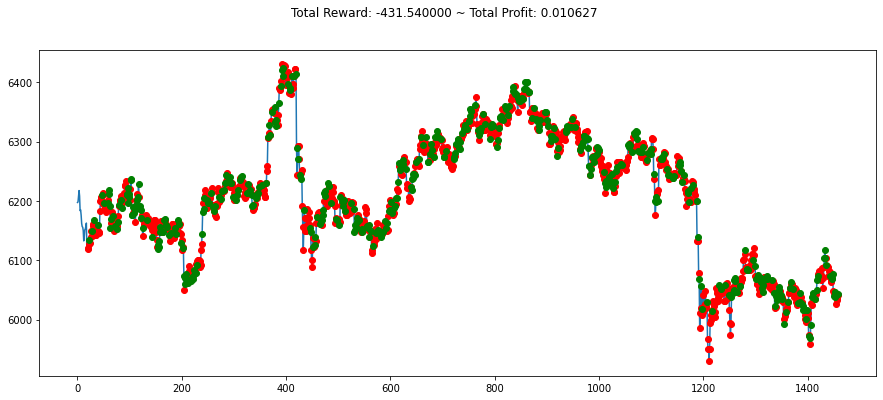

info {'total_reward': -81.21000000000276, 'total_profit': 0.011123212573201943, 'position': 1}


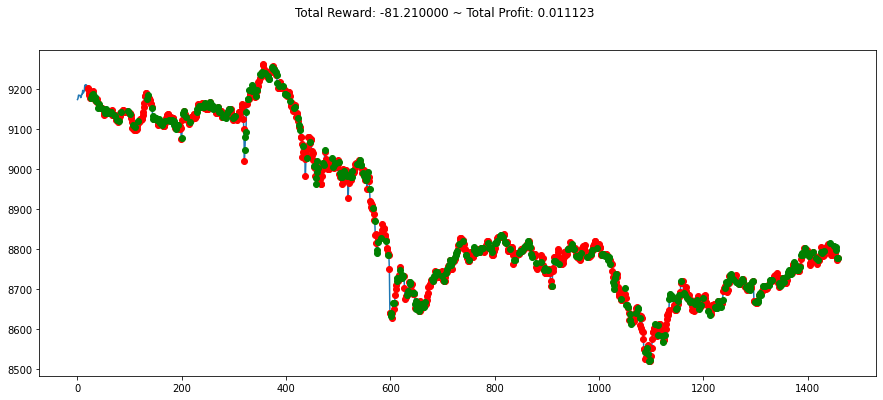

info {'total_reward': -81.63000000000011, 'total_profit': 0.009553282414761721, 'position': 1}


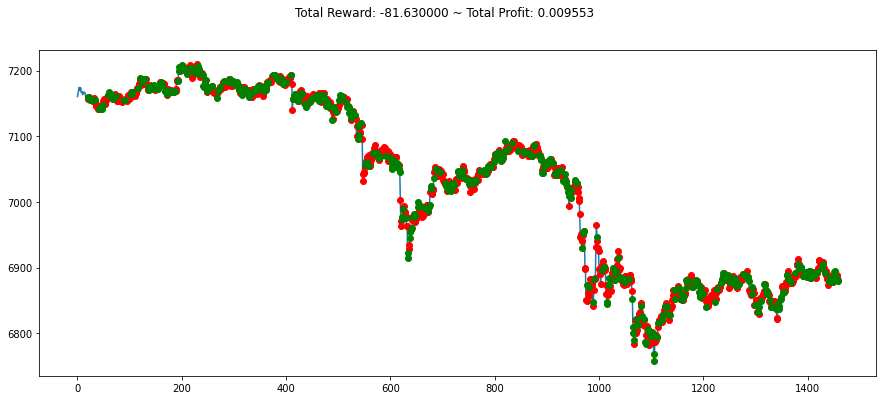

info {'total_reward': 32.20000000000255, 'total_profit': 0.015754138862493747, 'position': 0}


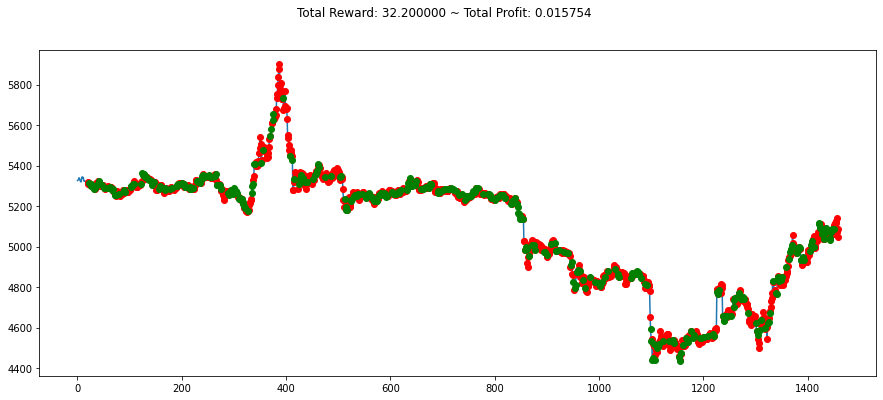

info {'total_reward': 4.389999999981228, 'total_profit': 0.015155109466631315, 'position': 1}


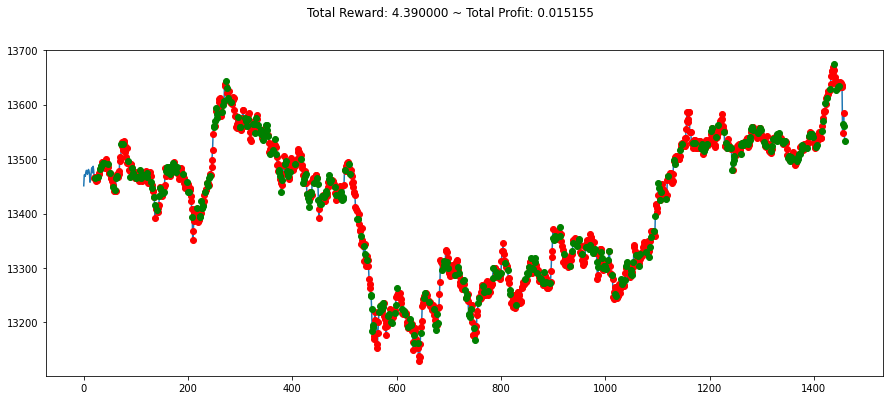

info {'total_reward': 274.9099999999089, 'total_profit': 0.015048559369665525, 'position': 0}


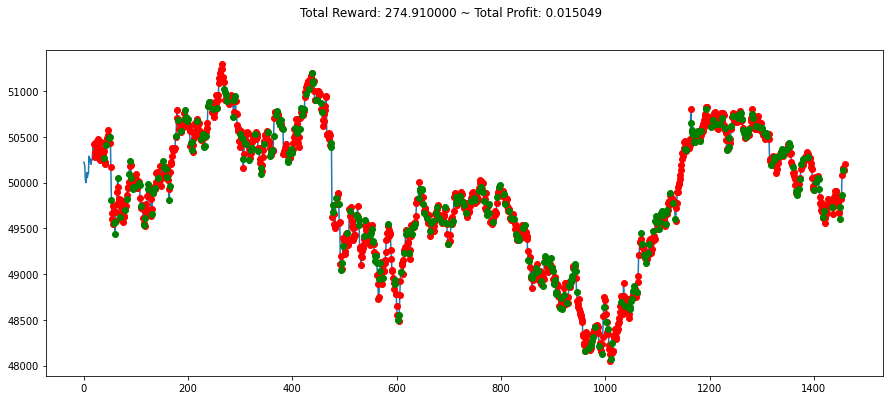

info {'total_reward': -22.669999999998254, 'total_profit': 0.010878065822135487, 'position': 0}


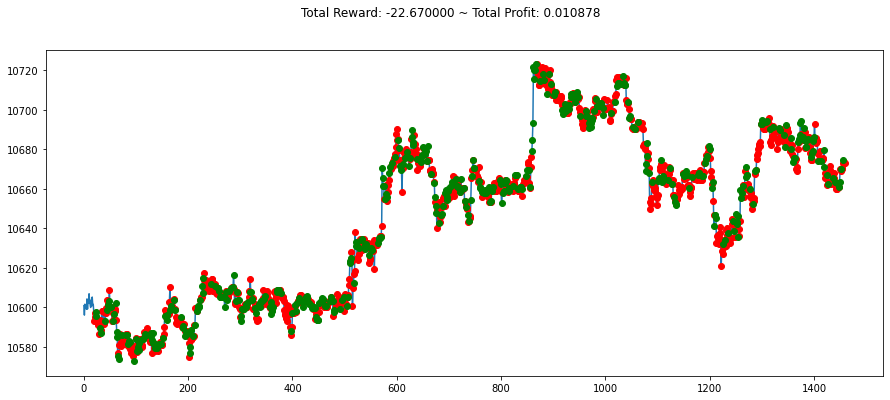

info {'total_reward': 22.210000000006403, 'total_profit': 0.009400066877260001, 'position': 0}


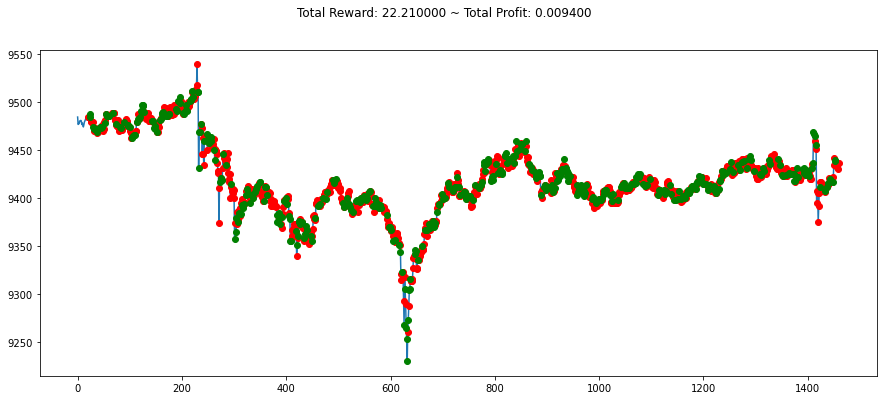

info {'total_reward': 248.3199999999979, 'total_profit': 0.015087065517744988, 'position': 1}


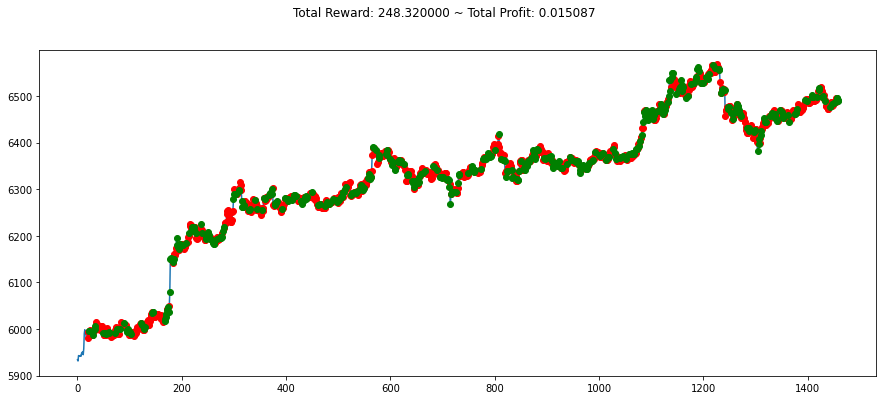

info {'total_reward': 1279.7000000000007, 'total_profit': 0.013390502278755127, 'position': 1}


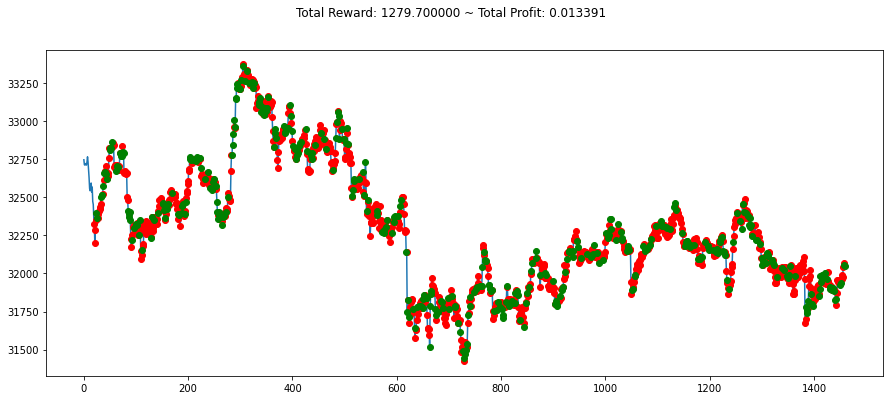

info {'total_reward': 225.35000000000764, 'total_profit': 0.01748285073423689, 'position': 0}


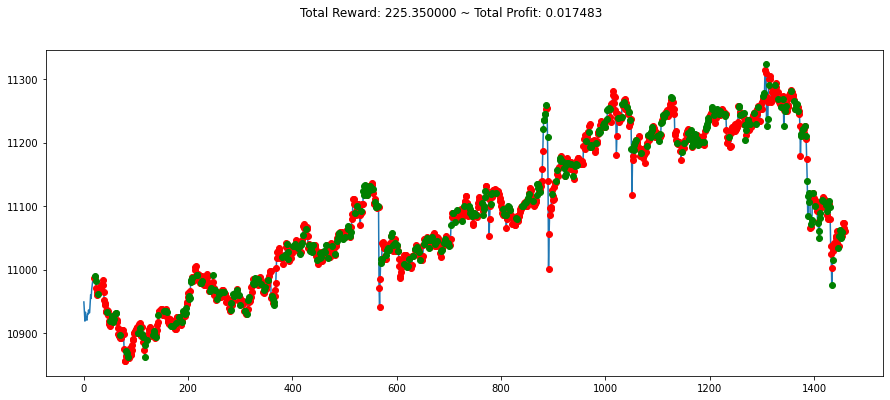

info {'total_reward': 1493.4400000000387, 'total_profit': 0.01347360741631983, 'position': 0}


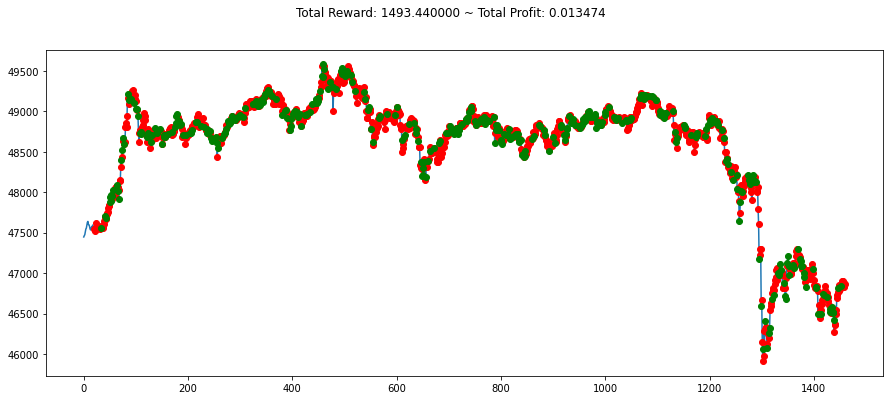

info {'total_reward': -132.2100000000355, 'total_profit': 0.013842657281429898, 'position': 0}


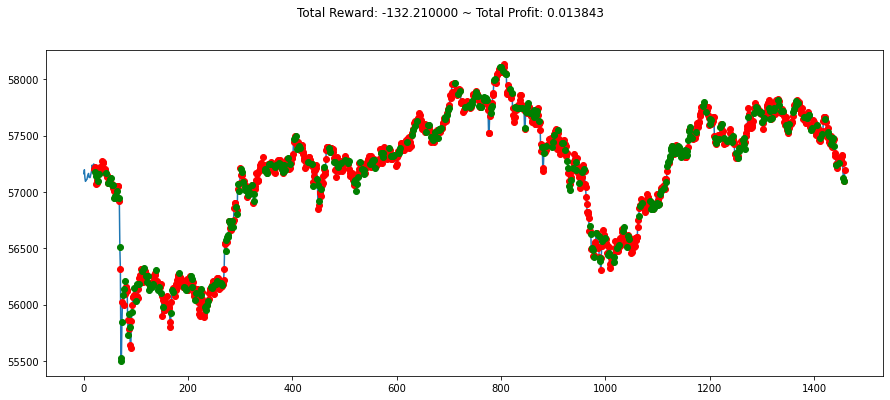

info {'total_reward': 127.30000000003929, 'total_profit': 0.015920927089850878, 'position': 0}


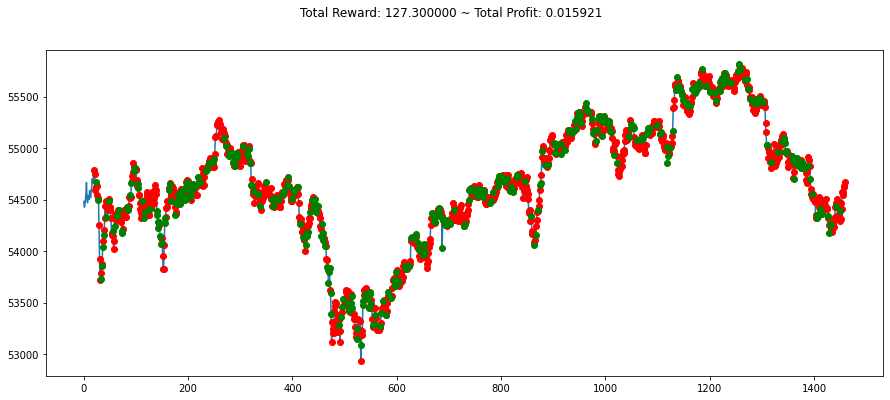

info {'total_reward': -306.88000000001193, 'total_profit': 0.013592015565623039, 'position': 0}


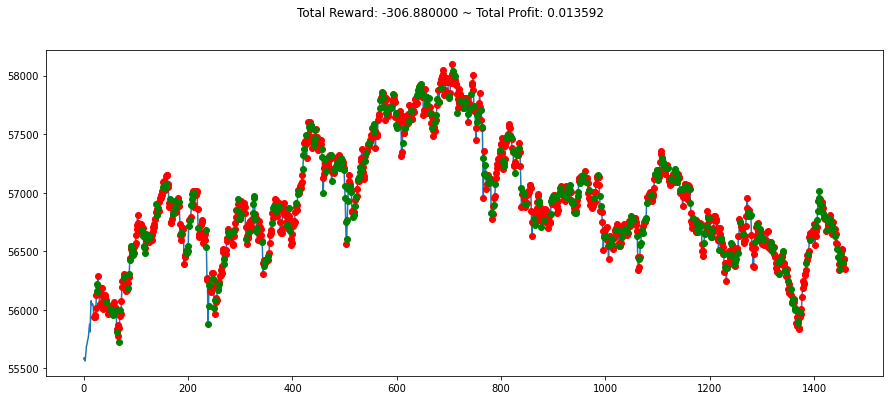

info {'total_reward': 158.1299999999992, 'total_profit': 0.012290072263047685, 'position': 0}


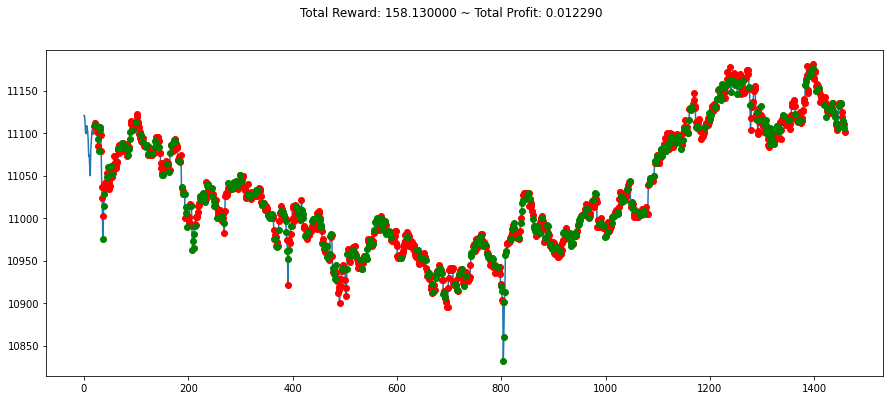

info {'total_reward': -34.750000000009095, 'total_profit': 0.009631497847040035, 'position': 0}


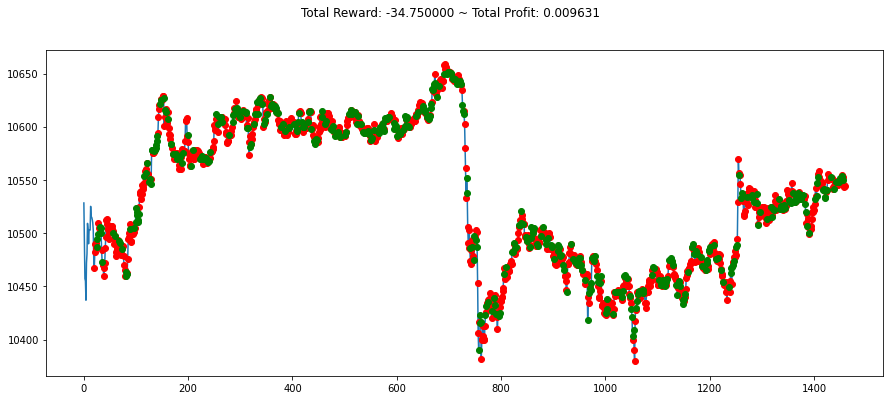

Volume,Volume_(currency), Rsi, Macd: A2C Model 30-random-days Average Profit: 0.01282053303290136 %


In [71]:
import os
import random
score_model_noprice_A2C=[]
for i in days_num:
    env_noprice_A2C = CustomEnv_A2C(df=stock, window_size=20, frame_bound=(i,i+1440))
    obs=env_noprice_A2C.reset()
    while True:
        obs=obs[np.newaxis,...]
        action,_states=model_noprice_A2C.predict(obs)
        obs,rewards, done, info=env_noprice_A2C.step(action)
        if done:
            print("info",info)
            score_model_noprice_A2C.append(info['total_profit'])
            break
    plt.figure(figsize=(15,6))
    plt.cla()
    env_noprice_A2C.render_all()
    plt.show()

print("Volume,Volume_(currency), Rsi, Macd: A2C Model 30-random-days Average Profit: "+str(mean(score_model_noprice_A2C))+" %")

# Time Series Approach
https://medium.com/geekculture/time-series-forecast-in-python-5c4c61e1c2c2

Test Statistic                   -0.826351
p-value                           0.811259
# Lags Used                       6.000000
Number of Observations Used    9993.000000
Critical Value (1%)              -3.431005
Critical Value (5%)              -2.861829
Critical Value (10%)             -2.566924
dtype: float64


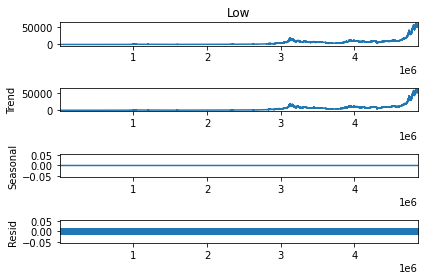

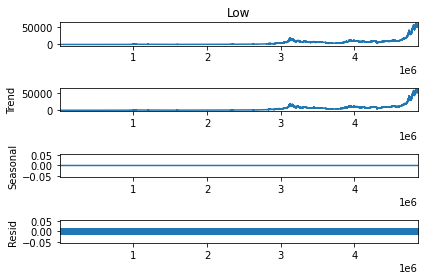

In [72]:
from statsmodels.tsa.stattools import adfuller
def test_trend(column):
    dftest=adfuller(column, autolag='AIC')
    dfoutput=pd.Series(dftest[0:4],index=['Test Statistic','p-value','# Lags Used','Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]=value
    print(dfoutput)
test_trend(df.Low[-10000:])
import statsmodels.api as sm
df2=df[['Timestamp','Low']]
df.set_index('Timestamp')
sm.tsa.seasonal_decompose(df2.Low, period=1).plot()

## First Order Differencing 

In [73]:
df.diff=df.Low.diff()[1:]
df['Diff']=pd.Series(pd.to_numeric(df.diff))
df.dropna()
#test_trend(df.diff[-100000:])



<ipython-input-73-839baec444e5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Diff']=pd.Series(pd.to_numeric(df.diff))


,Timestamp,Open,High,Low,Close,Volume,Volume_(currency),Weighted_price,Rsi,Obv,Ssma,Close_12_ema,Close_26_ema,Macd,Macd_9_ema,Macds,Macdh,Diff
548,1325350800,4.58,4.58,4.58,4.58,9.000000,41.220000,4.580000,100.000000,46.862297,4.493509,4.575417,4.575192,0.000224,0.000125,0.000125,0.000100,0.08
1896,1325431680,4.84,4.84,4.84,4.84,10.000000,48.400000,4.840000,100.000000,56.862297,4.586342,4.678684,4.670335,0.008348,0.003495,0.003495,0.004853,0.26
2333,1325457900,5.00,5.00,5.00,5.00,10.100000,50.500000,5.000000,100.000000,66.962297,4.668192,4.780111,4.762495,0.017616,0.008278,0.008278,0.009337,0.16
4553,1325591100,5.32,5.32,5.32,5.32,2.419173,12.870000,5.320000,100.000000,69.381470,4.829148,4.926797,4.891783,0.035014,0.016232,0.016232,0.018782,0.32
4710,1325600520,5.14,5.14,5.14,5.14,0.680000,3.495200,5.140000,80.265462,68.701470,4.879056,4.978616,4.941499,0.037118,0.021893,0.021893,0.015225,-0.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4857372,1617148560,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339,51.857139,-537590.424692,58678.534962,58686.300320,58677.717353,8.582967,1.350172,1.350172,7.232794,-28.31
4857373,1617148620,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508,51.826141,-537597.719540,58679.343299,58686.224886,58678.316808,7.908077,2.661753,2.661753,5.246324,-2.03
4857374,1617148680,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496,57.324721,-537596.013857,58684.287377,58692.011827,58681.688897,10.322930,4.193989,4.193989,6.128941,9.46
4857375,1617148740,58742.18,58770.38,58742.18,58760.59,0.720415,42332.958633,58761.866202,61.855629,-537595.293442,58692.765446,58702.562315,58687.533423,15.028892,6.360969,6.360969,8.667923,48.75


# Select Timeframe that Bitcoin Price Started to Grow


In [74]:
df1=df.iloc[3005000:]
df1

,Timestamp,Open,High,Low,Close,Volume,Volume_(currency),Weighted_price,Rsi,Obv,Ssma,Close_12_ema,Close_26_ema,Macd,Macd_9_ema,Macds,Macdh,Diff
4708923,1608241620,22688.97,22716.21,22678.72,22678.72,6.505410,147659.758180,22697.992450,56.961672,-535577.449727,22638.766422,22651.351248,22628.629784,22.721464,10.825759,10.825759,11.895705,3.91
4708924,1608241680,22692.55,22701.42,22645.69,22650.43,2.812329,63729.345162,22660.697111,52.842904,-535580.262056,22640.062375,22651.209518,22630.244615,20.964903,12.853587,12.853587,8.111315,-33.03
4708925,1608241740,22662.56,22698.77,22662.56,22698.77,9.964267,225969.153400,22677.951098,58.380709,-535570.297789,22646.585444,22658.526515,22635.320569,23.205946,14.924059,14.924059,8.281887,16.87
4708926,1608241800,22698.77,22717.70,22687.95,22705.77,4.645211,105422.055910,22694.781399,59.129189,-535565.652578,22653.161506,22665.794743,22640.539046,25.255698,16.990387,16.990387,8.265311,25.39
4708927,1608241860,22716.06,22760.00,22716.06,22749.07,16.026349,364375.015470,22735.997196,63.501714,-535549.626229,22663.818005,22678.606321,22648.578376,30.027946,19.597899,19.597899,10.430047,28.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4857372,1617148560,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339,51.857139,-537590.424692,58678.534962,58686.300320,58677.717353,8.582967,1.350172,1.350172,7.232794,-28.31
4857373,1617148620,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508,51.826141,-537597.719540,58679.343299,58686.224886,58678.316808,7.908077,2.661753,2.661753,5.246324,-2.03
4857374,1617148680,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496,57.324721,-537596.013857,58684.287377,58692.011827,58681.688897,10.322930,4.193989,4.193989,6.128941,9.46
4857375,1617148740,58742.18,58770.38,58742.18,58760.59,0.720415,42332.958633,58761.866202,61.855629,-537595.293442,58692.765446,58702.562315,58687.533423,15.028892,6.360969,6.360969,8.667923,48.75


In [75]:
stock.diff=stock.Low.diff()[1:]
stock['Diff']=pd.Series(pd.to_numeric(df.Diff))
#test_trend(df.diff[-10000:])
stock1=stock.iloc[2800000:]


stock1

,Timestamp,Open,High,Low,Close,Volume,Volume_(currency),Weighted_price,Rsi,Obv,Ssma,Macd,Macds,Macdh,Diff
4498449,1595613180,9565.43,9570.19,9565.43,9570.19,2.085241,19948.145740,9566.348863,59.597770,-535723.490983,9565.216437,1.875107,2.112737,-0.237630,2.72
4498450,1595613240,9564.26,9566.31,9564.26,9566.31,0.741686,7094.852975,9565.842736,53.299107,-535724.232669,9565.337944,1.770470,2.044284,-0.273814,-1.17
4498451,1595613300,9566.58,9571.44,9564.01,9571.44,0.676690,6473.553317,9566.495986,59.407592,-535723.555979,9566.015950,2.077543,2.050936,0.026608,-0.25
4498452,1595613360,9571.42,9572.19,9566.70,9572.19,1.778856,17022.337453,9569.262082,60.226676,-535721.777123,9566.701955,2.354281,2.111605,0.242676,2.69
4498453,1595613420,9569.53,9572.24,9569.53,9572.24,0.382782,3664.053017,9572.157445,60.284212,-535721.394341,9567.317294,2.548258,2.198935,0.349323,2.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4857372,1617148560,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339,51.857139,-537590.424692,58678.534962,8.582967,1.350172,7.232794,-28.31
4857373,1617148620,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508,51.826141,-537597.719540,58679.343299,7.908077,2.661753,5.246324,-2.03
4857374,1617148680,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496,57.324721,-537596.013857,58684.287377,10.322930,4.193989,6.128941,9.46
4857375,1617148740,58742.18,58770.38,58742.18,58760.59,0.720415,42332.958633,58761.866202,61.855629,-537595.293442,58692.765446,15.028892,6.360969,8.667923,48.75


In [76]:
import random

days_num=[]
for i in range(30):
    num=random.randint(int(len(stock1)*0.8),len(stock1)-1440) #
    days_num.append(num) 

## Time Series: Price Only, Using PPO


In [77]:
def add_signals(env):
    start = env.frame_bound[0] - env.window_size
    end = env.frame_bound[1]
    prices = env.df.loc[:, 'Low'].to_numpy()[start:end]
    signal_features = env.df.loc[:, ['Low','Diff']].to_numpy()[start:end]
    return prices, signal_features
class MyCustomTimeSeries(StocksEnv):
    _process_data = add_signals
env_price_timeseries= MyCustomTimeSeries(df=df1, window_size=20, frame_bound=(20,int(len(df)*0.8)))
env_maker = lambda: env_price_timeseries
env = DummyVecEnv([env_maker])
model_price_timeseries = PPO("MlpPolicy", env, verbose=1,tensorboard_log="/Users/danies/Desktop/projects/RLBitcoin1/tensorboard/model_price_timeseries_PPO")
model_price_timeseries.learn(total_timesteps=10000)
#model_price_timeseries.save("/Users/danies/Desktop/projects/RLBitcoin1/model_priceonly_timeseries_PPO")
#model_price_timeseries = PPO.load("/Users/danies/Desktop/projects/RLBitcoin/model/model_priceonly_timeseries_PPO.zip")

Using cpu device
Logging to /Users/danies/Desktop/projects/RLBitcoin1/tensorboard/model_price_timeseries_PPO/PPO_6
-----------------------------
| time/              |      |
|    fps             | 1856 |
|    iterations      | 1    |
|    time_elapsed    | 1    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 1243        |
|    iterations           | 2           |
|    time_elapsed         | 3           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.013966188 |
|    clip_fraction        | 0.0218      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.686      |
|    explained_variance   | 0           |
|    learning_rate        | 0.0003      |
|    loss                 | 871         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00214    |
|  

info {'total_reward': -11.64999999999992, 'total_profit': 0.004059967811913934, 'position': 1}


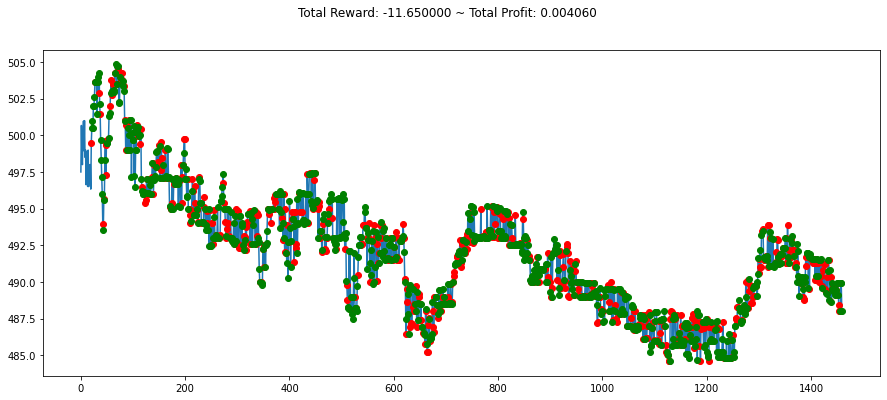

info {'total_reward': 36.550000000000296, 'total_profit': 0.005481478626459345, 'position': 0}


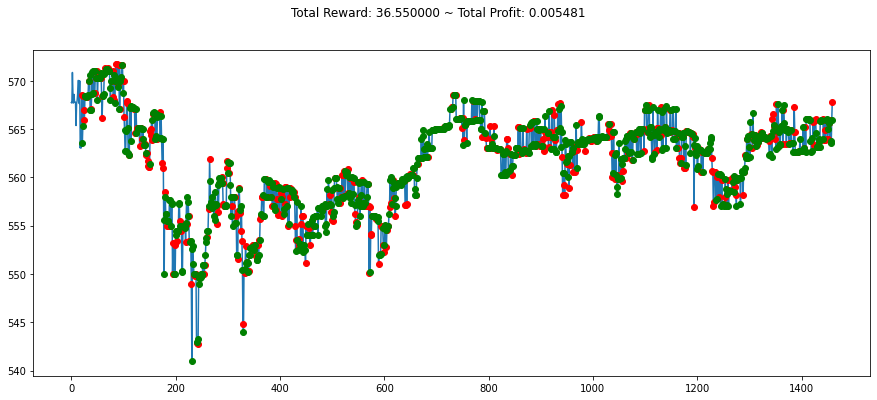

info {'total_reward': -13.39999999999975, 'total_profit': 0.004953376081087912, 'position': 0}


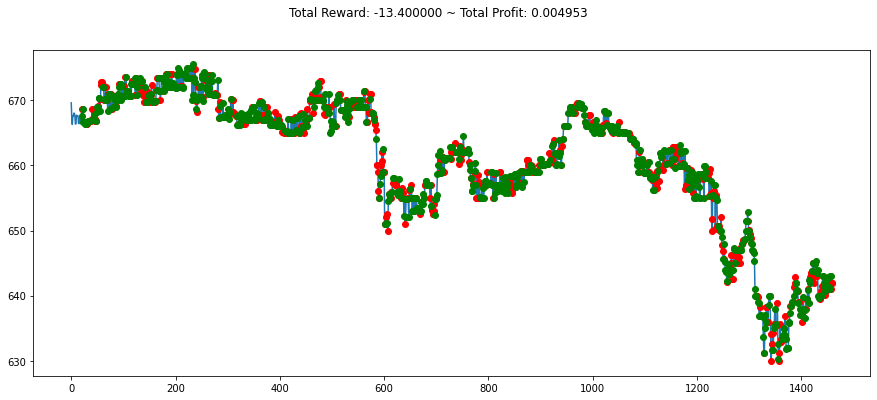

info {'total_reward': -3.760000000000389, 'total_profit': 0.005746767901731626, 'position': 0}


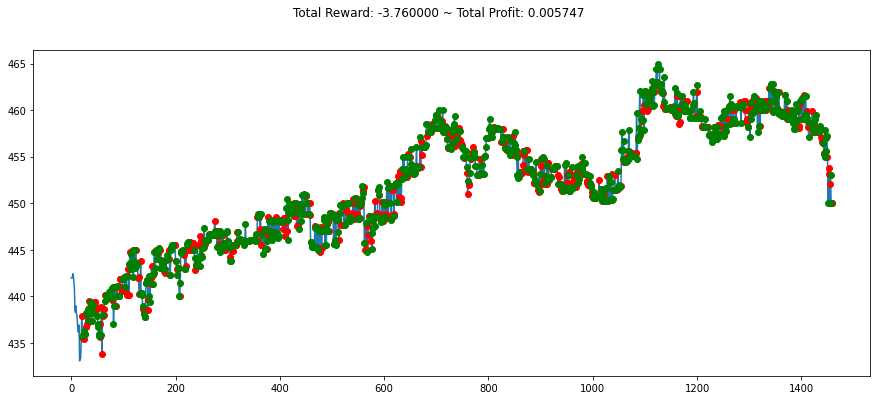

info {'total_reward': 32.940000000000055, 'total_profit': 0.005754671226073503, 'position': 1}


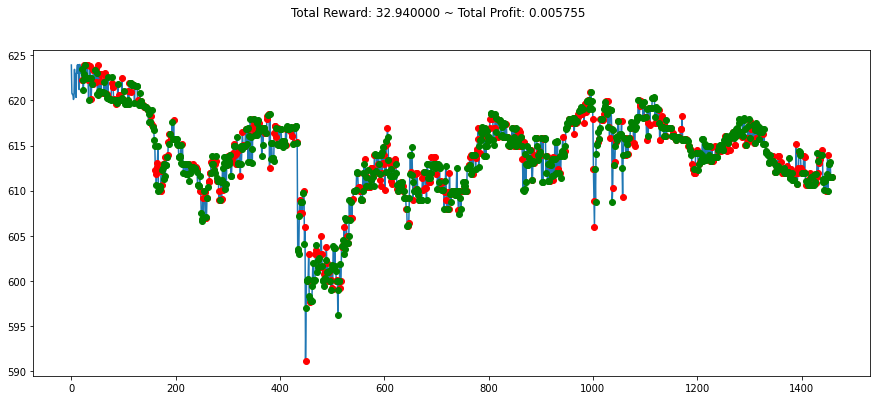

info {'total_reward': -24.25999999999982, 'total_profit': 0.004117307507096274, 'position': 0}


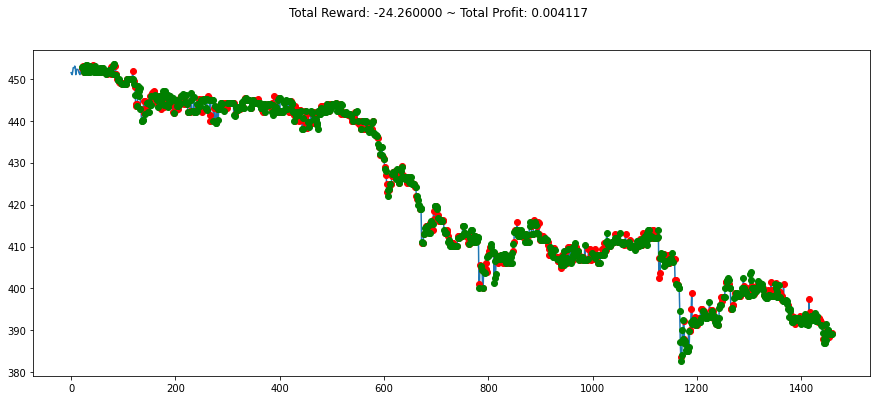

info {'total_reward': 13.820000000000391, 'total_profit': 0.0045258130716222715, 'position': 1}


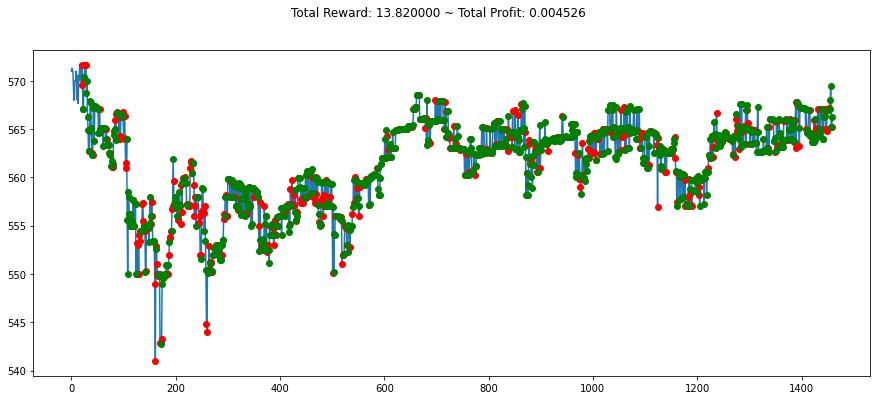

info {'total_reward': -40.53000000000077, 'total_profit': 0.004762452277569723, 'position': 1}


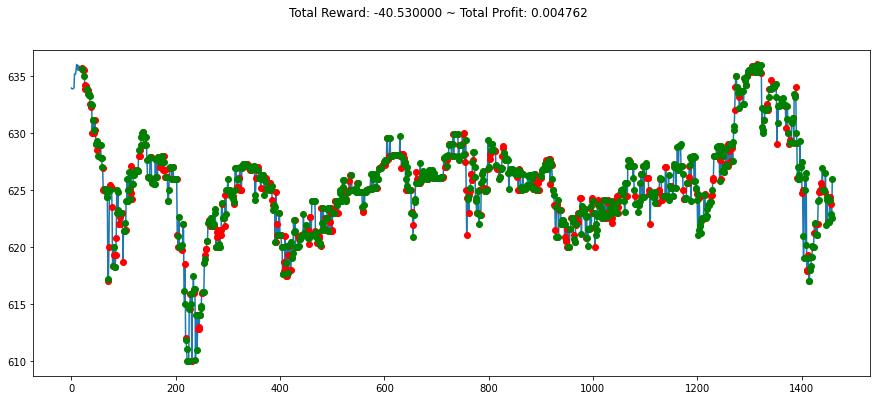

info {'total_reward': 4.029999999999291, 'total_profit': 0.005499278872185321, 'position': 1}


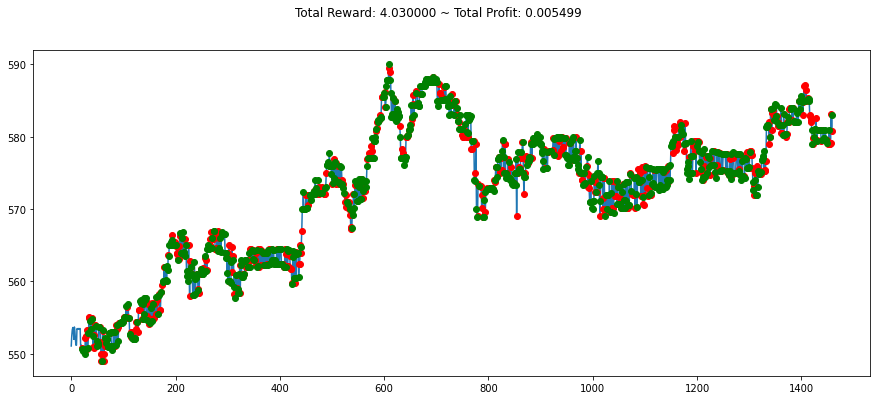

info {'total_reward': 3.9700000000000273, 'total_profit': 0.00439033117173495, 'position': 0}


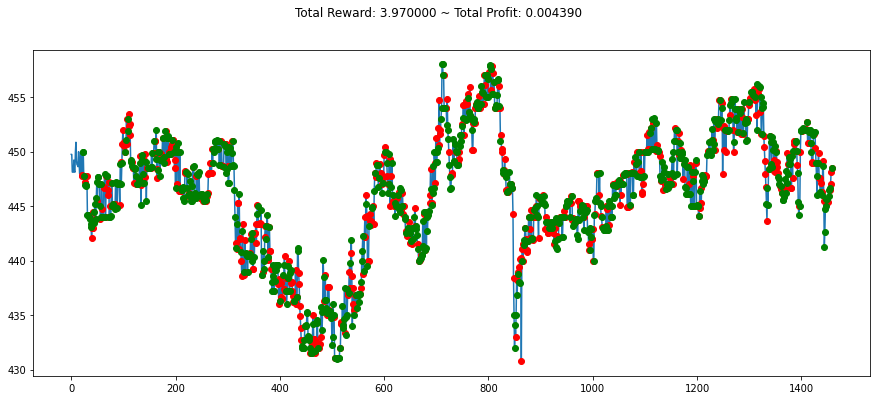

info {'total_reward': -24.81999999999971, 'total_profit': 0.005472137864785306, 'position': 0}


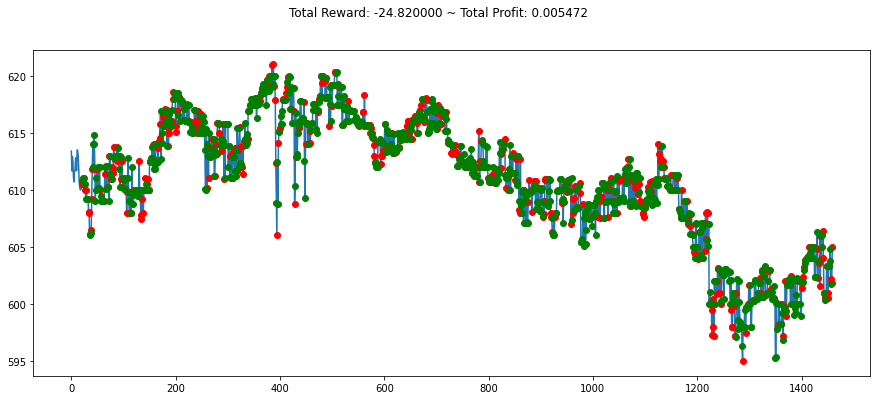

info {'total_reward': 10.240000000000578, 'total_profit': 0.0040998226389890955, 'position': 1}


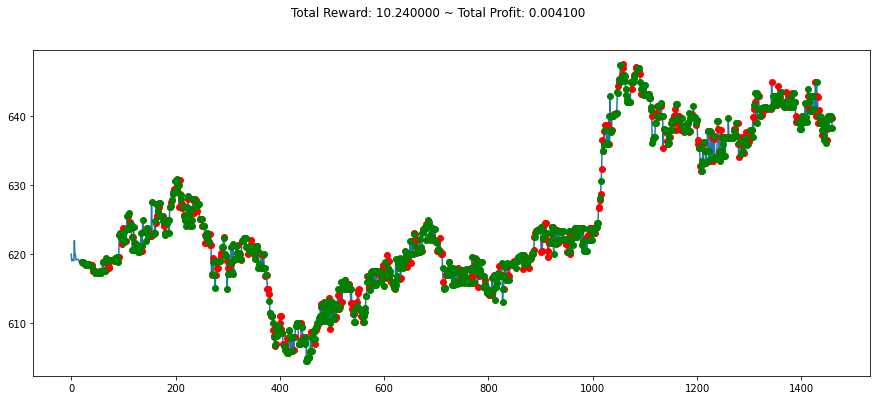

info {'total_reward': 39.400000000000205, 'total_profit': 0.005474770988671896, 'position': 1}


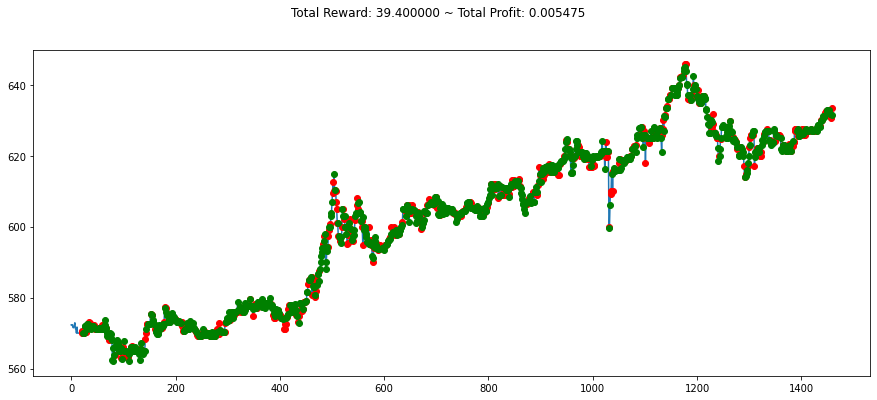

info {'total_reward': -38.42000000000007, 'total_profit': 0.005025561523873531, 'position': 1}


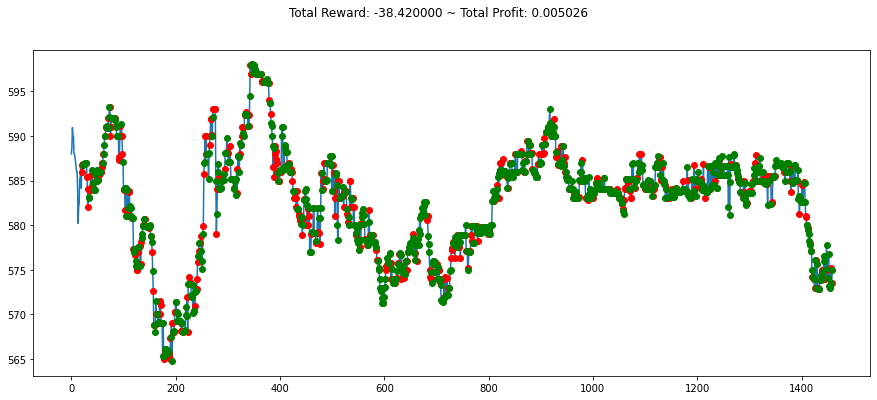

info {'total_reward': -9.179999999999723, 'total_profit': 0.004908808852823292, 'position': 1}


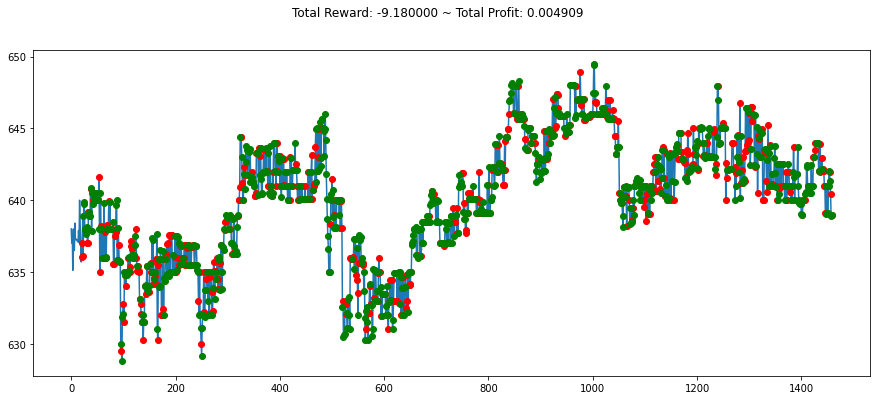

info {'total_reward': 14.090000000000487, 'total_profit': 0.005179209125381739, 'position': 0}


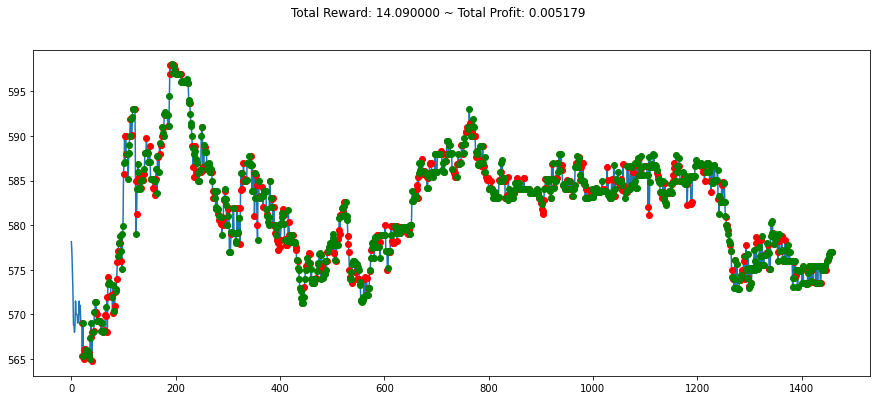

info {'total_reward': -8.219999999999573, 'total_profit': 0.004466374905621826, 'position': 0}


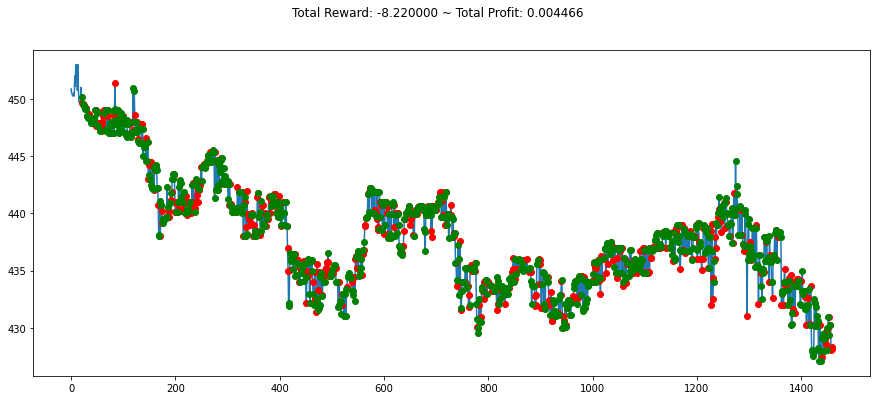

info {'total_reward': -21.659999999999627, 'total_profit': 0.003720905568433947, 'position': 1}


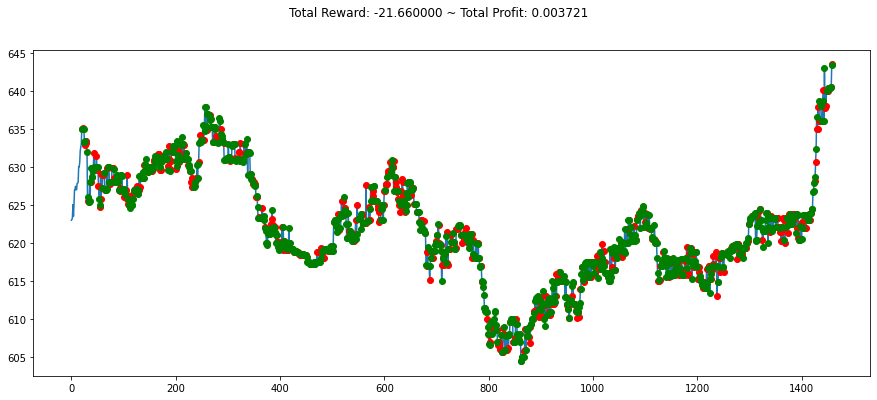

info {'total_reward': -30.810000000001537, 'total_profit': 0.006315449743070027, 'position': 1}


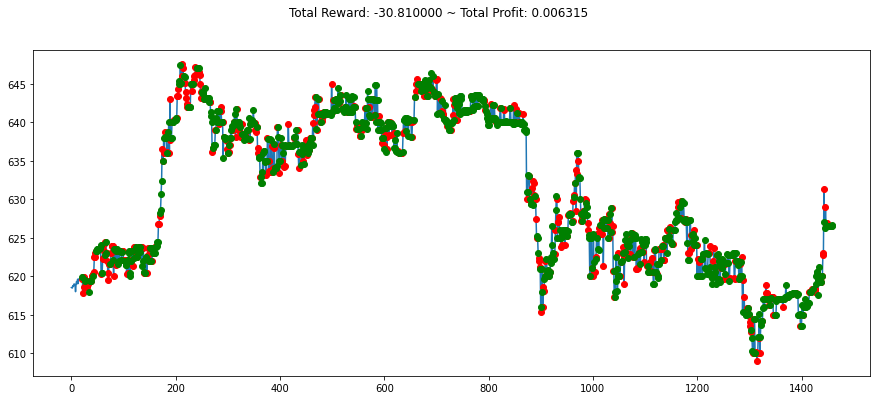

info {'total_reward': 17.179999999999495, 'total_profit': 0.004035283592989529, 'position': 1}


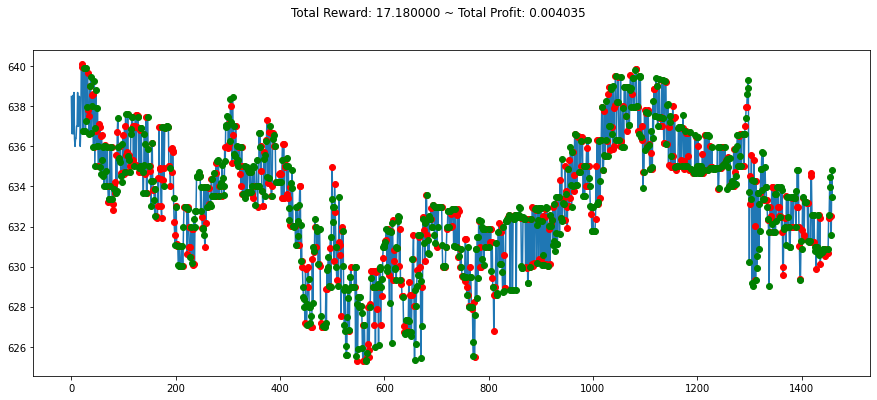

info {'total_reward': -8.720000000000312, 'total_profit': 0.004817177987335873, 'position': 1}


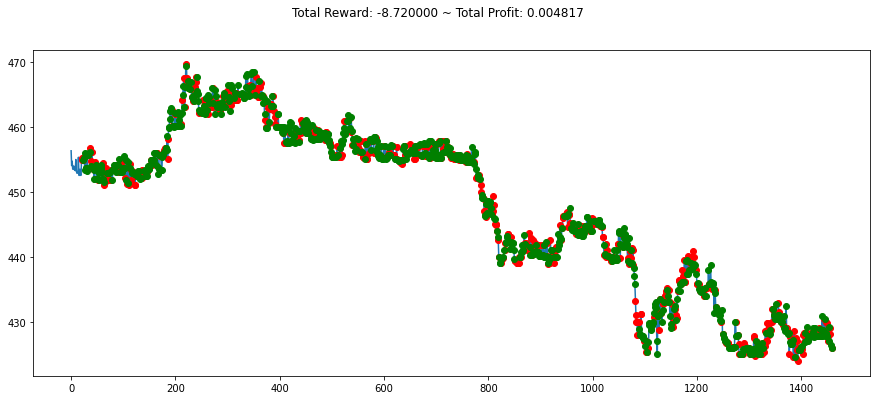

info {'total_reward': -21.309999999999775, 'total_profit': 0.004023543184795593, 'position': 0}


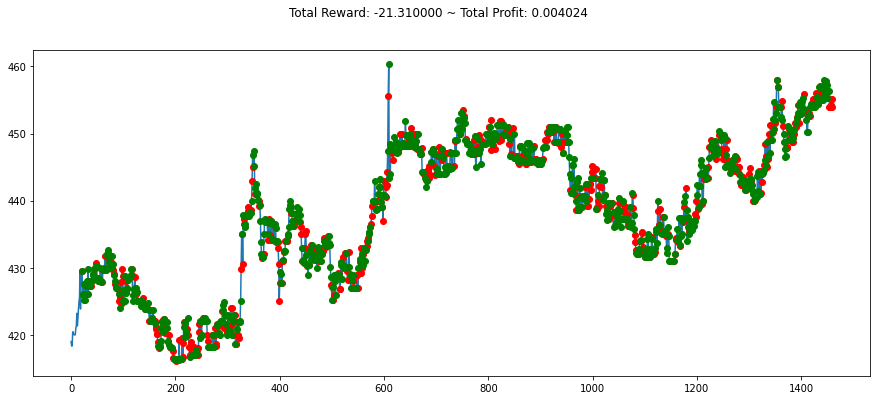

info {'total_reward': -86.99000000000171, 'total_profit': 0.005236113239925945, 'position': 1}


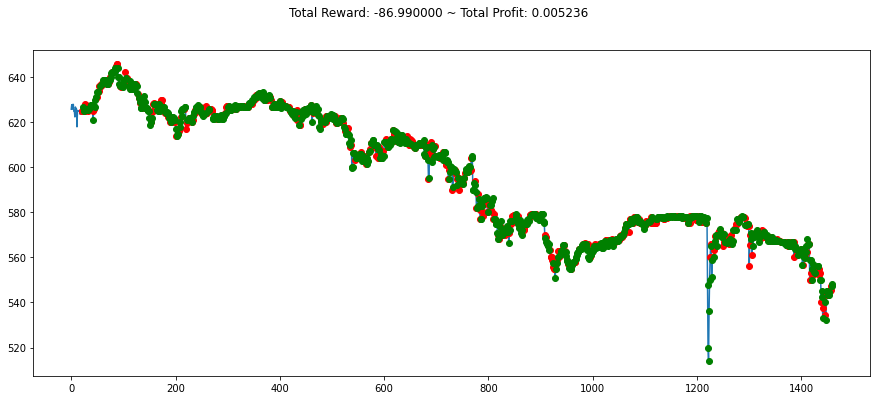

info {'total_reward': 3.2499999999997726, 'total_profit': 0.004120718051408431, 'position': 1}


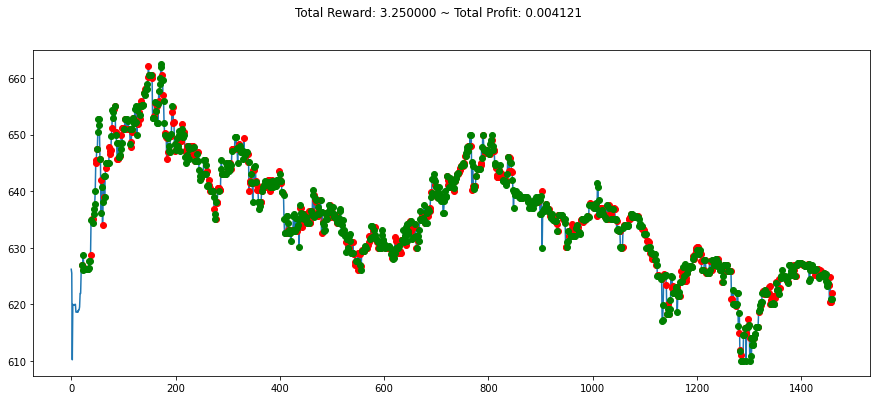

info {'total_reward': -0.6699999999995043, 'total_profit': 0.006236499992110986, 'position': 1}


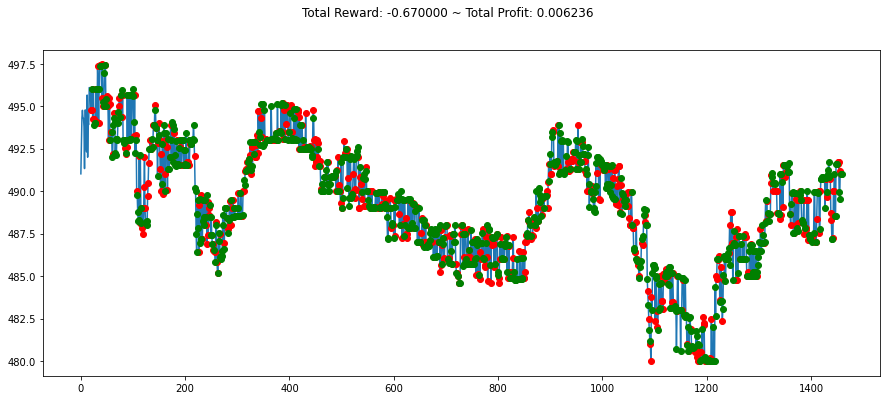

info {'total_reward': -10.379999999999654, 'total_profit': 0.004248273978110968, 'position': 1}


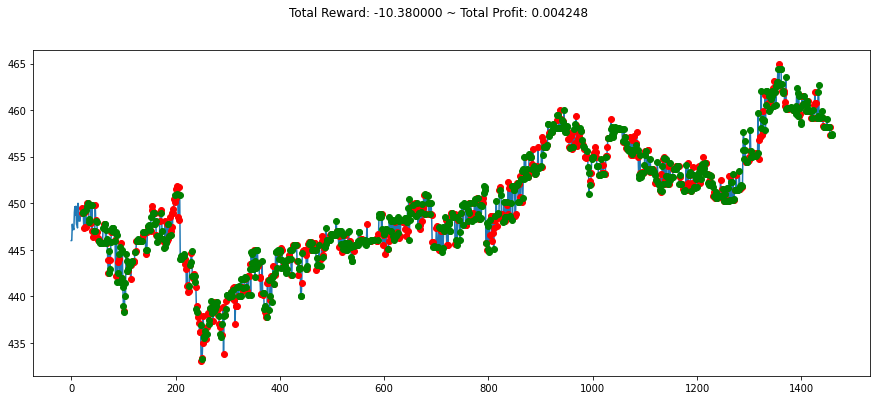

info {'total_reward': 19.490000000001032, 'total_profit': 0.004702410955382348, 'position': 0}


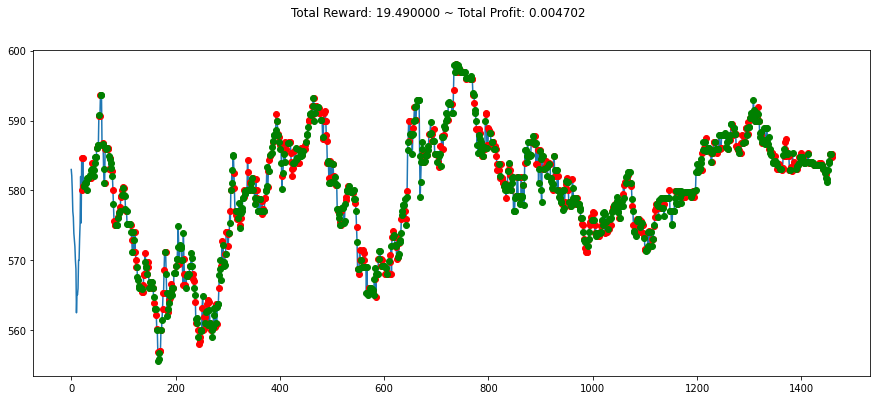

info {'total_reward': -17.55999999999966, 'total_profit': 0.00493206845358675, 'position': 0}


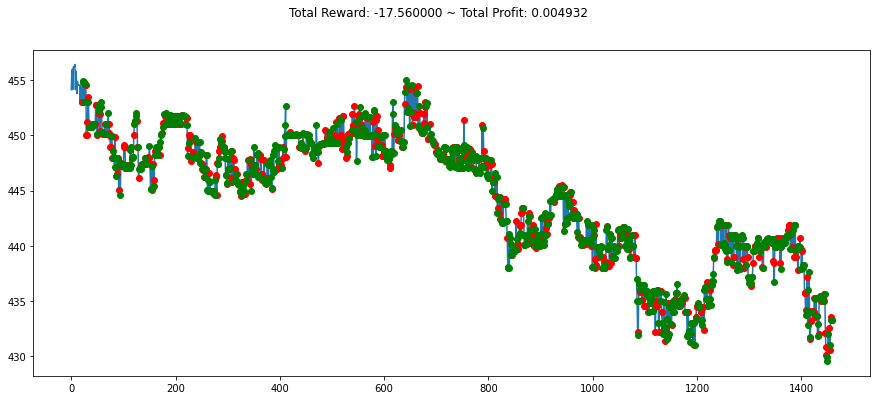

info {'total_reward': 38.96000000000015, 'total_profit': 0.005343452788826107, 'position': 1}


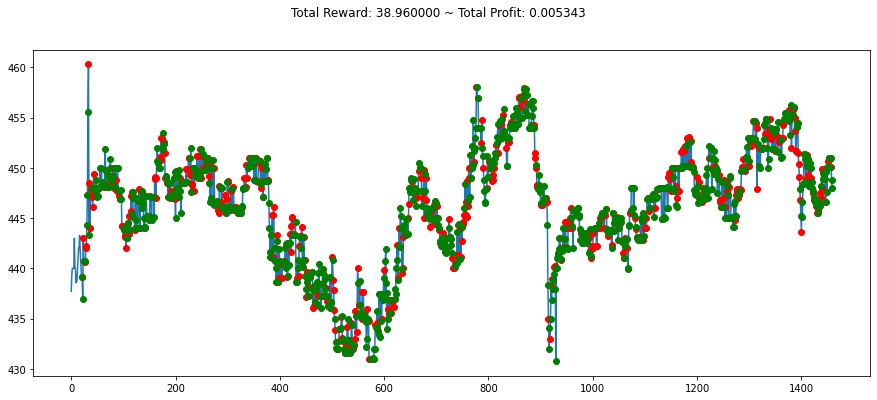

info {'total_reward': -29.02999999999963, 'total_profit': 0.004688216937372525, 'position': 1}


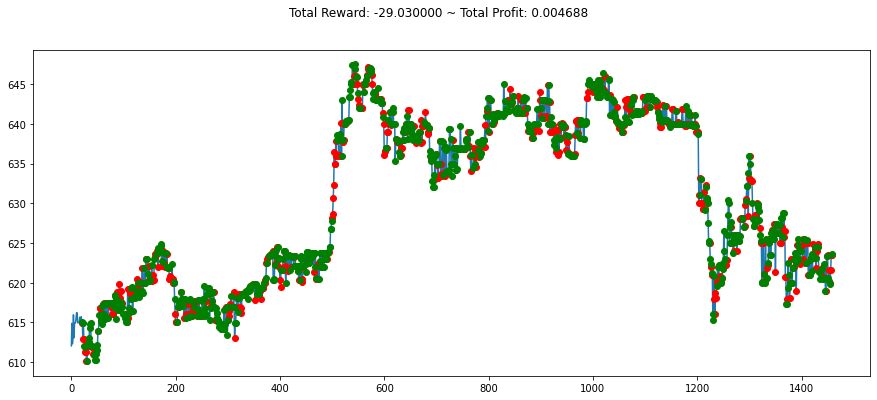

Price only PPO Model 30-random-days Average Profit: 0.004877941497365686 %


In [89]:
import os
import random

score_model_priceonly_timeseries_PPO=[]
for i in days_num:
    env_price_timeseries= MyCustomTimeSeries(df=df, window_size=20, frame_bound=(i,i+1440))
    obs=env_price_timeseries.reset()
    while True:
        obs=obs[np.newaxis,...]
        action,_states=model_price_timeseries.predict(obs)
        obs,rewards, done, info=env_price_timeseries.step(action)
        if done:
            print("info",info)
            score_model_priceonly_timeseries_PPO.append(info['total_profit'])
            break
    plt.figure(figsize=(15,6))
    plt.cla()
    env_price_timeseries.render_all()
    plt.show()

print("Price only PPO Model 30-random-days Average Profit: "+str(mean(score_model_priceonly_timeseries_PPO))+" %")

## Time Series: Price Only, Using A2C

In [79]:
def add_signals(env):
    start = env.frame_bound[0] - env.window_size
    end = env.frame_bound[1]
    prices = env.df.loc[:, 'Low'].to_numpy()[start:end]
    signal_features = env.df.loc[:, ['Low','Diff']].to_numpy()[start:end]
    return prices, signal_features
class MyCustomTimeSeries_A2C(StocksEnv):
    _process_data = add_signals
from stable_baselines3 import PPO
env_price_timeseries_A2C= MyCustomTimeSeries_A2C(df=df1, window_size=20, frame_bound=(20,int(len(df)*0.8)))
env_maker = lambda: env_price_timeseries_A2C
env = DummyVecEnv([env_maker])
model_price_timeseries_A2C = A2C("MlpPolicy", env, verbose=1,tensorboard_log="/Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_price_timeseries_A2C")
model_price_timeseries_A2C.learn(total_timesteps=10000)
#model_price_timeseries_A2C.save("/Users/danies/Desktop/projects/RLBitcoin/model_price_timeseries_A2C")
#model_price_timeseries_A2C =A2C.load("/Users/danies/Desktop/projects/RLBitcoin/model/model_priceonly_timeseries_A2C.zip")

Using cpu device
Logging to /Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_price_timeseries_A2C/A2C_5
-------------------------------------
| time/                 |           |
|    fps                | 906       |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 500       |
| train/                |           |
|    entropy_loss       | -0.289    |
|    explained_variance | 5.96e-08  |
|    learning_rate      | 0.0007    |
|    n_updates          | 99        |
|    policy_loss        | -0.000222 |
|    value_loss         | 7.78e-06  |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 892       |
|    iterations         | 200       |
|    time_elapsed       | 1         |
|    total_timesteps    | 1000      |
| train/                |           |
|    entropy_loss       | -0.387    |
|    explained_variance | -1.19e-07 |
|    learnin

------------------------------------
| time/                 |          |
|    fps                | 869      |
|    iterations         | 1700     |
|    time_elapsed       | 9        |
|    total_timesteps    | 8500     |
| train/                |          |
|    entropy_loss       | -0.649   |
|    explained_variance | 0        |
|    learning_rate      | 0.0007   |
|    n_updates          | 1699     |
|    policy_loss        | -3.57    |
|    value_loss         | 945      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 855      |
|    iterations         | 1800     |
|    time_elapsed       | 10       |
|    total_timesteps    | 9000     |
| train/                |          |
|    entropy_loss       | -0.628   |
|    explained_variance | 0        |
|    learning_rate      | 0.0007   |
|    n_updates          | 1799     |
|    policy_loss        | 0.00349  |
|    value_loss         | 2.13e-05 |
-

info {'total_reward': -15.059999999999945, 'total_profit': 0.011060734270653048, 'position': 0}


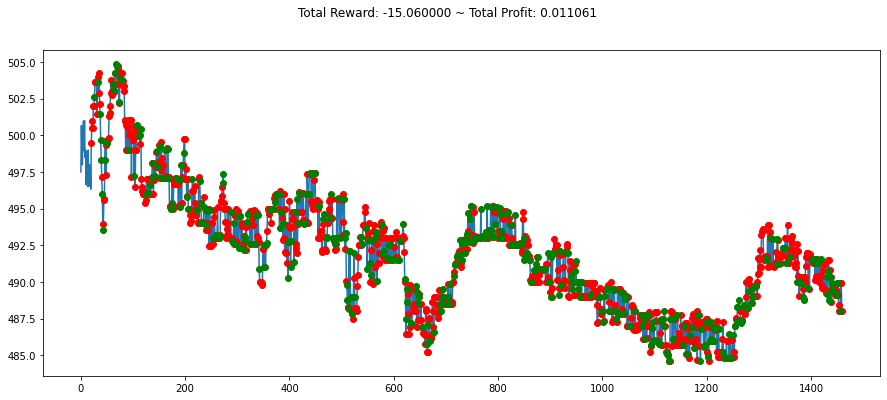

info {'total_reward': 19.629999999999995, 'total_profit': 0.014578948097892865, 'position': 0}


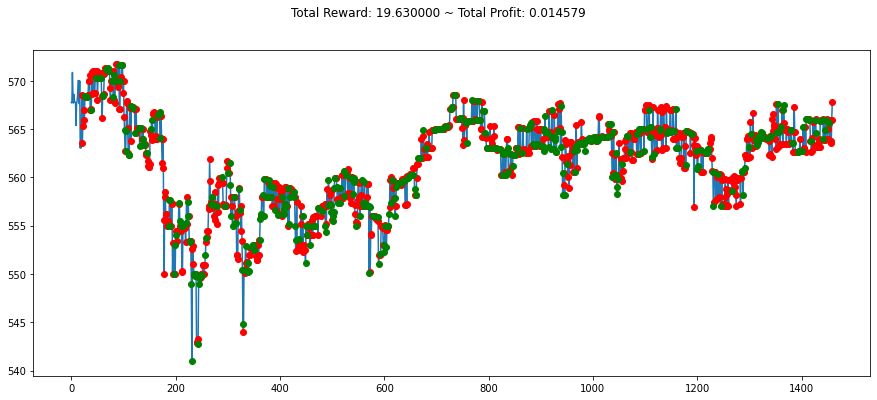

info {'total_reward': 2.9600000000000364, 'total_profit': 0.009994159030169224, 'position': 1}


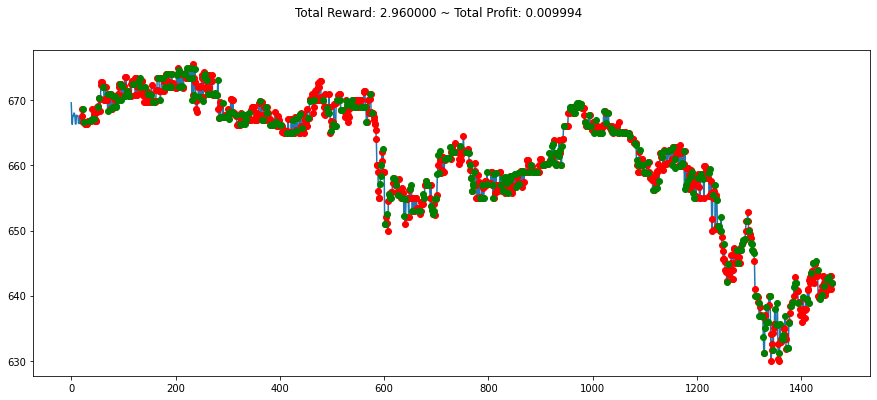

info {'total_reward': -31.139999999999418, 'total_profit': 0.010638259856846797, 'position': 1}


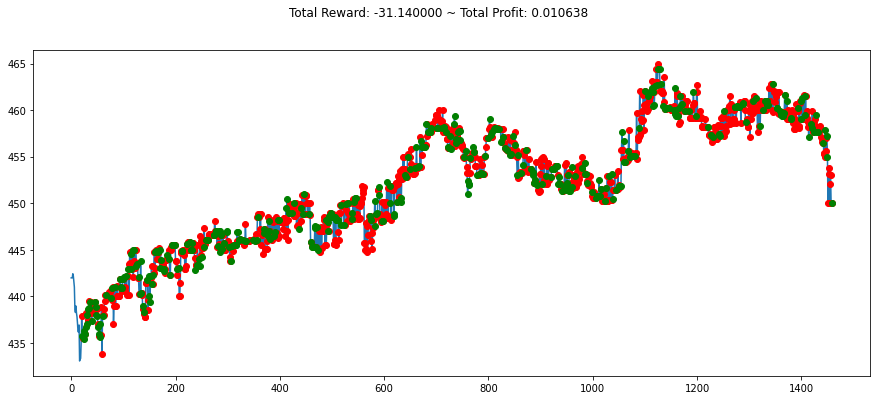

info {'total_reward': 0.08000000000129148, 'total_profit': 0.014961873323283113, 'position': 0}


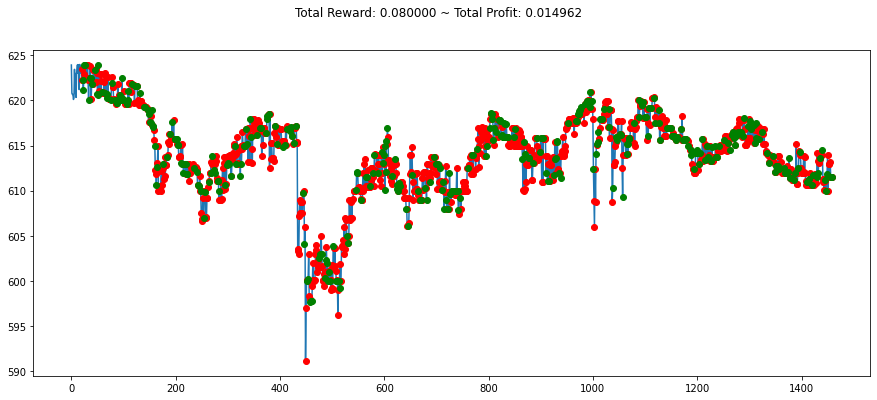

info {'total_reward': -19.24000000000018, 'total_profit': 0.01683167307585922, 'position': 0}


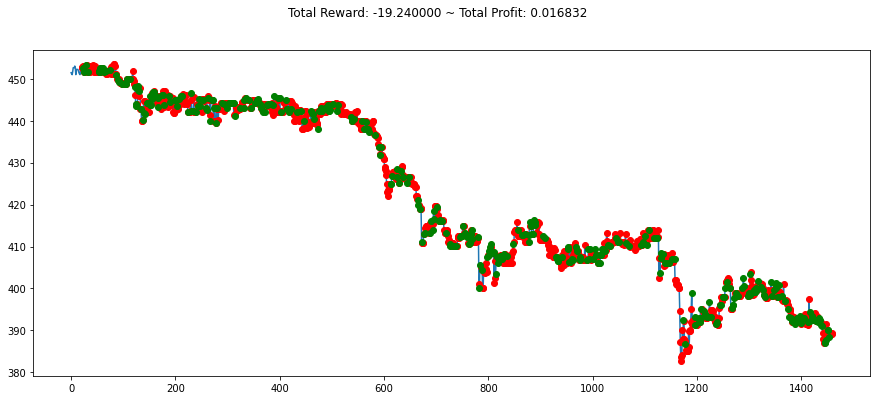

info {'total_reward': 18.589999999999918, 'total_profit': 0.015009761587801087, 'position': 1}


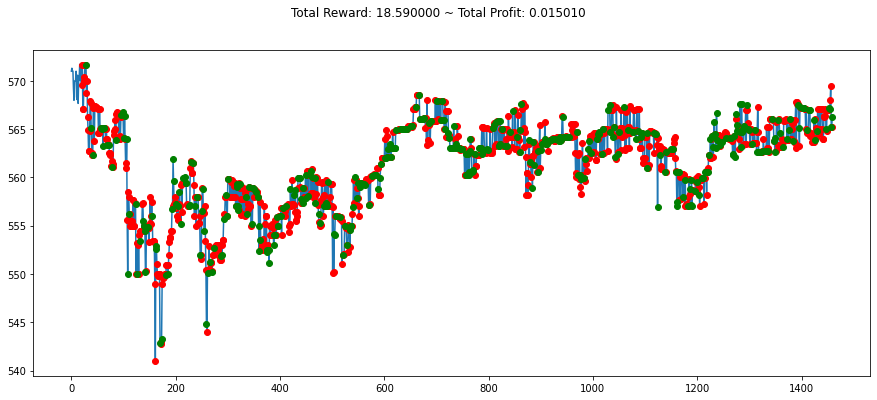

info {'total_reward': -28.740000000000123, 'total_profit': 0.010729978295067963, 'position': 0}


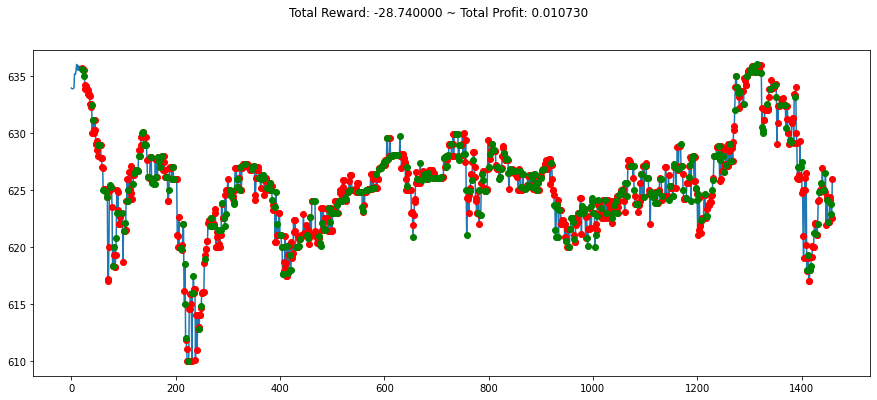

info {'total_reward': 32.34999999999957, 'total_profit': 0.0151256884383963, 'position': 0}


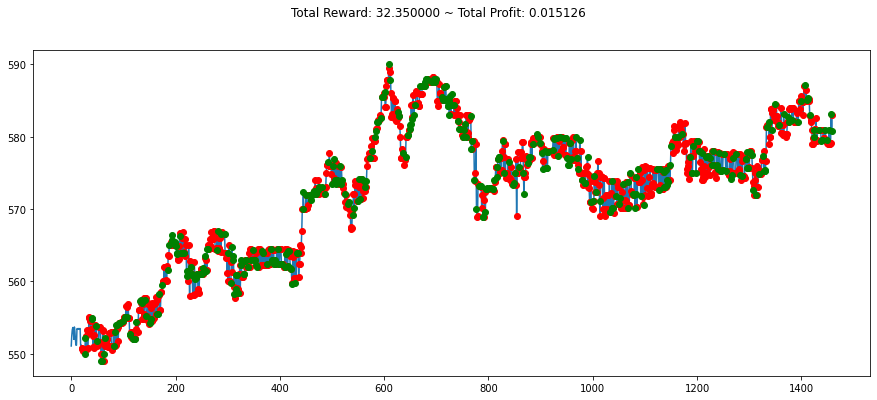

info {'total_reward': -13.039999999999338, 'total_profit': 0.01230350661178254, 'position': 0}


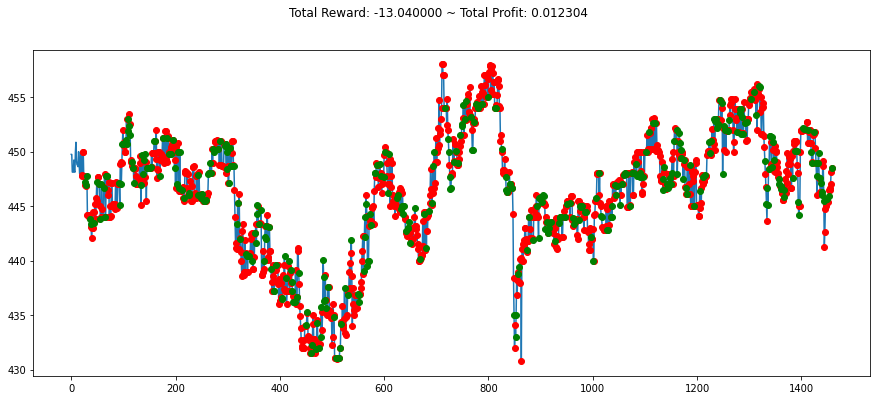

info {'total_reward': -13.9399999999996, 'total_profit': 0.013975115502779486, 'position': 0}


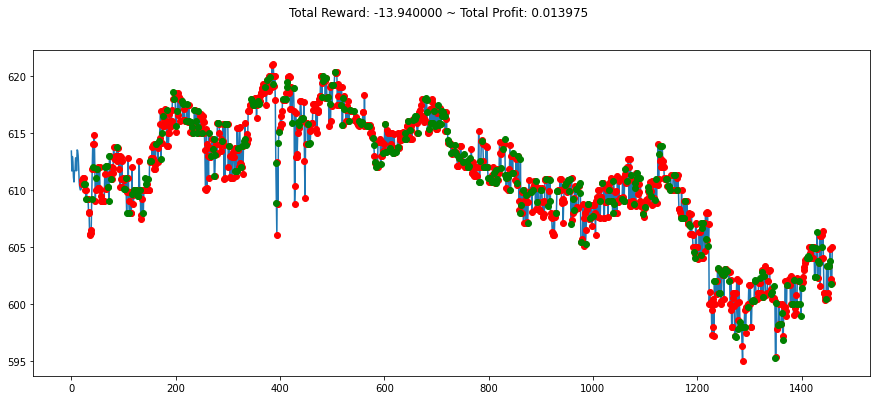

info {'total_reward': 37.89000000000101, 'total_profit': 0.011242690636126365, 'position': 0}


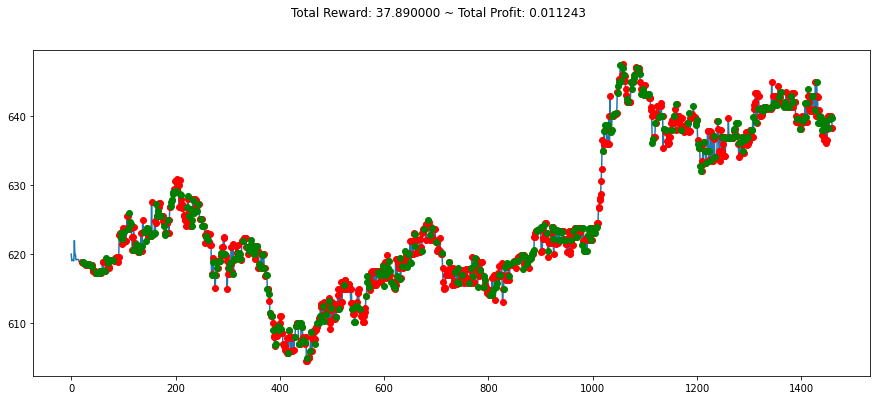

info {'total_reward': -6.69999999999925, 'total_profit': 0.015483330326607916, 'position': 0}


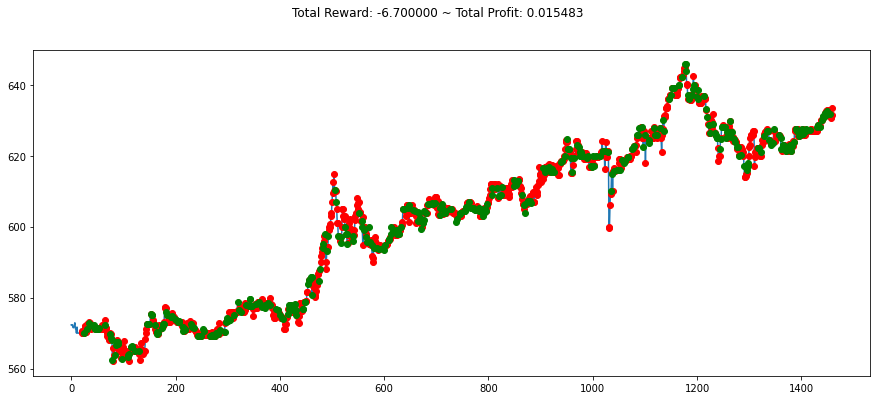

info {'total_reward': 2.3200000000001637, 'total_profit': 0.017185962069747693, 'position': 0}


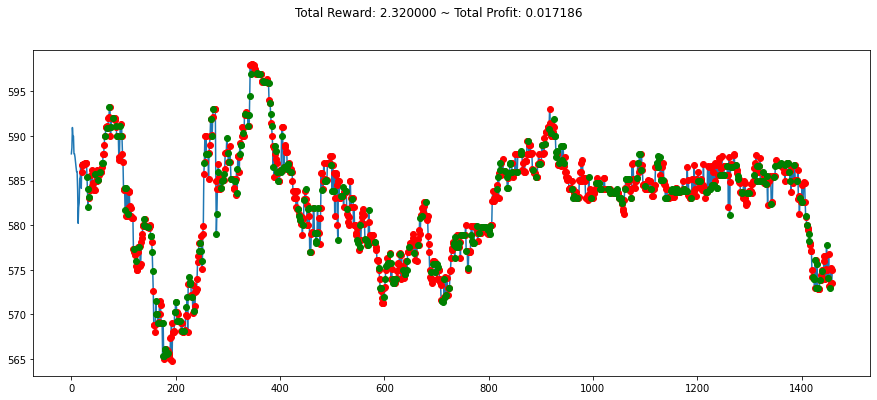

info {'total_reward': -2.930000000000291, 'total_profit': 0.012805134396123897, 'position': 0}


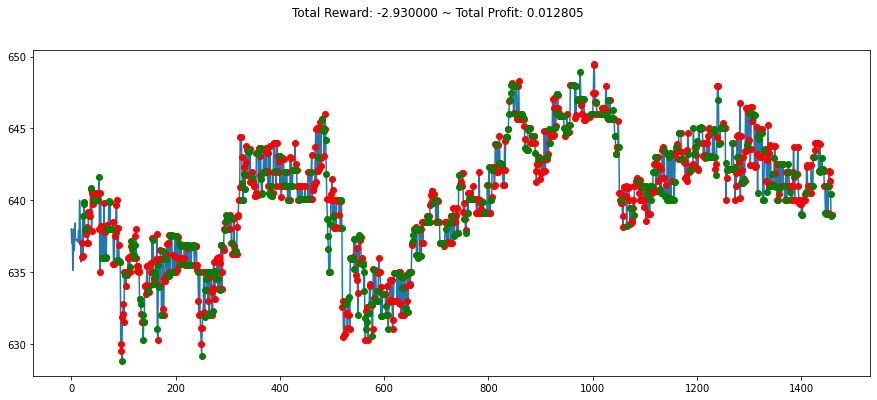

info {'total_reward': -11.750000000000682, 'total_profit': 0.01754921427590818, 'position': 0}


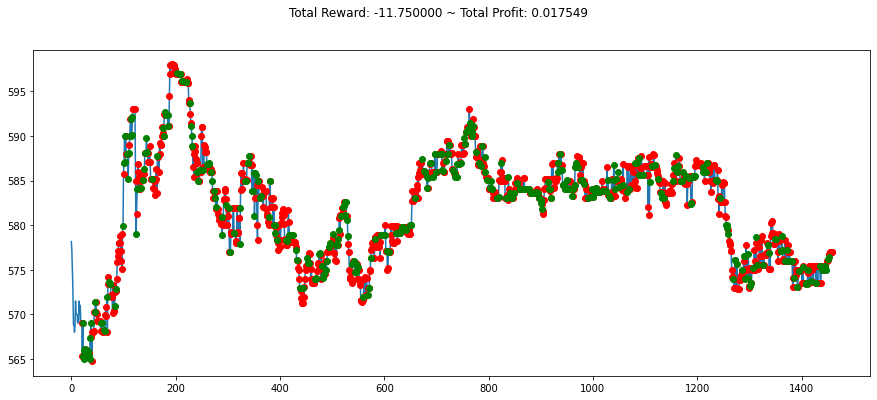

info {'total_reward': -0.4200000000009254, 'total_profit': 0.016361296808657336, 'position': 0}


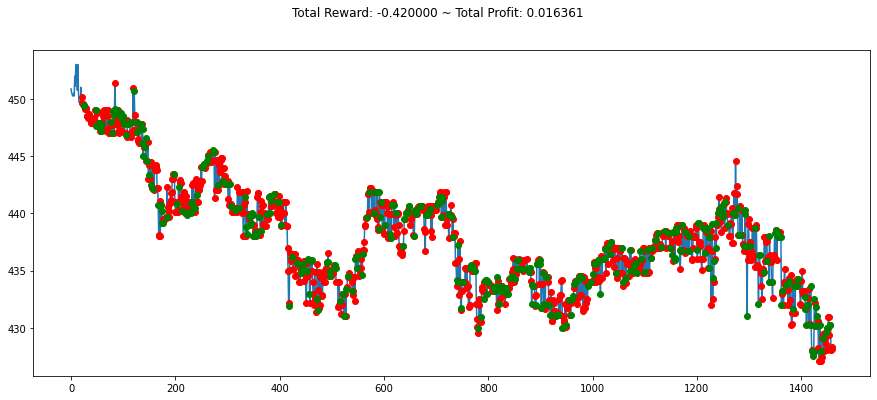

info {'total_reward': -5.0600000000006276, 'total_profit': 0.013366171727469046, 'position': 1}


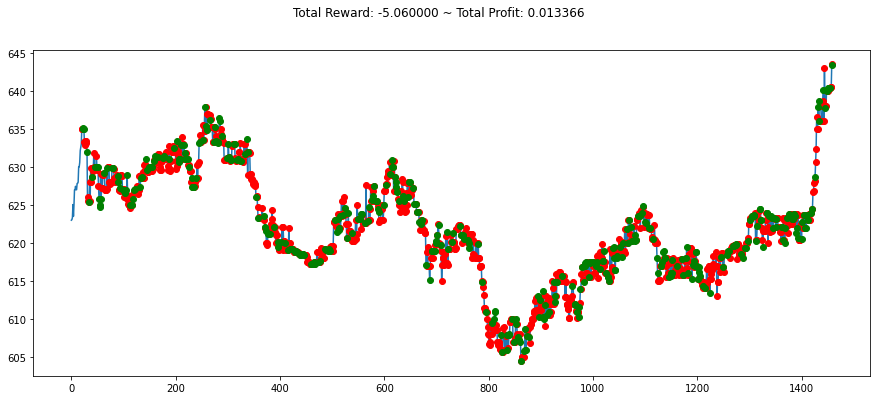

info {'total_reward': -60.910000000000196, 'total_profit': 0.014425410032719292, 'position': 0}


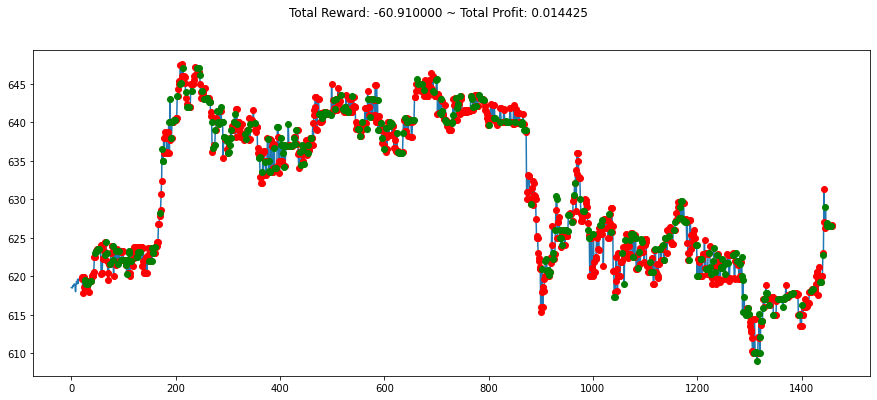

info {'total_reward': -52.52000000000089, 'total_profit': 0.0129613921152736, 'position': 0}


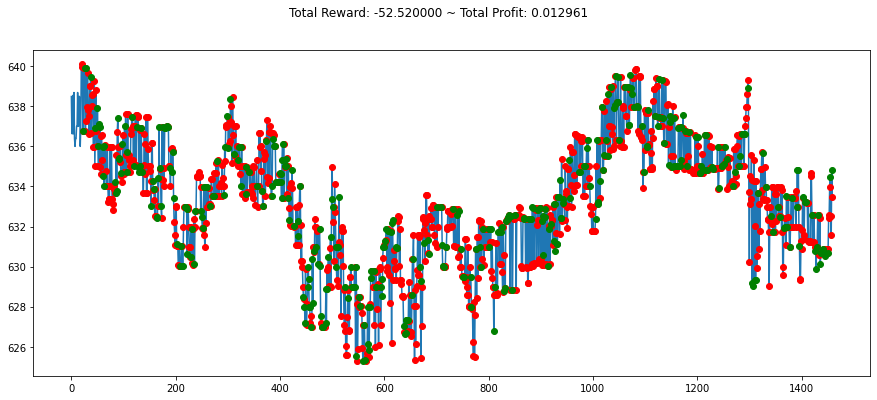

info {'total_reward': 2.129999999999825, 'total_profit': 0.012532615158919425, 'position': 0}


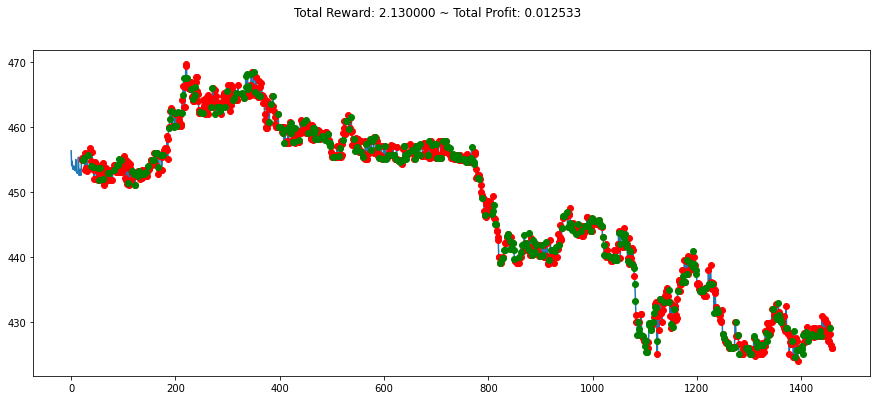

info {'total_reward': 27.939999999999827, 'total_profit': 0.011991426593191593, 'position': 0}


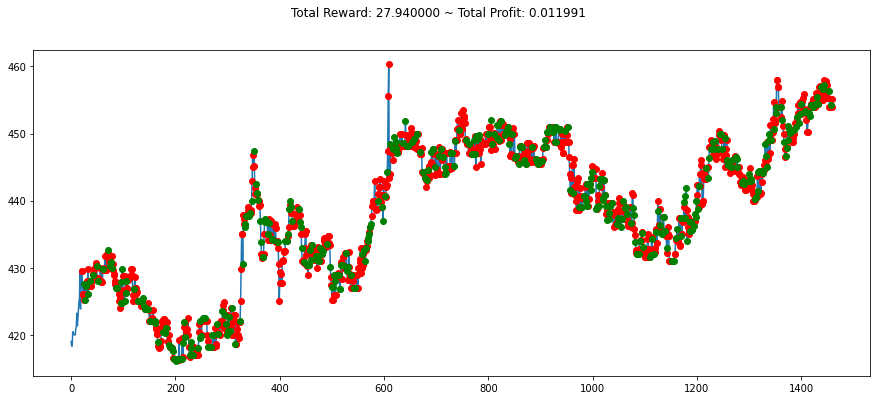

info {'total_reward': -40.970000000000255, 'total_profit': 0.013610170517447645, 'position': 1}


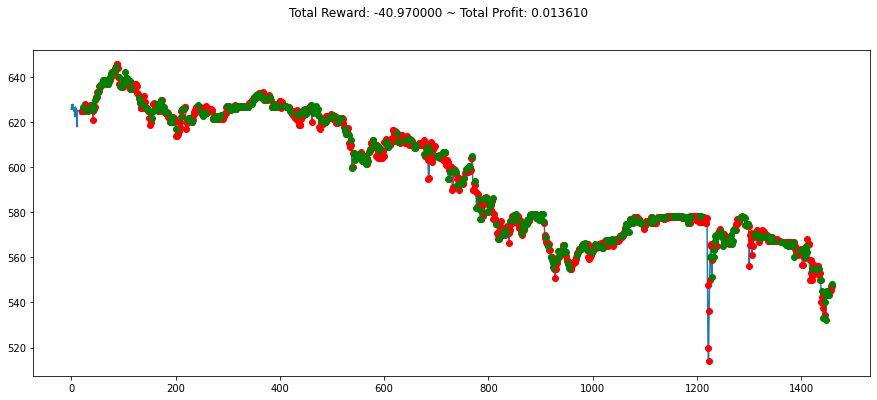

info {'total_reward': 9.430000000000973, 'total_profit': 0.010097615916787182, 'position': 0}


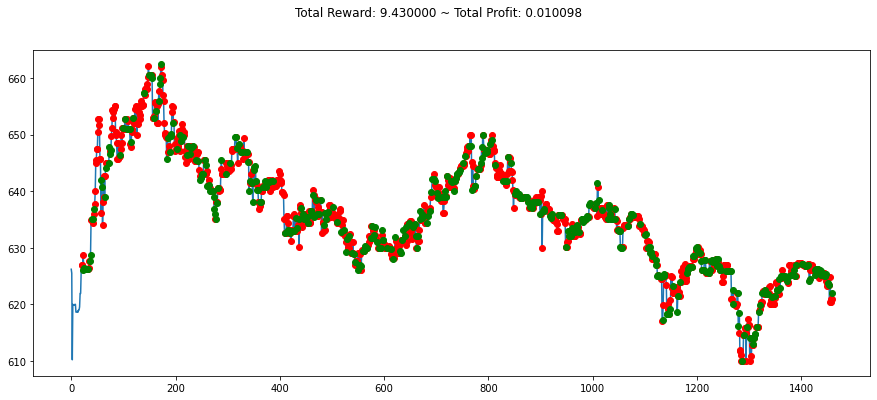

info {'total_reward': -42.28000000000014, 'total_profit': 0.010780827060093017, 'position': 0}


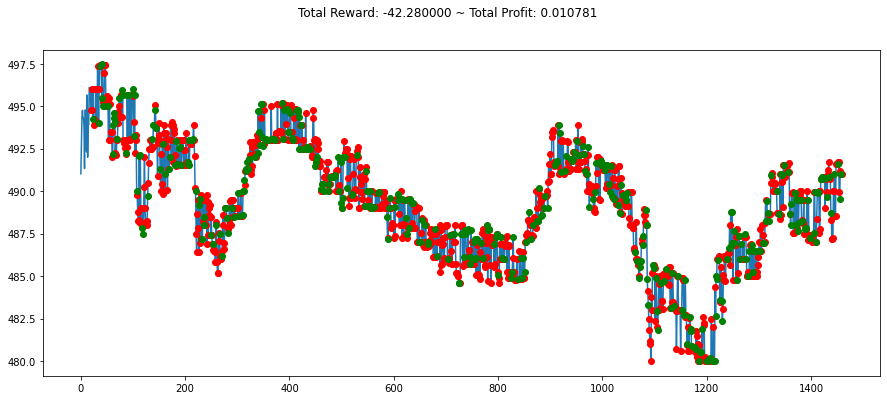

info {'total_reward': -6.570000000000107, 'total_profit': 0.010735928049557007, 'position': 1}


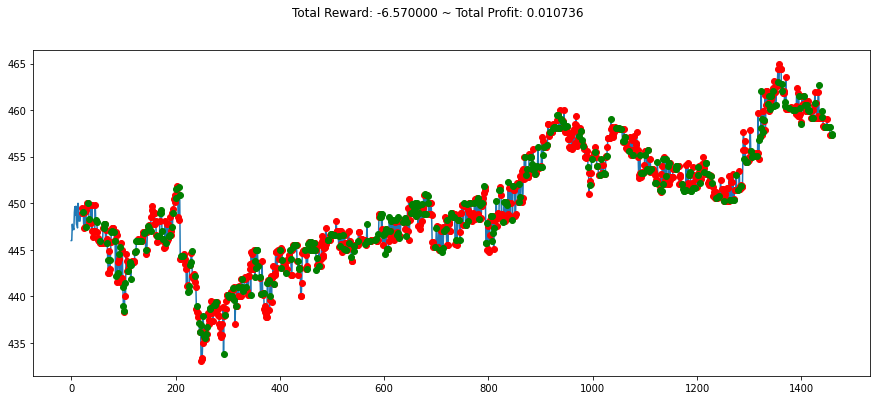

info {'total_reward': 1.3599999999999, 'total_profit': 0.009395889384391572, 'position': 0}


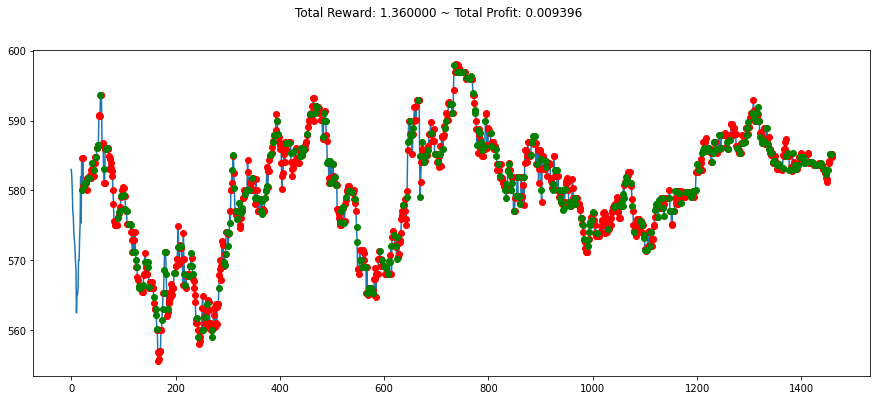

info {'total_reward': -28.56999999999954, 'total_profit': 0.015340336034177398, 'position': 0}


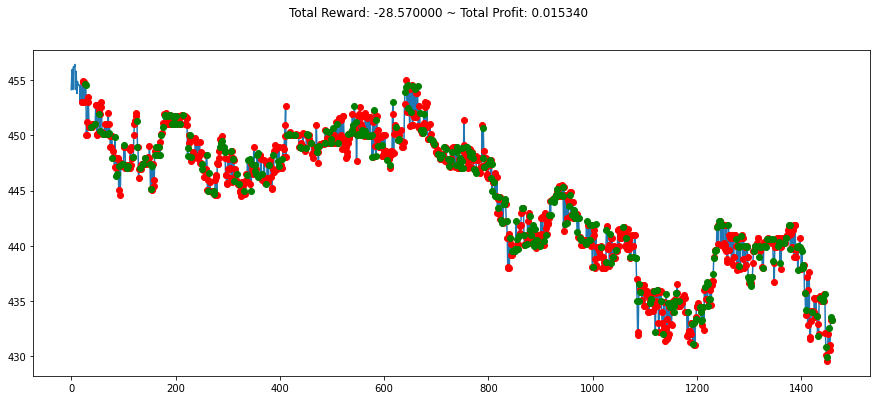

info {'total_reward': 20.41000000000031, 'total_profit': 0.014892707855062528, 'position': 1}


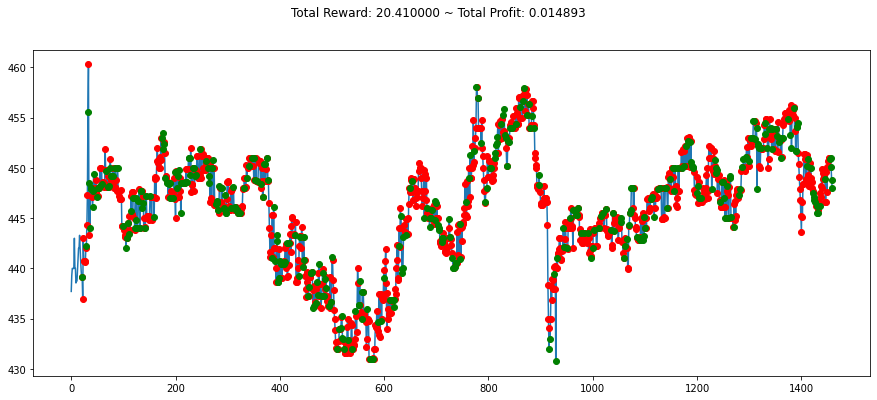

info {'total_reward': -0.22000000000048203, 'total_profit': 0.01041249502253236, 'position': 0}


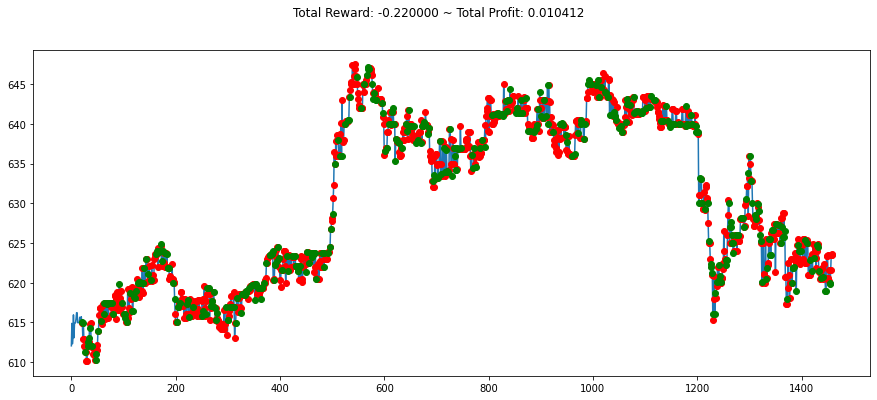

Price Only: A2C Model 30-random-days Average Profit: 0.013212677069044157 %


In [80]:
import os
import random

score_model_priceonly_timeseries_A2C=[]
for i in days_num:
    env_price_timeseries_A2C= MyCustomTimeSeries_A2C(df=stock, window_size=20, frame_bound=(i,i+1440))
    obs=env_price_timeseries_A2C.reset()
    while True:
        obs=obs[np.newaxis,...]
        action,_states=model_price_timeseries_A2C.predict(obs)
        obs,rewards, done, info=env_price_timeseries_A2C.step(action)
        if done:
            print("info",info)
            score_model_priceonly_timeseries_A2C.append(info['total_profit'])
            break
    plt.figure(figsize=(15,6))
    plt.cla()
    env_price_timeseries_A2C.render_all()
    plt.show()

print("Price Only: A2C Model 30-random-days Average Profit: "+str(mean(score_model_priceonly_timeseries_A2C))+" %")

## Time Series: Diff, Volume, Volume_(currency), RSI, MACD Using PPO

In [81]:
stock.diff=stock.Low.diff()[1:]
stock['Diff']=pd.Series(pd.to_numeric(df.diff))
#test_trend(df.diff[-10000:])
stock1=stock.iloc[2800000:]


stock1

,Timestamp,Open,High,Low,Close,Volume,Volume_(currency),Weighted_price,Rsi,Obv,Ssma,Macd,Macds,Macdh,Diff
4498449,1595613180,9565.43,9570.19,9565.43,9570.19,2.085241,19948.145740,9566.348863,59.597770,-535723.490983,9565.216437,1.875107,2.112737,-0.237630,2.72
4498450,1595613240,9564.26,9566.31,9564.26,9566.31,0.741686,7094.852975,9565.842736,53.299107,-535724.232669,9565.337944,1.770470,2.044284,-0.273814,-1.17
4498451,1595613300,9566.58,9571.44,9564.01,9571.44,0.676690,6473.553317,9566.495986,59.407592,-535723.555979,9566.015950,2.077543,2.050936,0.026608,-0.25
4498452,1595613360,9571.42,9572.19,9566.70,9572.19,1.778856,17022.337453,9569.262082,60.226676,-535721.777123,9566.701955,2.354281,2.111605,0.242676,2.69
4498453,1595613420,9569.53,9572.24,9569.53,9572.24,0.382782,3664.053017,9572.157445,60.284212,-535721.394341,9567.317294,2.548258,2.198935,0.349323,2.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4857372,1617148560,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339,51.857139,-537590.424692,58678.534962,8.582967,1.350172,7.232794,-28.31
4857373,1617148620,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508,51.826141,-537597.719540,58679.343299,7.908077,2.661753,5.246324,-2.03
4857374,1617148680,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496,57.324721,-537596.013857,58684.287377,10.322930,4.193989,6.128941,9.46
4857375,1617148740,58742.18,58770.38,58742.18,58760.59,0.720415,42332.958633,58761.866202,61.855629,-537595.293442,58692.765446,15.028892,6.360969,8.667923,48.75


In [82]:
def add_signals(env):
    start = env.frame_bound[0] - env.window_size
    end = env.frame_bound[1]
    prices = env.df.loc[:, 'Low'].to_numpy()[start:end]
    signal_features = env.df.loc[:, ['Volume','Volume_(currency)', 'Rsi','Macd','Diff']].to_numpy()[start:end]
    return prices, signal_features
class MyCustomTimeSeries_noprice(StocksEnv):
    _process_data = add_signals
from stable_baselines3 import PPO
env_noprice_timeseries= MyCustomTimeSeries_noprice(df=stock1, window_size=20, frame_bound=(20,int(len(df)*0.8)))
env_maker = lambda: env_noprice_timeseries
env = DummyVecEnv([env_maker])
model_noprice_timeseries = PPO("MlpPolicy", env, verbose=1,tensorboard_log="/Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_noprice_timeseries_PPO")
model_noprice_timeseries.learn(total_timesteps=10000)
#model_noprice_timeseries.save("/Users/danies/Desktop/projects/RLBitcoin/model_noprice_timeseries_PPO")

Using cpu device
Logging to /Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_noprice_timeseries_PPO/PPO_4
-----------------------------
| time/              |      |
|    fps             | 1868 |
|    iterations      | 1    |
|    time_elapsed    | 1    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1189         |
|    iterations           | 2            |
|    time_elapsed         | 3            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0064100744 |
|    clip_fraction        | 0.0153       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.691       |
|    explained_variance   | -0.00724     |
|    learning_rate        | 0.0003       |
|    loss                 | 29.5         |
|    n_updates            | 10           |
|    policy_gradient_loss | -

info {'total_reward': 2011.2999999999229, 'total_profit': 0.005654283048358841, 'position': 0}


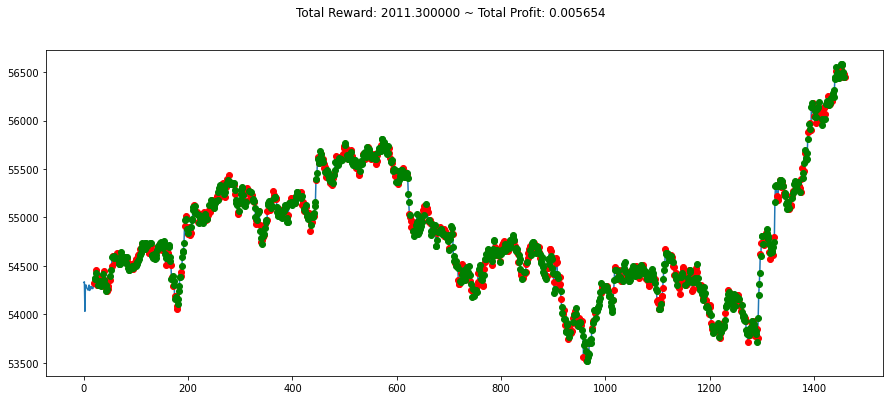

info {'total_reward': -3220.4000000000888, 'total_profit': 0.005926210309564156, 'position': 0}


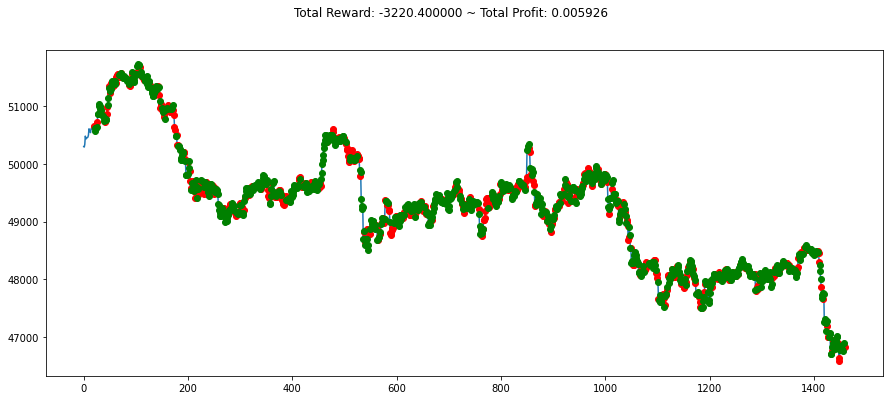

info {'total_reward': 297.18000000004395, 'total_profit': 0.005944697536238894, 'position': 0}


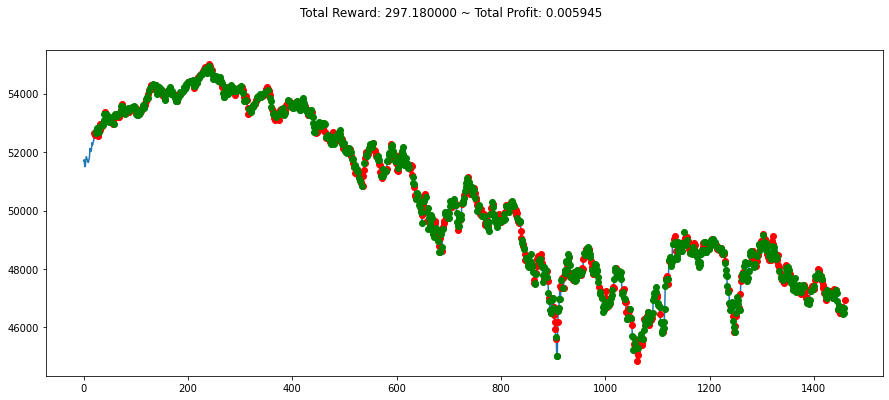

info {'total_reward': -741.229999999945, 'total_profit': 0.005379693035321916, 'position': 0}


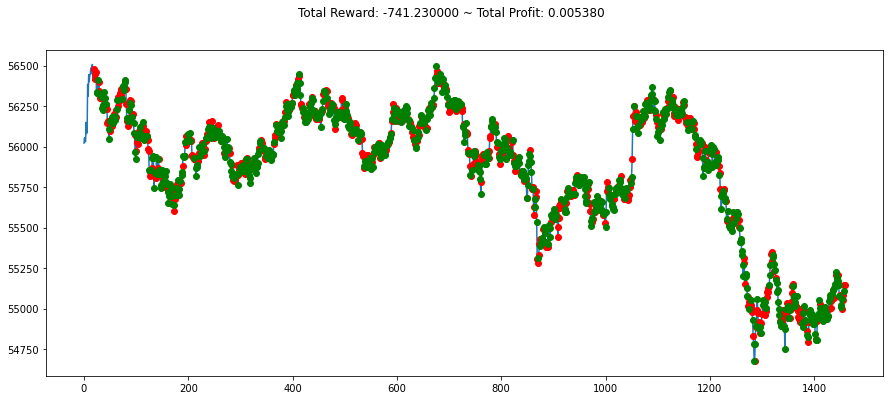

info {'total_reward': 2666.6199999999953, 'total_profit': 0.005505311116617371, 'position': 1}


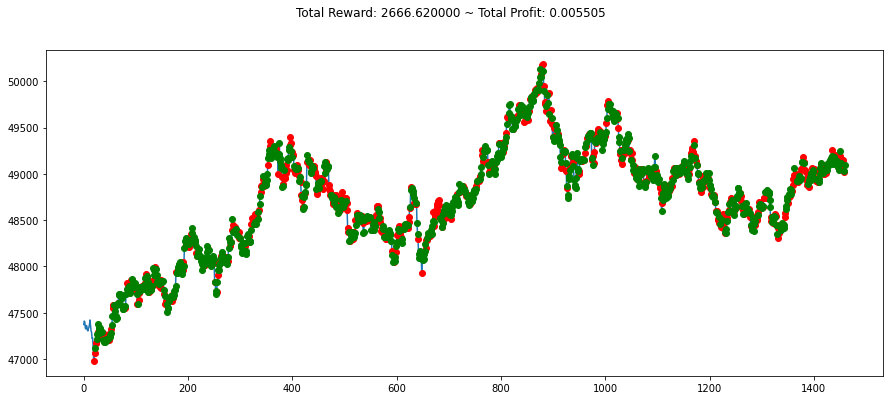

info {'total_reward': -1041.2199999999793, 'total_profit': 0.00670460161542429, 'position': 0}


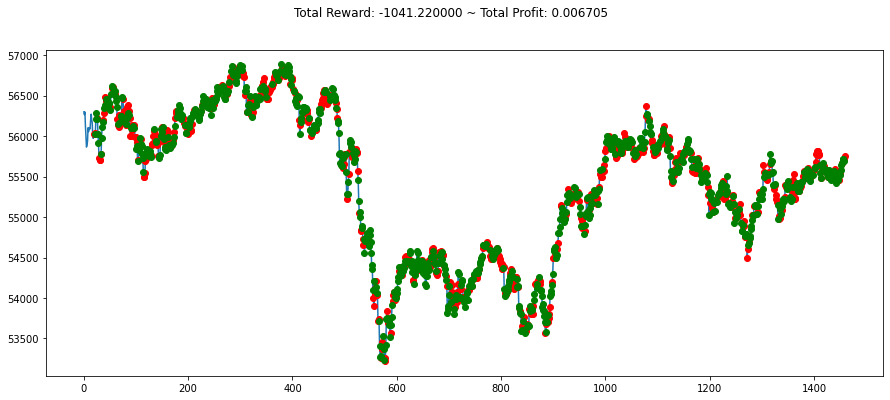

info {'total_reward': -3645.049999999981, 'total_profit': 0.004764090043735832, 'position': 0}


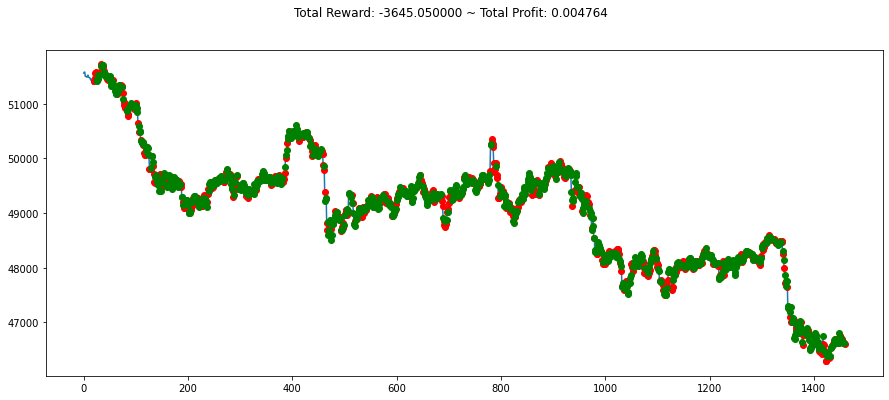

info {'total_reward': -939.8299999999363, 'total_profit': 0.0048872384076789665, 'position': 1}


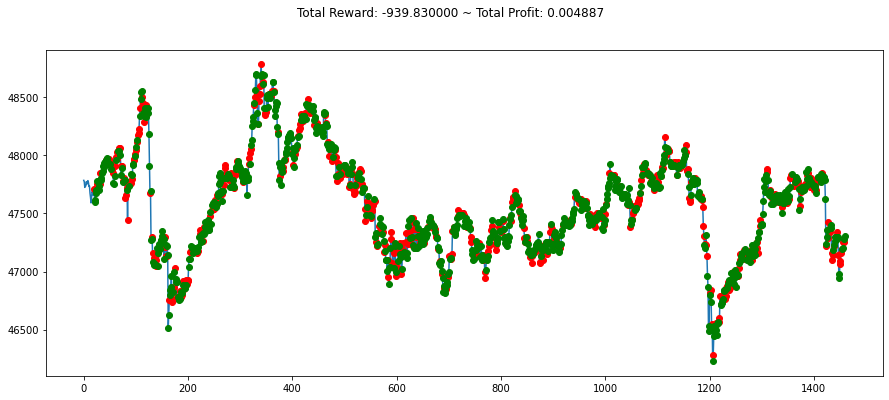

info {'total_reward': 1295.4400000000242, 'total_profit': 0.003673385905408962, 'position': 0}


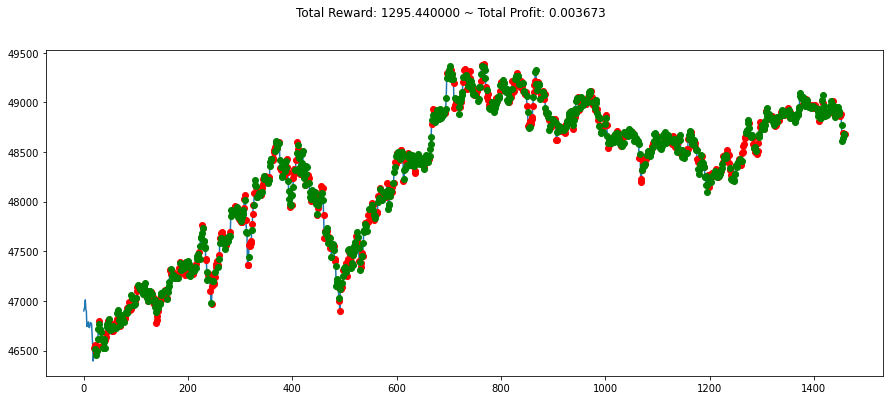

info {'total_reward': 2218.9799999999304, 'total_profit': 0.0040034689377240395, 'position': 1}


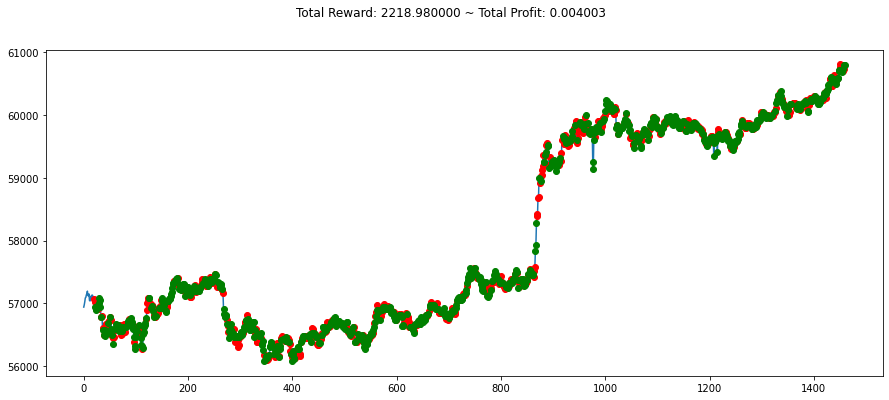

info {'total_reward': -388.37000000001717, 'total_profit': 0.00583347227678503, 'position': 1}


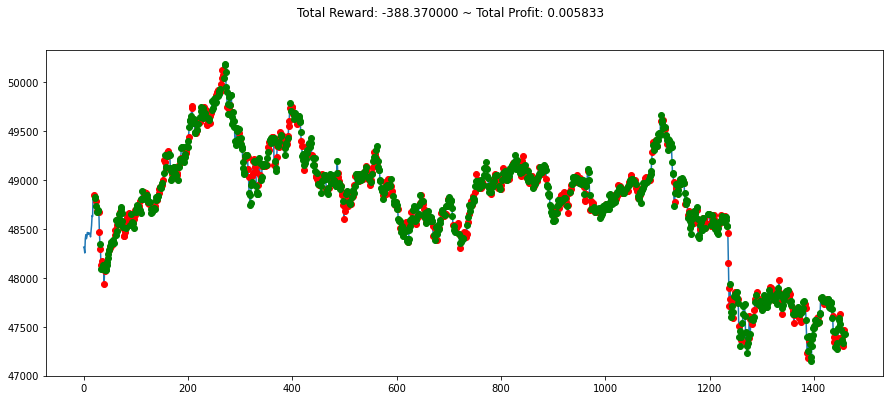

info {'total_reward': 1496.6800000000294, 'total_profit': 0.005965304213788024, 'position': 0}


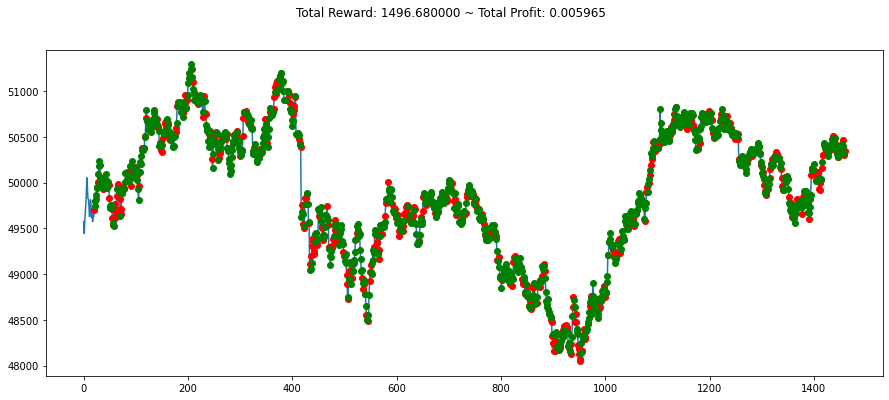

info {'total_reward': -2802.3600000000006, 'total_profit': 0.005626657258059708, 'position': 0}


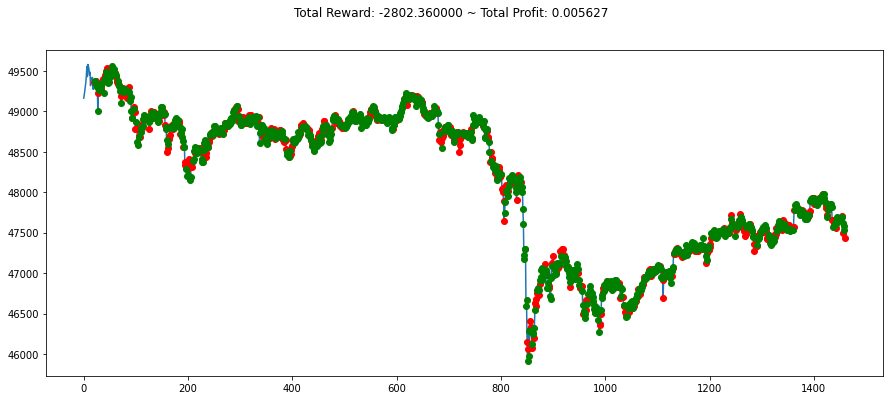

info {'total_reward': -1548.2500000000582, 'total_profit': 0.005374290796191641, 'position': 1}


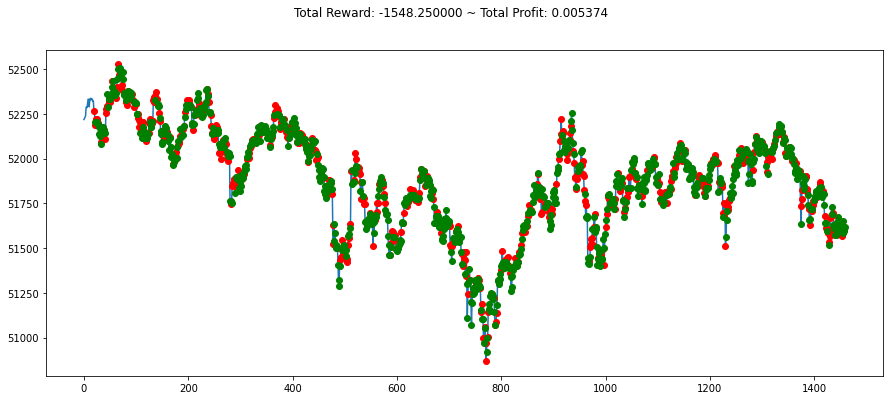

info {'total_reward': -801.9500000000698, 'total_profit': 0.003965981329741237, 'position': 1}


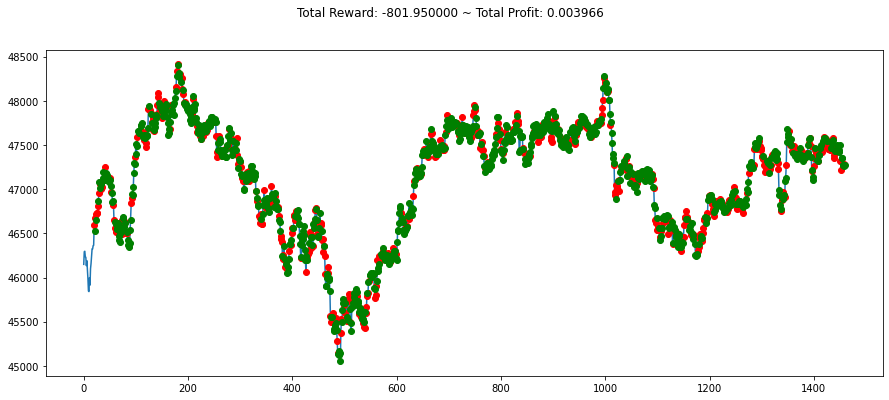

info {'total_reward': -254.38999999995576, 'total_profit': 0.004180382291526988, 'position': 1}


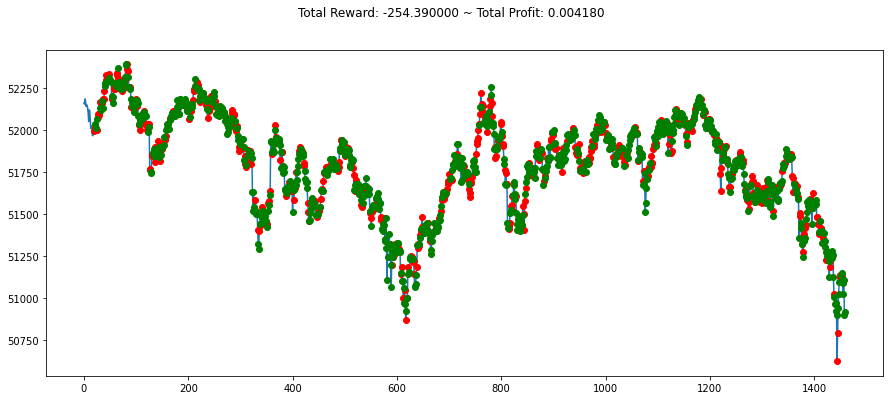

info {'total_reward': 364.90000000000873, 'total_profit': 0.005092222092126563, 'position': 1}


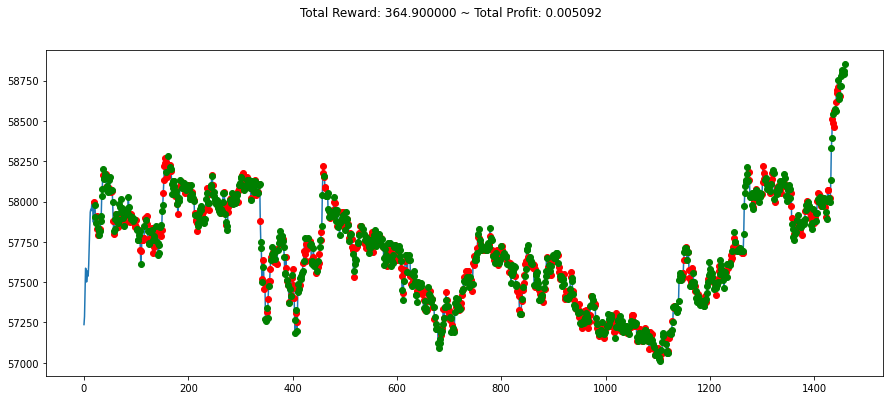

info {'total_reward': -1377.4800000000469, 'total_profit': 0.006183711278891465, 'position': 1}


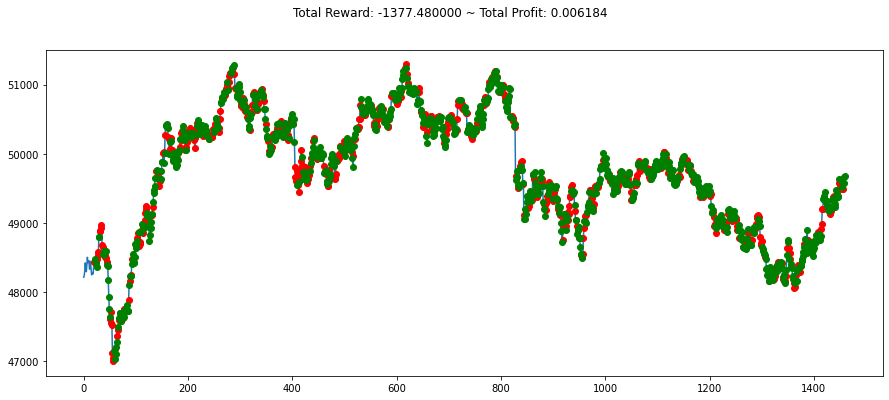

info {'total_reward': -1227.349999999955, 'total_profit': 0.005393863140324176, 'position': 1}


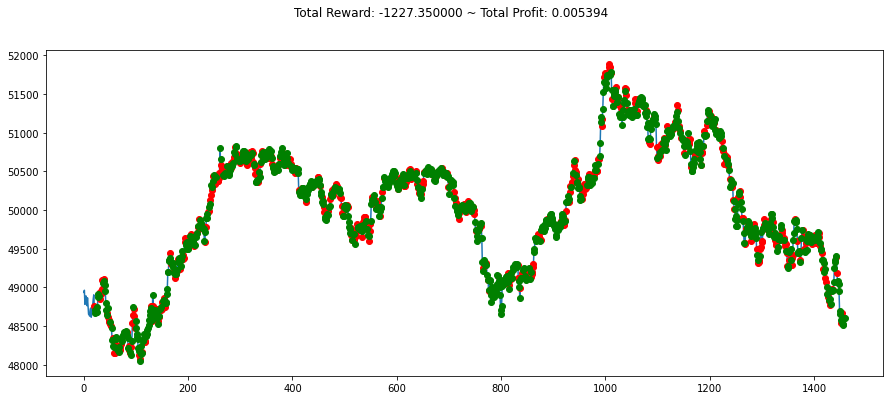

info {'total_reward': -2131.8800000000483, 'total_profit': 0.0057823684989045466, 'position': 1}


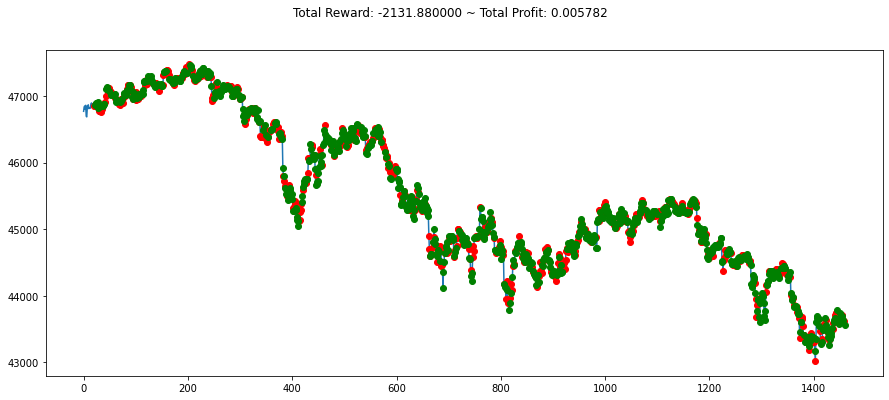

info {'total_reward': 1133.1199999999662, 'total_profit': 0.005166719856806007, 'position': 1}


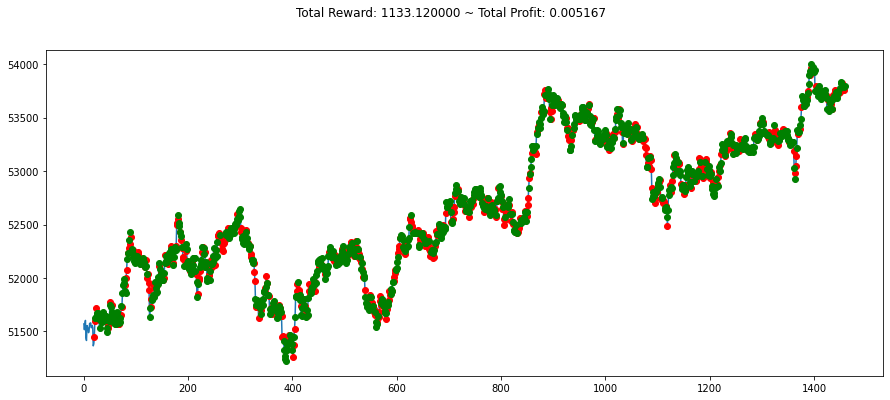

info {'total_reward': -985.4999999999854, 'total_profit': 0.005530638043033407, 'position': 1}


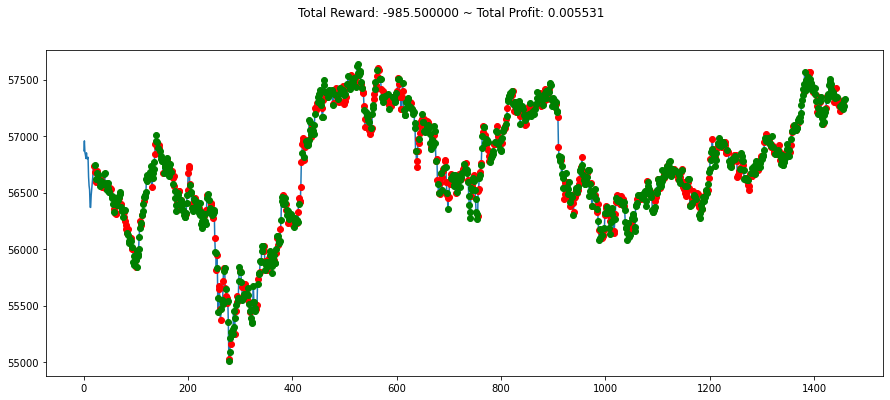

info {'total_reward': -685.3699999999371, 'total_profit': 0.0046226674592441935, 'position': 0}


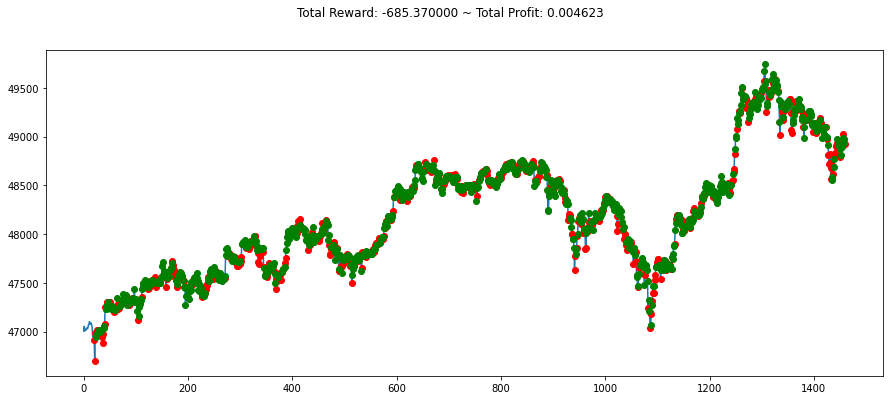

info {'total_reward': 1950.0199999999822, 'total_profit': 0.0048168191820328774, 'position': 0}


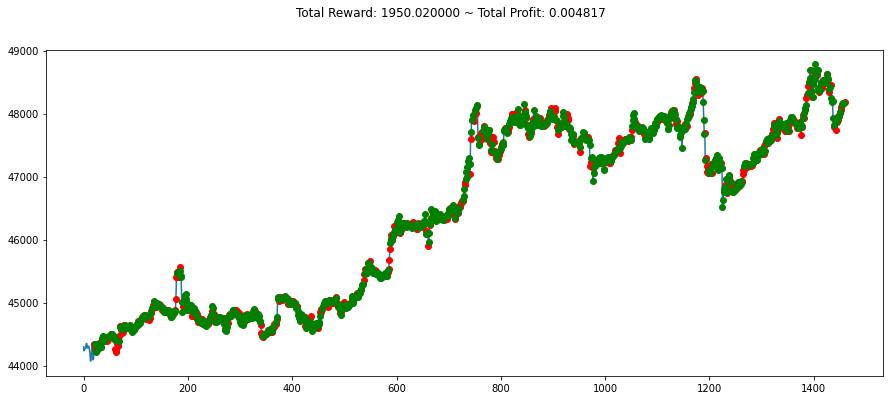

info {'total_reward': 972.4500000000626, 'total_profit': 0.0060835216802430595, 'position': 1}


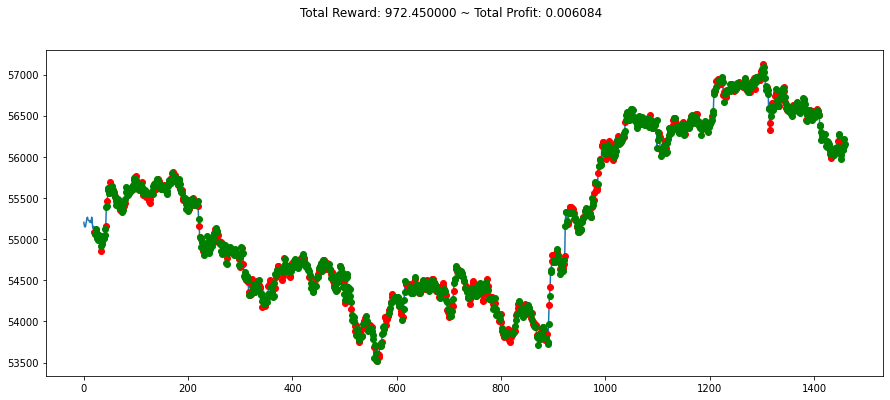

info {'total_reward': -291.8999999999869, 'total_profit': 0.004807697527052726, 'position': 0}


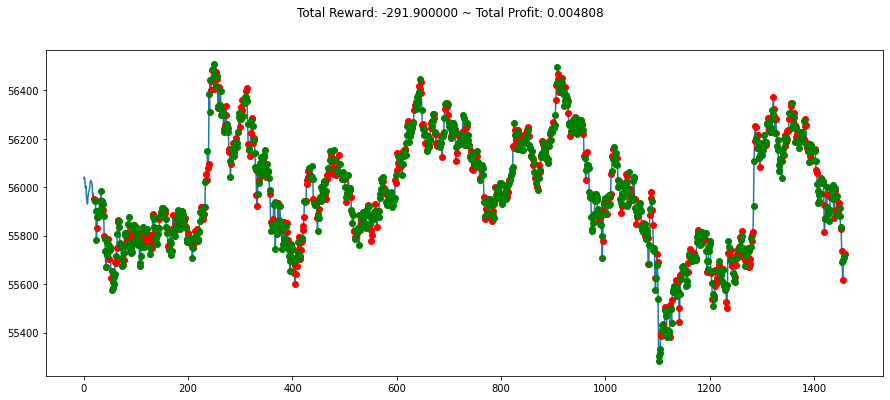

info {'total_reward': 1949.899999999936, 'total_profit': 0.005835461065028214, 'position': 1}


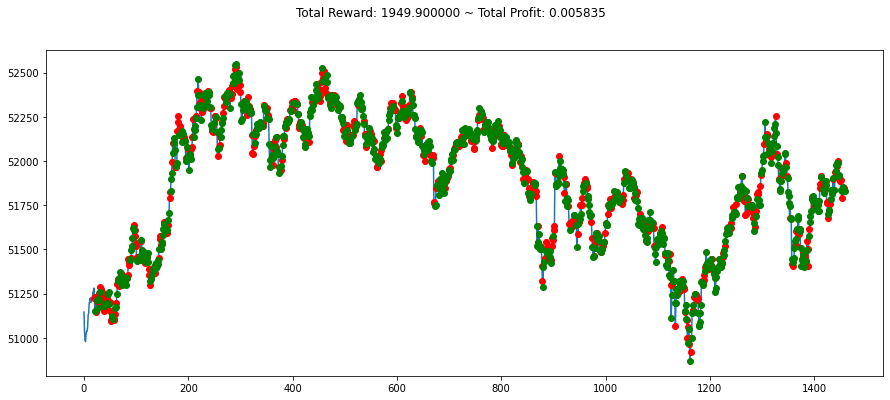

info {'total_reward': 1662.21000000013, 'total_profit': 0.004479302015874707, 'position': 0}


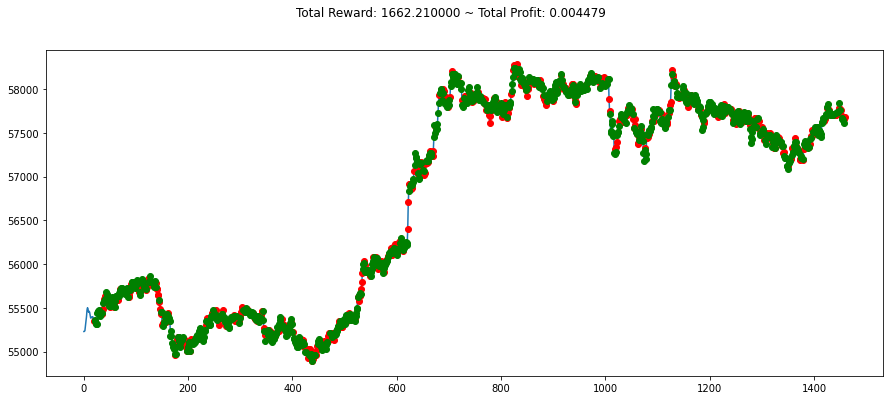

info {'total_reward': 3107.5999999999985, 'total_profit': 0.005505373313324399, 'position': 1}


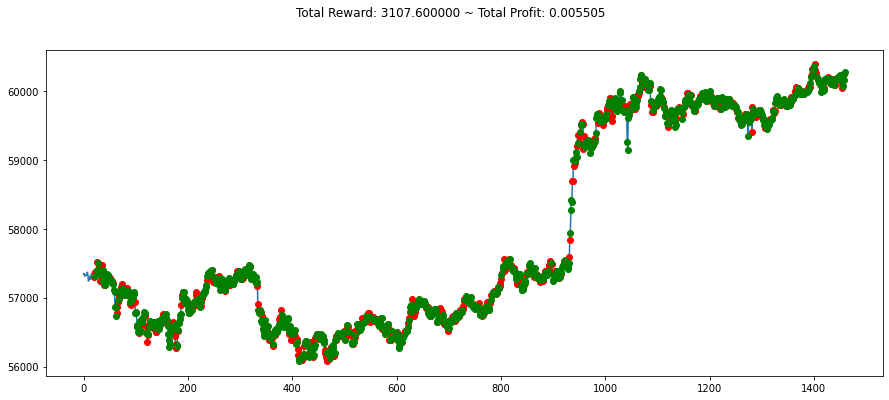

info {'total_reward': 1502.809999999954, 'total_profit': 0.005535525610397711, 'position': 1}


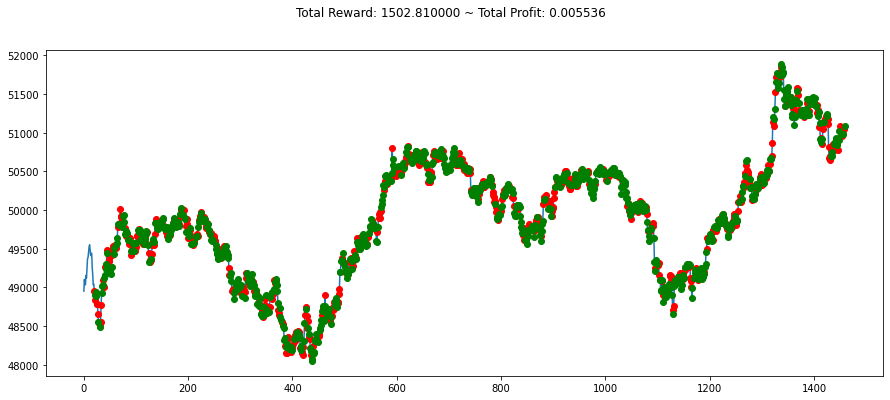

Volume,Volume_(currency), Rsi, Macd: PPO Model 30-random-days Average Profit: 0.005274165296181665 %


In [83]:
import os
import random

score_model_timeseries_noprice_PPO=[]
for i in days_num:
    env_noprice_timeseries= MyCustomTimeSeries_noprice(df=stock1, window_size=20, frame_bound=(i,i+1440))
    obs=env_noprice_timeseries.reset()
    while True:
        obs=obs[np.newaxis,...]
        action,_states=model_noprice_timeseries.predict(obs)
        obs,rewards, done, info=env_noprice_timeseries.step(action)
        if done:
            print("info",info)
            score_model_timeseries_noprice_PPO.append(info['total_profit'])
            break
    plt.figure(figsize=(15,6))
    plt.cla()
    env_noprice_timeseries.render_all()
    plt.show()

print("Volume,Volume_(currency), Rsi, Macd: PPO Model 30-random-days Average Profit: "+str(mean(score_model_timeseries_noprice_PPO))+" %")

## Time Series: Diff, Volume, Volume_(currency), RSI, MACD Using A2C


In [84]:
def add_signals(env):
    start = env.frame_bound[0] - env.window_size
    end = env.frame_bound[1]
    prices = env.df.loc[:, 'Low'].to_numpy()[start:end]
    signal_features = env.df.loc[:, ['Diff','Volume','Volume_(currency)', 'Rsi','Macds']].to_numpy()[start:end]
    return prices, signal_features
class MyCustomTimeSeries_noprice(StocksEnv):
    _process_data = add_signals
from stable_baselines3 import PPO
env_noprice_timeseries= MyCustomTimeSeries_noprice(df=stock1, window_size=20, frame_bound=(20,int(len(df)*0.8)))
env_maker = lambda: env_noprice_timeseries
env = DummyVecEnv([env_maker])
model_noprice_timeseries_A2C = A2C("MlpPolicy", env, verbose=1,tensorboard_log="/Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_noprice_timeseries_A2C")
model_noprice_timeseries_A2C.learn(total_timesteps=10000)
#model_noprice_timeseries_A2C.save("/Users/danies/Desktop/projects/RLBitcoin/model_noprice_timeseries_A2C")

Using cpu device
Logging to /Users/danies/Desktop/projects/RLBitcoin/tensorboard/model_noprice_timeseries_A2C/A2C_5
------------------------------------
| time/                 |          |
|    fps                | 864      |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -0.682   |
|    explained_variance | -212     |
|    learning_rate      | 0.0007   |
|    n_updates          | 99       |
|    policy_loss        | -1.88    |
|    value_loss         | 6.85     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 850      |
|    iterations         | 200      |
|    time_elapsed       | 1        |
|    total_timesteps    | 1000     |
| train/                |          |
|    entropy_loss       | -0.677   |
|    explained_variance | -86.1    |
|    learning_rate      | 0.0007 

------------------------------------
| time/                 |          |
|    fps                | 816      |
|    iterations         | 1700     |
|    time_elapsed       | 10       |
|    total_timesteps    | 8500     |
| train/                |          |
|    entropy_loss       | -0.675   |
|    explained_variance | 0.0205   |
|    learning_rate      | 0.0007   |
|    n_updates          | 1699     |
|    policy_loss        | 3.68     |
|    value_loss         | 50.1     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 812      |
|    iterations         | 1800     |
|    time_elapsed       | 11       |
|    total_timesteps    | 9000     |
| train/                |          |
|    entropy_loss       | -0.655   |
|    explained_variance | 0.0685   |
|    learning_rate      | 0.0007   |
|    n_updates          | 1799     |
|    policy_loss        | 0.818    |
|    value_loss         | 2.25     |
-

info {'total_reward': 1045.1299999999246, 'total_profit': 0.004365346092202675, 'position': 0}


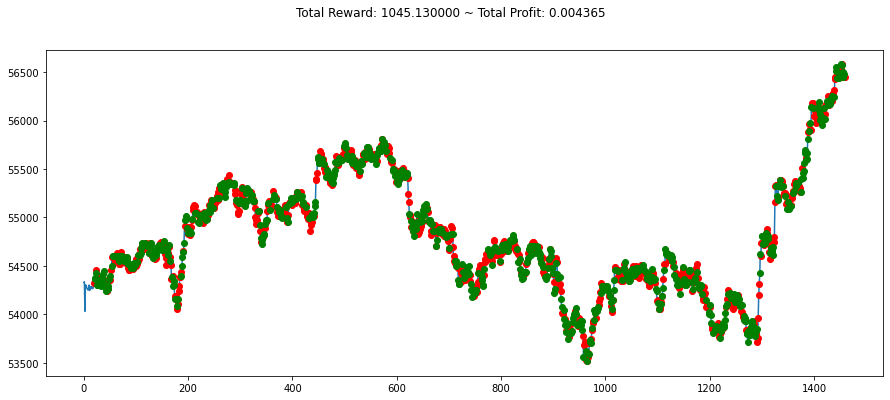

info {'total_reward': -3170.939999999937, 'total_profit': 0.005421115488192707, 'position': 1}


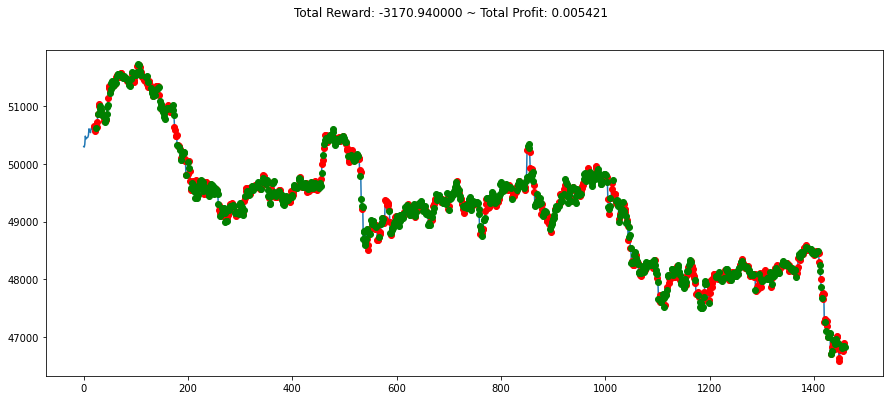

info {'total_reward': -3786.759999999944, 'total_profit': 0.003639710618108785, 'position': 1}


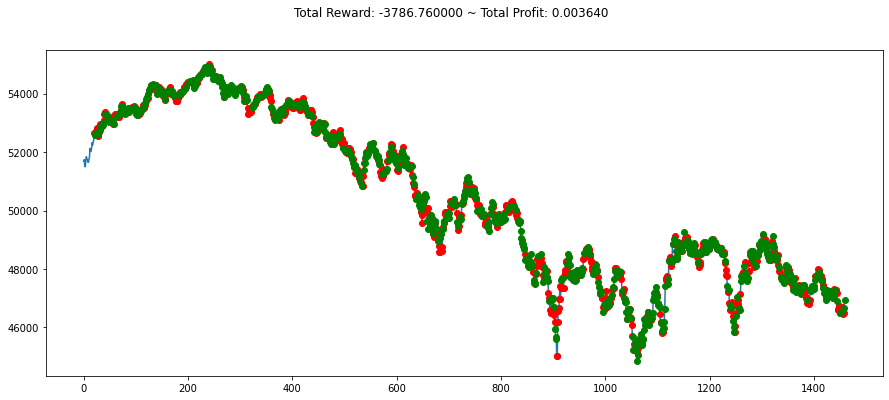

info {'total_reward': -471.7199999999648, 'total_profit': 0.0036546160460770314, 'position': 0}


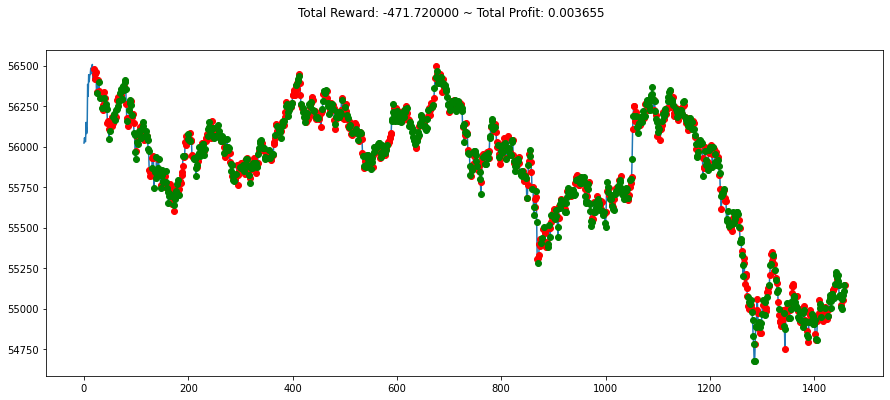

info {'total_reward': 461.0900000000256, 'total_profit': 0.004955690890795484, 'position': 0}


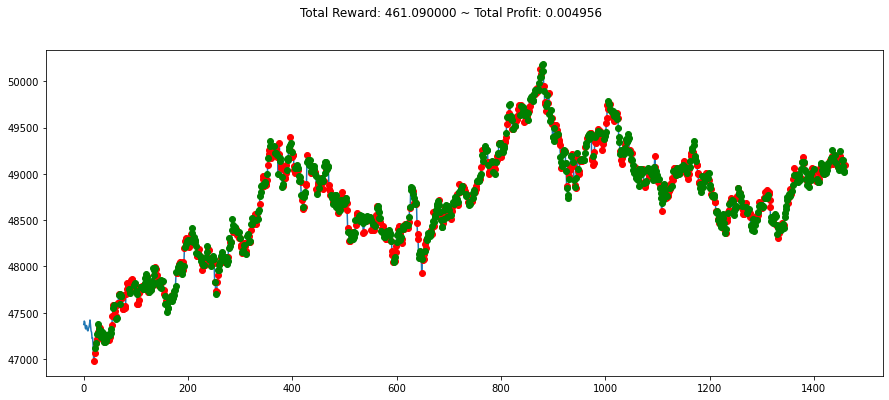

info {'total_reward': -1343.4599999999773, 'total_profit': 0.0042424942513722315, 'position': 1}


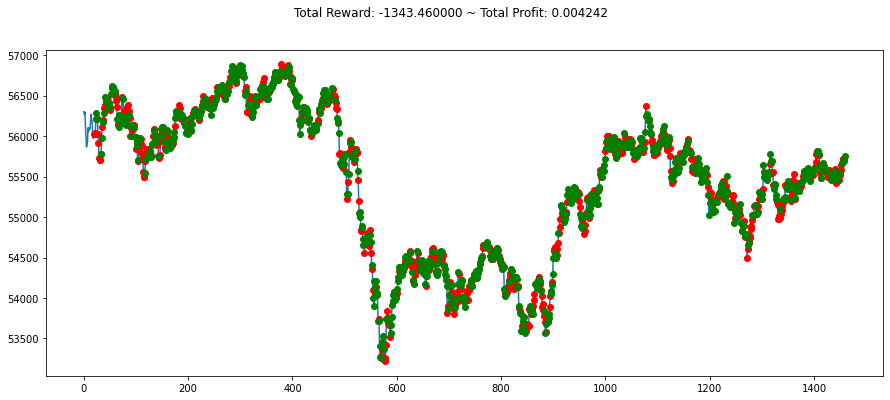

info {'total_reward': -4088.9000000000815, 'total_profit': 0.0034947142730037918, 'position': 1}


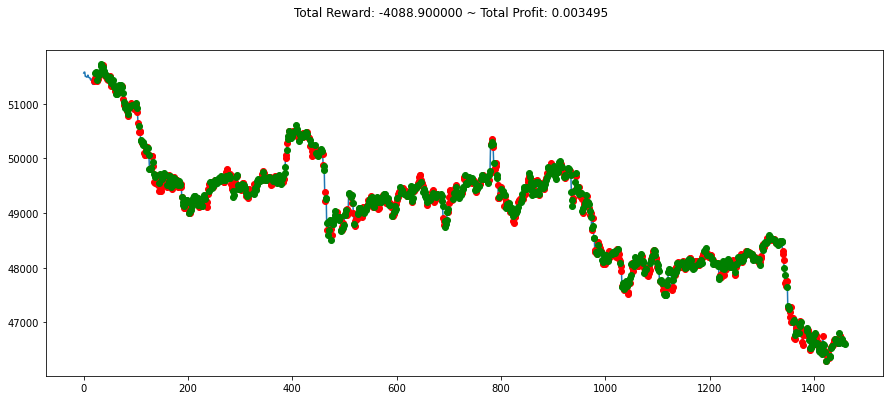

info {'total_reward': -1413.2700000001132, 'total_profit': 0.004832510484894487, 'position': 1}


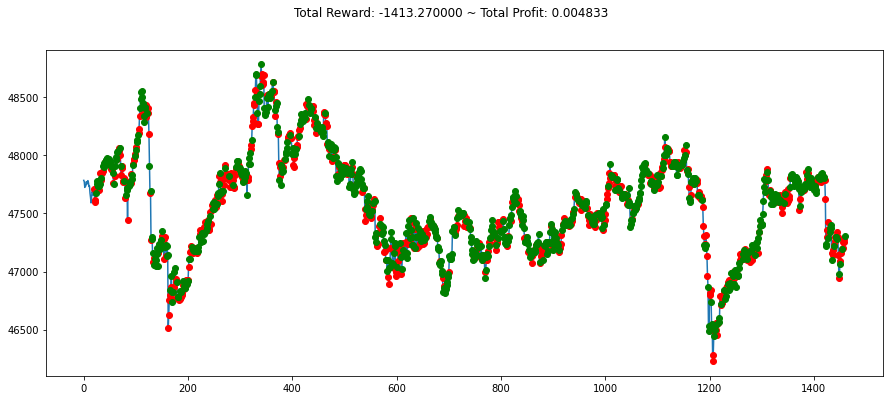

info {'total_reward': 1373.509999999922, 'total_profit': 0.004974304732639837, 'position': 1}


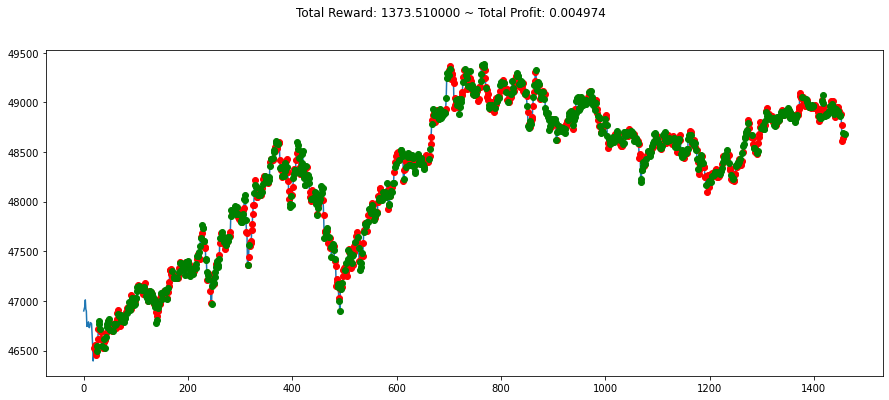

info {'total_reward': 1348.4199999999619, 'total_profit': 0.003887392229780538, 'position': 1}


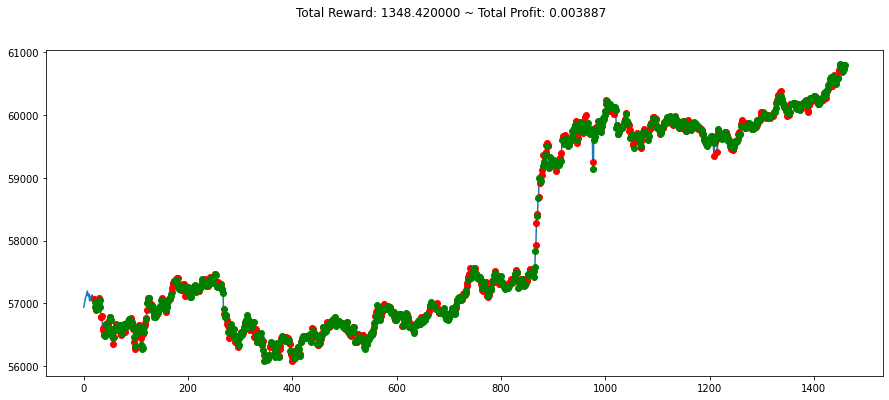

info {'total_reward': -2526.4099999999235, 'total_profit': 0.003831092625265151, 'position': 1}


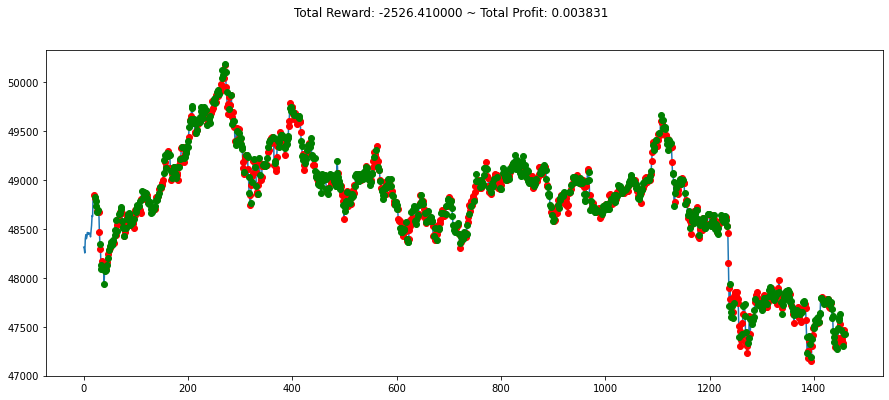

info {'total_reward': 688.4899999999834, 'total_profit': 0.004342281494654916, 'position': 1}


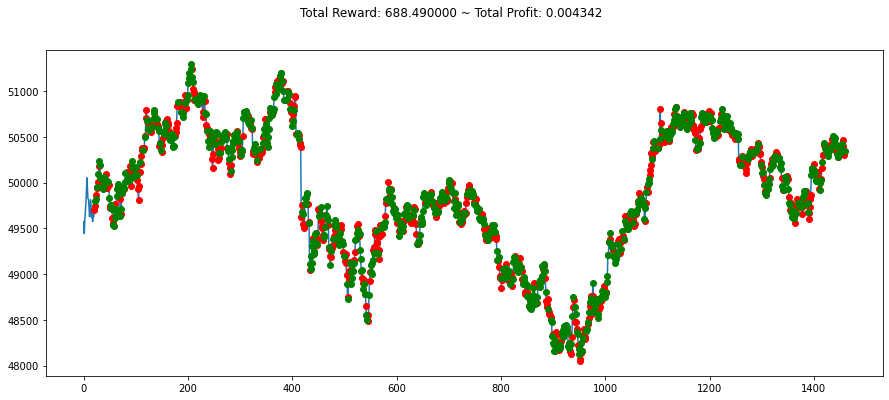

info {'total_reward': -162.04999999996653, 'total_profit': 0.0044662452795342965, 'position': 0}


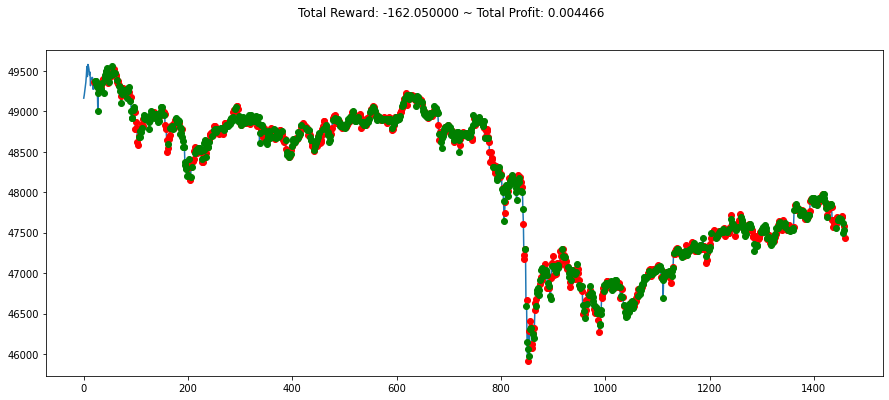

info {'total_reward': -1060.0200000000914, 'total_profit': 0.004070689258701519, 'position': 1}


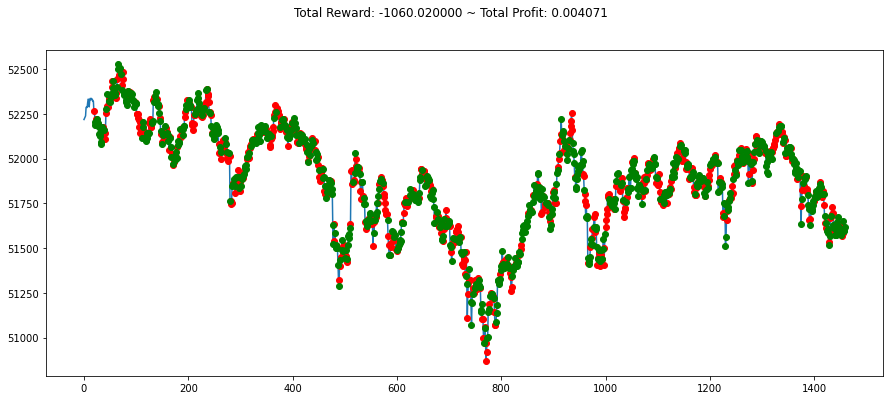

info {'total_reward': -497.70999999989, 'total_profit': 0.00471216444282037, 'position': 1}


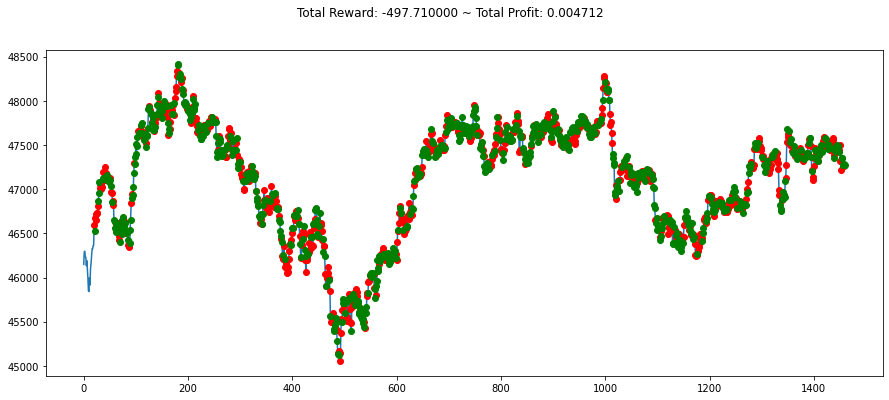

info {'total_reward': -110.65000000001601, 'total_profit': 0.004541808122905066, 'position': 1}


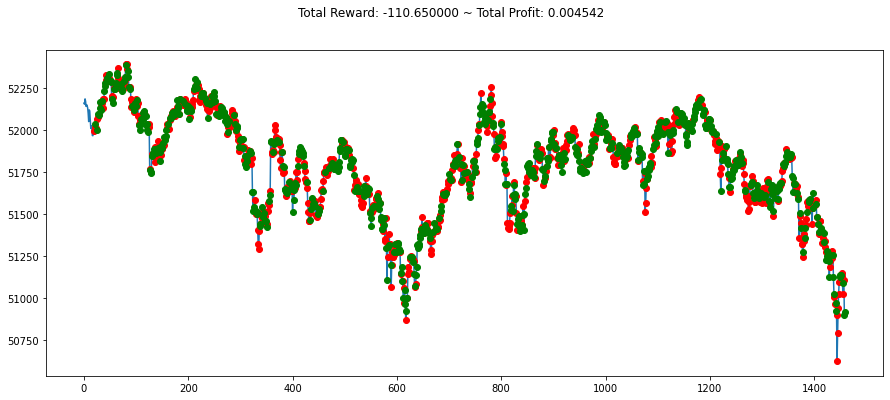

info {'total_reward': 435.5099999998856, 'total_profit': 0.006195918655587723, 'position': 1}


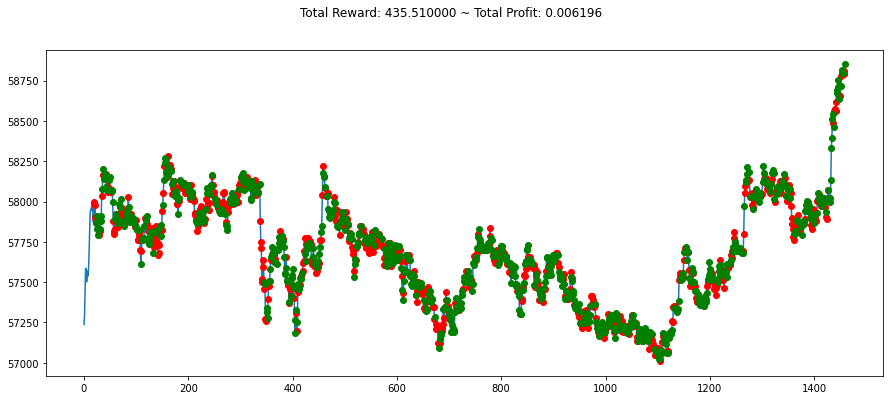

info {'total_reward': -620.0500000000102, 'total_profit': 0.005894166773480972, 'position': 1}


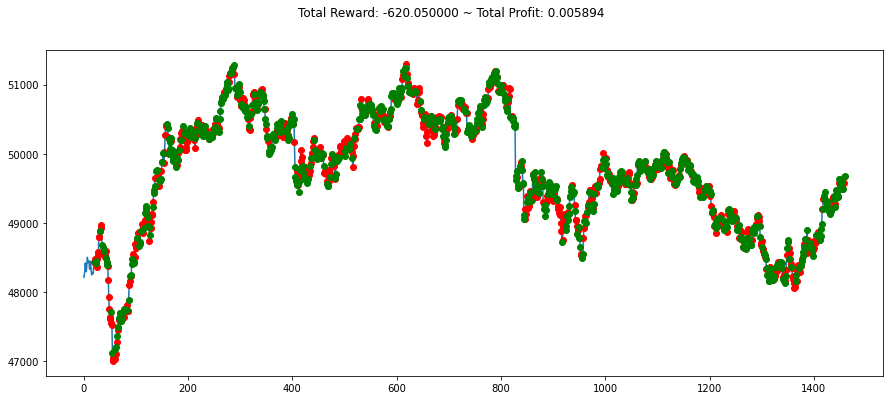

info {'total_reward': -3791.3500000000204, 'total_profit': 0.00385733740274573, 'position': 1}


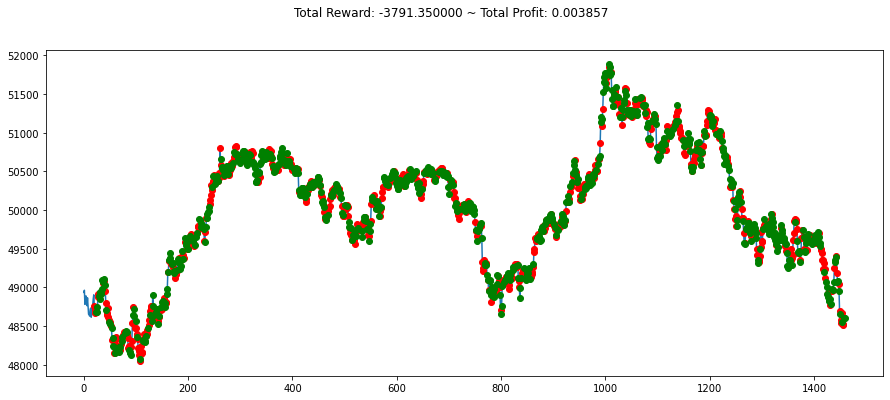

info {'total_reward': -2285.8799999999683, 'total_profit': 0.003498203190515448, 'position': 1}


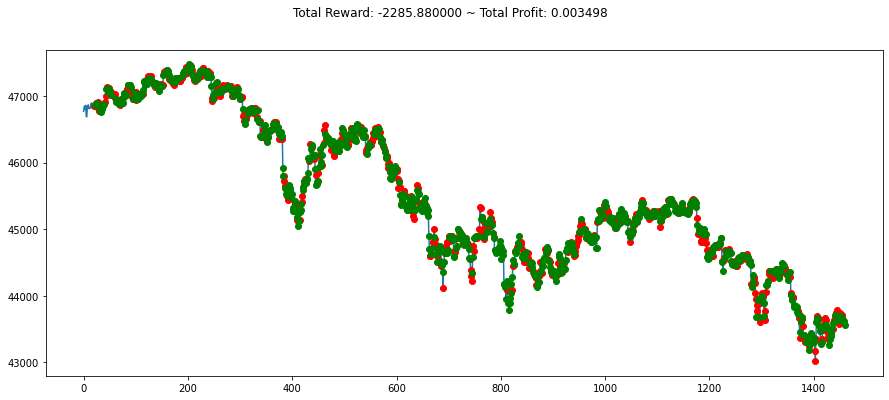

info {'total_reward': -1913.1099999999642, 'total_profit': 0.0038908469593479673, 'position': 1}


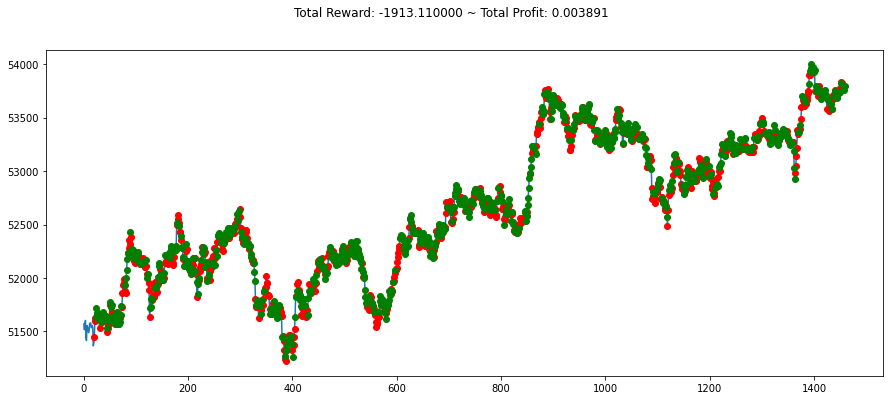

info {'total_reward': -607.1799999999712, 'total_profit': 0.005152682746120015, 'position': 1}


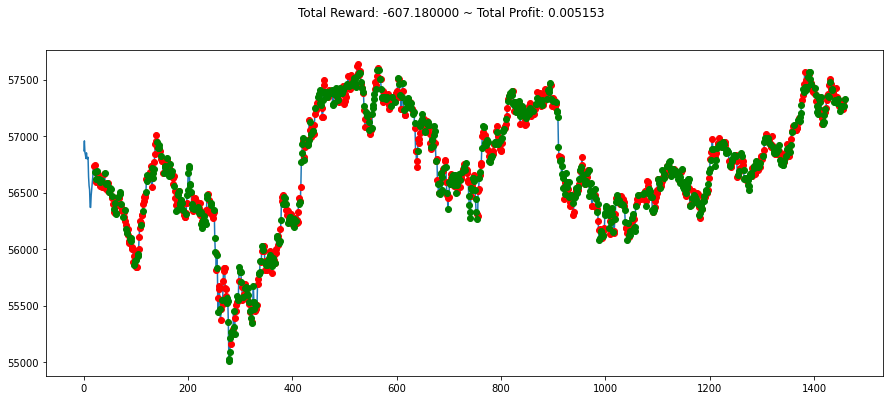

info {'total_reward': -599.310000000005, 'total_profit': 0.004296767988323886, 'position': 0}


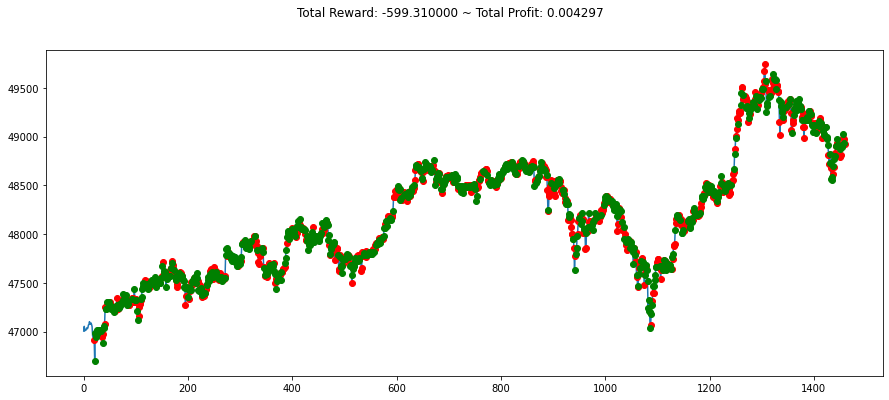

info {'total_reward': 255.18999999992957, 'total_profit': 0.00451256206699526, 'position': 1}


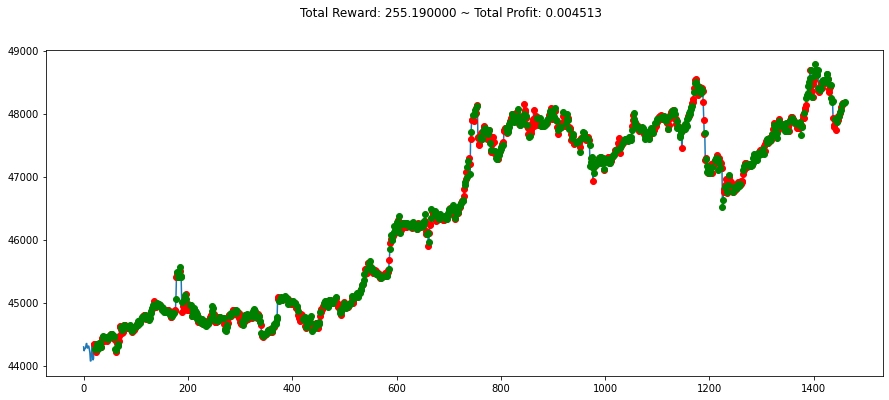

info {'total_reward': -861.980000000025, 'total_profit': 0.004344969225872424, 'position': 0}


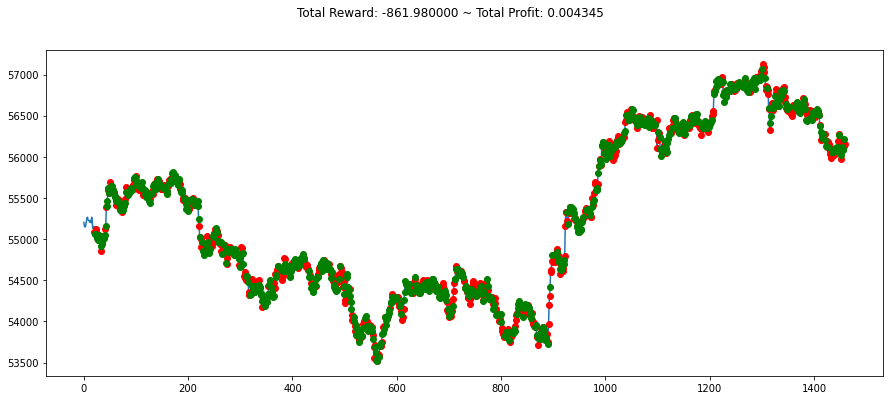

info {'total_reward': 533.4600000000428, 'total_profit': 0.004806620421541636, 'position': 0}


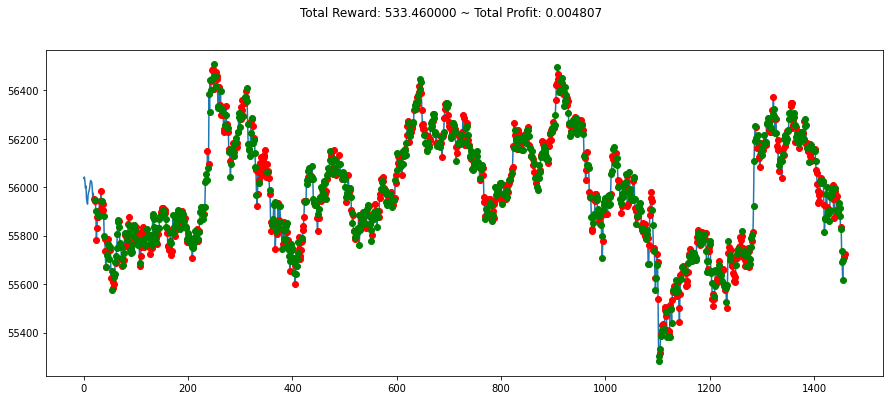

info {'total_reward': -85.41000000014901, 'total_profit': 0.0036251905407021366, 'position': 0}


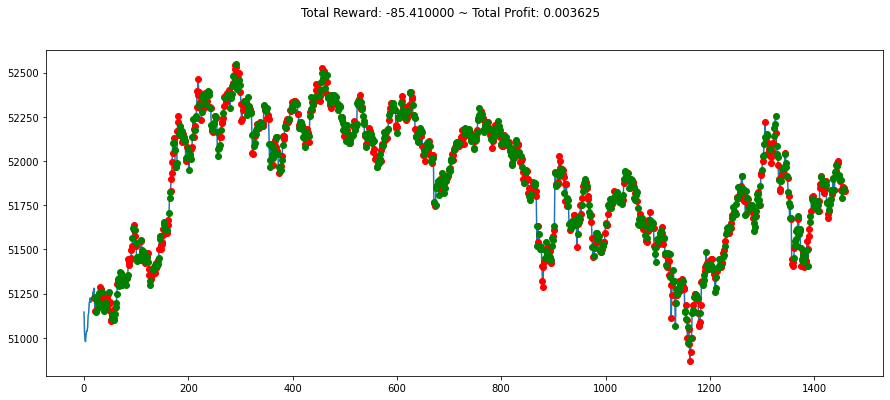

info {'total_reward': 1350.9599999999919, 'total_profit': 0.004131186107262694, 'position': 0}


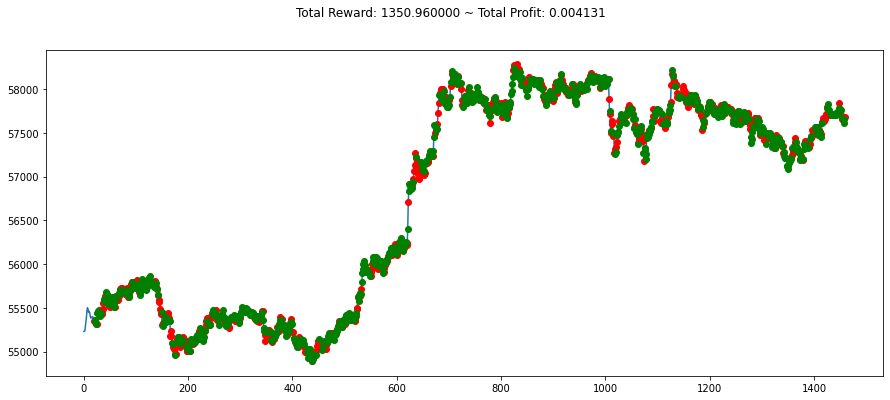

info {'total_reward': 2312.0799999999217, 'total_profit': 0.004816292482159443, 'position': 1}


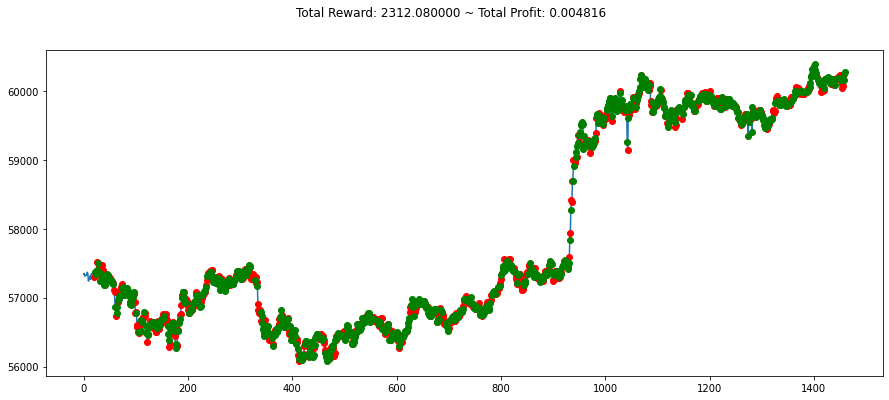

info {'total_reward': -81.59000000001834, 'total_profit': 0.004826474010102899, 'position': 1}


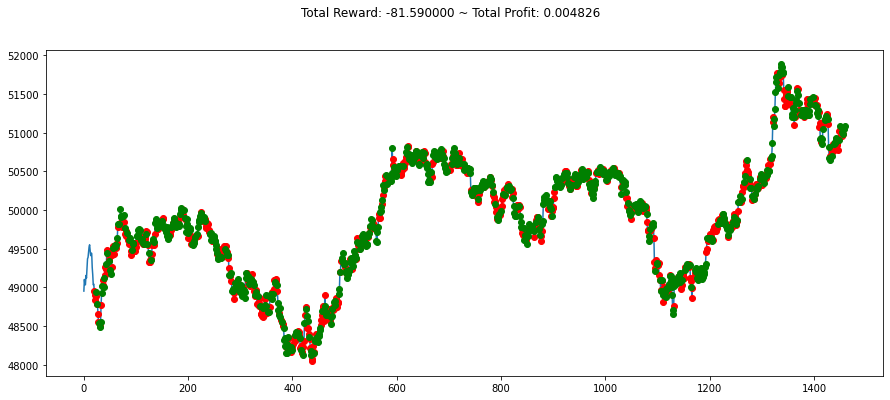

Volume,Volume_(currency), Rsi, Macd: A2C Model 30-random-days Average Profit: 0.004442713163390237 %


In [85]:
import os
import random

score_timeseries_noprice_A2C=[]
for i in days_num:
    env_price_timeseries= MyCustomTimeSeries_noprice(df=stock1, window_size=20, frame_bound=(i,i+1440))
    obs=env_price_timeseries.reset()
    while True:
        obs=obs[np.newaxis,...]
        action,_states=model_noprice_timeseries_A2C.predict(obs)
        obs,rewards, done, info=env_price_timeseries.step(action)
        if done:
            print("info",info)
            score_timeseries_noprice_A2C.append(info['total_profit'])
            break
    plt.figure(figsize=(15,6))
    plt.cla()
    env_price_timeseries.render_all()
    plt.show()

print("Volume,Volume_(currency), Rsi, Macd: A2C Model 30-random-days Average Profit: "+str(mean(score_timeseries_noprice_A2C))+" %")

# Evaluation

In [91]:
print("score_model_priceonly_PPO: "+ str(mean(score_model_priceonly_PPO)))
print()
print("score_model_priceonly_A2C: "+ str(mean(score_model_priceonly_A2C))) 
print()
print("score_model_noprice_PPO: "+str(mean(score_model_noprice_PPO)))
print()
print("score_model_noprice_A2C: "+ str(mean(score_model_noprice_A2C))) 
print()
print("score_model_priceonly_timeseries_PPO: "+str(mean(score_model_priceonly_timeseries_PPO)))
print()
print("score_model_priceonly_timeseries_A2C: "+ str(mean(score_model_priceonly_timeseries_A2C))) 
print()
print("score_model_timeseries_noprice_PPO: "+ str(mean(score_model_timeseries_noprice_PPO)))
print()
print("score_timeseries_noprice_A2C: "+ str(mean(score_timeseries_noprice_A2C)))




score_model_priceonly_PPO: 0.0068009569210286235

score_model_priceonly_A2C: 0.8524746384411821

score_model_noprice_PPO: 0.004415823743574577

score_model_noprice_A2C: 0.01282053303290136

score_model_priceonly_timeseries_PPO: 0.004877941497365686

score_model_priceonly_timeseries_A2C: 0.013212677069044157

score_model_timeseries_noprice_PPO: 0.005274165296181665

score_timeseries_noprice_A2C: 0.004442713163390237


# Visualize Result

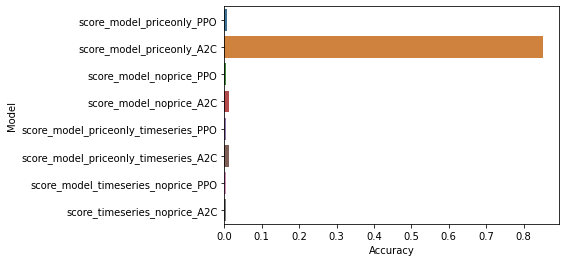

In [98]:
import seaborn as sns
result=pd.DataFrame()
    
result['Model']=['score_model_priceonly_PPO','score_model_priceonly_A2C','score_model_noprice_PPO','score_model_noprice_A2C' 
,'score_model_priceonly_timeseries_PPO','score_model_priceonly_timeseries_A2C','score_model_timeseries_noprice_PPO', 
'score_timeseries_noprice_A2C']
result['Accuracy']=[mean(score_model_priceonly_PPO),mean(score_model_priceonly_A2C),mean(score_model_noprice_PPO),mean(score_model_noprice_A2C) 
,mean(score_model_priceonly_timeseries_PPO),mean(score_model_priceonly_timeseries_A2C),mean(score_model_timeseries_noprice_PPO), 
mean(score_timeseries_noprice_A2C)]

ax = sns.barplot(
        data=result,
        y="Model",
        x="Accuracy",

        saturation=0.6,
    )

# Remove Score_Model_Price_Only_A2c

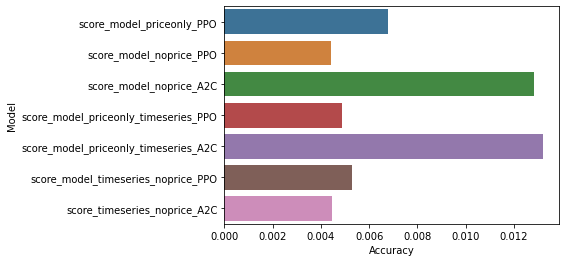

In [99]:
result=pd.DataFrame()
    
result['Model']=['score_model_priceonly_PPO','score_model_noprice_PPO','score_model_noprice_A2C' 
,'score_model_priceonly_timeseries_PPO','score_model_priceonly_timeseries_A2C','score_model_timeseries_noprice_PPO', 
'score_timeseries_noprice_A2C']
result['Accuracy']=[mean(score_model_priceonly_PPO),mean(score_model_noprice_PPO),mean(score_model_noprice_A2C) 
,mean(score_model_priceonly_timeseries_PPO),mean(score_model_priceonly_timeseries_A2C),mean(score_model_timeseries_noprice_PPO), 
mean(score_timeseries_noprice_A2C)]

ax = sns.barplot(
        data=result,
        y="Model",
        x="Accuracy",

        saturation=0.6,
    )

In [ ]:
tensorboard --logdir /Users/danies/Desktop/projects/RLBitcoin/tensorboard

